# Import

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import sys
sys.path.append("..")
import multi_axis as ma
from scipy.ndimage import zoom
import copy
from libertem.utils.generate import hologram_frame
import pandas as pd
import pywt


Bad key "text.kerning_factor" on line 4 in
C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
def plot_2d_mag(mx,my,mz=None,mesh_params=None,Ms=None,s=1, ax=None):
    """ Takes x/y magnetisation projections and creates a plot
        uses quivers for direction and colour for magnitude 
        if mz is None, coloured by magnitude of x/y, else coloured by z"""
    if type(Ms) == type(None):
        Ms = np.max(np.max((mx**2+my**2)**.5))
    
    if ax == None:
        fig = plt.figure(figsize=(4, 4))
        ax = plt.gca()
    #else:
        #fig = ax.gcf()

    if mesh_params == None:
        p1 = (0,0,0)
        sx,sy = np.shape(mx)
        p2 = (sx,sy,sx)
        n = p2
    else:
        p1,p2,n = mesh_params
        
    x = np.linspace(p1[0],p2[0],num=n[0])
    y = np.linspace(p1[1],p2[1],num=n[1])
    xs,ys = np.meshgrid(x,y)
    
    ax.quiver(xs[::s,::s],ys[::s,::s],mx[::s,::s].T,my[::s,::s].T,pivot='mid',scale=Ms*15,width=0.009,headaxislength=5,headwidth=4,minshaft=1.8)
    if type(mz) == type(None):
        mag = (mx**2+my**2)**.5
    else:
        mag = mz
    ax.imshow(mag.T,origin='lower',extent=[p1[0],p2[0],p1[1],p2[1]],vmin=-Ms,vmax=Ms,cmap='RdBu')
#     cbar = plt.colorbar(fraction=0.046, pad=0.04)
#     if type(mz) ==type(None):
#         cbar.set_label('$|M_{\perp}$| / $A $', rotation=-270,fontsize=15)

#     else:
#         cbar.set_label('$M_z$', rotation=-270,fontsize=15)
    ax.set_xlabel('x / m',fontsize=15)
    ax.set_ylabel('y / m',fontsize=15)
    
def algorithm_test(path,mesh_params,BX,BY,BZ,MX=None,MY=None,MZ=None,phis=None,AX=None,AY=None,AZ=None, ntilts=[10], noises=[False],aranges=[90],nmajs=[5],threshes=[(.1,.7)], nmins=[20],multi=True,dual=True,n_pad=100, algorithms = ['SIRT3D_CUDA'],reg_weights=[0.001],noise_vals={'n':1,'fringe':20,'fxc':597,'fyc':566,'rc':50}):
    """ Tests the algorithm for a given M/B/A input over specified tilt,angle,nmaj,nmin ranges for dual/multi scheme 
        
        ntilts = Total number of images in tilt series
        aranges = maximum +ve tilt angle
        nmajs = number of major updates
        nmins = number of minor updates
        multi = test on multi-axis algorithm
        dual = test on dual-axis algorithm
        noises = add preset amount of noise to data
        threshes = 
        """
    # Initialise a dataframe with all the headings we want
    df = pd.DataFrame(columns=['tilt','a_range','noise','alg','reg_weight','tmin','tmax','nmaj','nmin','dual','multi','cod-mean','codx','cody','codz','ang_diff','mag_diff_mean','mag_diff_x','mag_diff_y','mag_diff_z'])
    
    # Loop over number of tilt images
    for tilt in ntilts:
        # Loop over angle ranges
        for a_range in aranges:
            # Generate dual axis dataset
            as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)
            
            for noise in noises:
                if noise ==True:
                    # pxs = ma.noisy_phase(pxs,noise_level=np.pi/4,maxshift=2)
                    # pys = ma.noisy_phase(pys,noise_level=np.pi/4,maxshift=2)
                    pxs = ma.noisy_phase(pxs,holo=True,n=noise_vals['n'],MX=MX,MY=MY,MZ=MZ,angles=as_x,mesh_params=mesh_params,n_pad=n_pad,fringe=noise_vals['fringe'],fxc=noise_vals['fxc'],fyc=noise_vals['fyc'],rc=noise_vals['rc'])
                    pys = ma.noisy_phase(pys,holo=True,n=noise_vals['n'],MX=MX,MY=MY,MZ=MZ,angles=as_y,mesh_params=mesh_params,n_pad=n_pad,fringe=noise_vals['fringe'],fxc=noise_vals['fxc'],fyc=noise_vals['fyc'],rc=noise_vals['rc'])


                bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)
                angles = np.concatenate([as_x,as_y])
                phis = np.concatenate([pxs,pys],axis=1)
                
                for alg in algorithms:
                    for w in reg_weights:
                        # Loop over Major updates
                        for num, nmaj in enumerate(nmajs):
                            # Loop over minor updates
                            for nmin in nmins: 
                                # Calculate dual-axis result
                                if num == 0 and dual==True:
                                    b1,b2 = ma.dual_axis_reconstruction(bx_p,by_p ,as_x,as_y,mesh_params,niter=nmin,algorithm=alg,weight=w,callback_freq=0)
                                    b3 = ma.dual_axis_bz_from_bxby(b1,b2)

                                    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1[n:-n,n:-n,n:-n])
                                    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2[n:-n,n:-n,n:-n])
                                    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3[n:-n,n:-n,n:-n])

                                    resd = [codx,cody,codz]

                                    # Save result
                                    cod_mean = np.mean(resd)
                                    ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                             b1[n:-n,n:-n,n:-n],b2[n:-n,n:-n,n:-n],b3[n:-n,n:-n,n:-n])
                                    md_mean,md_x,md_y,md_z = mag_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                             b1[n:-n,n:-n,n:-n],b2[n:-n,n:-n,n:-n],b3[n:-n,n:-n,n:-n])
                                    row = [tilt,a_range,noise,alg,w,0,0,nmaj,nmin,True,False,cod_mean,codx,cody,codz,ang_diff,md_mean,md_x,md_y,md_z]
                                    df.loc[0 if pd.isnull(df.index.max()) else df.index.max() + 1]=row
                                    df.to_pickle(path)
                                    print(df.loc[df.index.max():df.index.max()],'\n')

                                # Loop over threshold values
                                for ts in threshes:
                                    # Calculate multi-axis result
                                    if multi == True:
                                        try:
                                            t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin,thresh_range=ts,algorithm=alg,weight=w)

                                            b1,b2,b3 = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

                                            codx = ma.COD(BX[n:-n,n:-n,n:-n],b1[n:-n,n:-n,n:-n])
                                            cody = ma.COD(BY[n:-n,n:-n,n:-n],b2[n:-n,n:-n,n:-n])
                                            codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3[n:-n,n:-n,n:-n])

                                            res = [codx,cody,codz]
                                            cod_mean = np.mean(res)
                                            ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                                     b1[n:-n,n:-n,n:-n],b2[n:-n,n:-n,n:-n],b3[n:-n,n:-n,n:-n])
                                            md_mean,md_x,md_y,md_z = mag_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                                     b1[n:-n,n:-n,n:-n],b2[n:-n,n:-n,n:-n],b3[n:-n,n:-n,n:-n])
                                        except:
                                            cod_mean,codx,cody,codz,ang_diff,md_mean,md_x,md_y,md_z = np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan
                                        tmin,tmax=ts
                                        row = [tilt,a_range,noise,alg,w,tmin,tmax,nmaj,nmin,False,True,cod_mean,codx,cody,codz,ang_diff,md_mean,md_x,md_y,md_z]
                                        df.loc[0 if pd.isnull(df.index.max()) else df.index.max() + 1]=row
                                        df.to_pickle(path)
                                        print(df.loc[df.index.max():df.index.max()],'\n')
                                
                                
def angle_difference(X1,Y1,Z1,X2,Y2,Z2,full_return=False):
    """ Calculates a.b / |a||b| i.e. looks at how aligned 
    phantom and recon are 
    
    Returns the average absolute value of this (1 is best!) """
    V1 = [X1.ravel(),Y1.ravel(),Z1.ravel()]
    V2 = [X2.ravel(),Y2.ravel(),Z2.ravel()]
    
    ang_diff = (V1[0]*V2[0]+V1[1]*V2[1]+V1[2]*V2[2])/((V1[0]**2+V1[1]**2+V1[2]**2)**.5*(V2[0]**2+V2[1]**2+V2[2]**2)**.5)
    ang_diff = np.reshape(ang_diff,np.shape(X1))
    
    # shift and rescale so that all -1 gives score of 0, 0 gives .5, 1 gives 1 
    ang_diff = (ang_diff +1)/2
    mean = np.mean(ang_diff)
    if full_return == True:
        return mean,ang_diff
    else:
        return mean
    
def mag_difference(X1,Y1,Z1,X2,Y2,Z2,full_return=False):
    """ Calculates the absolute difference in magnitude between points
    in the phantom and the recon, normalised by max value in phantom.
    
    Returns the average value of this difference (i.e. 0 best!)"""
    V1 = [X1.ravel(),Y1.ravel(),Z1.ravel()]
    V2 = [X2.ravel(),Y2.ravel(),Z2.ravel()]
    
    mag_diff = (abs((V1[0]**2+V1[1]**2+V1[2]**2)**.5 - (V2[0]**2+V2[1]**2+V2[2]**2)**.5)) / np.max(abs((V1[0]**2+V1[1]**2+V1[2]**2)**.5))
    mag_diff = np.reshape(mag_diff,np.shape(X1))
    
    mx = np.mean((abs((V1[0]**2)**.5 - (V2[0]**2)**.5)) / np.max(abs((V1[0]**2+V1[1]**2+V1[2]**2)**.5)))
    my = np.mean((abs((V1[1]**2)**.5 - (V2[1]**2)**.5)) / np.max(abs((V1[0]**2+V1[1]**2+V1[2]**2)**.5)))
    mz = np.mean((abs((V1[2]**2)**.5 - (V2[2]**2)**.5)) / np.max(abs((V1[0]**2+V1[1]**2+V1[2]**2)**.5)))

    
    mean = np.mean(mag_diff)
    if full_return == True:
        return mean,mx,my,mz,mag_diff
    else:
        return mean,mx,my,mz
    
def plot_test_results(fpath,x_axis='nmin',y_axis='cod-mean',series='tilt',const={'nmaj':10,'a_range':40,'tmin':0.1,'tmax':0.7,'noise':False,'alg':'SIRT3D_CUDA','reg_weight':0.001}, verbose=True,return_vals=False):
    """ Reads in pickled dataframe results from algorithm test and plots everything
    Choose what you want on x and y axes, then choose which variable will be plotted as multiple series,
    then choose the constant values to be used for the final 2 variables"""
    import matplotlib.font_manager
    import matplotlib
    # Set font and colormap for plotting
    font = {'family':'sans-serif','sans-serif':['Arial'],
            'size'   : 14}
    matplotlib.rc('font', **font)
    
    # read in dataframe with results
    df =pd.read_pickle(fpath)
    
    # extract the different parameter ranges used
    params=['tilt','a_range','nmaj','nmin','tmin','tmax','noise','alg','reg_weight']
    param_vals = {}
    
    for p in params:
        column_values = df[[p]]. values. ravel()
        unique_values = pd.unique(column_values)
        param_vals[p]=unique_values
        if p == 'tmin' or p =='tmax':
            if 0 in param_vals[p]:
                param_vals[p] = np.delete(param_vals[p], np.where(param_vals[p] == 0))
        
    keys = list(const.keys())
    nseries = len(param_vals[series])
    
    
    
    if verbose == True:
        for p in param_vals:
            print(p,param_vals[p])
    
    # Multi Axis plotting
    # extract all rows where column is specific value
    a = df.loc[df['dual'] == False]
    cm=0
    if len(a)>=1:
        # extract dataframe corresponding to specified constant values
        
        b = a.loc[a[keys[0]] == const[keys[0]]]
        d = b.loc[b[keys[1]] == const[keys[1]]]
        e = d.loc[d[keys[2]] == const[keys[2]]]
        f = e.loc[e[keys[3]] == const[keys[3]]]
        g = f.loc[f[keys[4]] == const[keys[4]]]
        h = g.loc[g[keys[5]] == const[keys[5]]]
        c = h.loc[h[keys[6]] == const[keys[6]]]
        
        cm = c
        
        cmap = matplotlib.cm.get_cmap('winter')
        for i,s in enumerate(param_vals[series]):
            # cycle through each value of s and plot each one as a series

            # extract final dataframe corresponding to series s
            d = c.loc[c[series] == s]
            
            #print(d)
            # extract the y-data from this dataframe (likely COD)
            yvals = d[y_axis]
            # plot the data
            col = cmap(i/nseries+1/(nseries)/2)
            try:
                plt.plot(param_vals[x_axis],yvals,'o-',label='M - %.3f'%s,color=col)
            except:
                try:
                    plt.plot(param_vals[x_axis],yvals,'o-',label='M - '+s,color=col)
                except:
                    yvals = np.unique(yvals)
                    plt.plot(param_vals[x_axis],yvals,'o-',label='M - %.3f'%s,color=col)
        
   
    # Dual Axis plotting
    a = df.loc[df['dual'] == True]
    cd = 0
    if len(a)>=1:
        # redefine tmin and tmax to 0 so it doesn't get confused
        const['tmin']=0
        const['tmax']=0
        
        # nmaj value defaults to 2 for dual data - override hyperparameter to ensure this
        # if 'nmaj' in const:
        #     const['nmaj']=2

        b = a.loc[a[keys[0]] == const[keys[0]]]
        d = b.loc[b[keys[1]] == const[keys[1]]]
        e = d.loc[d[keys[2]] == const[keys[2]]]
        f = e.loc[e[keys[3]] == const[keys[3]]]
        g = f.loc[f[keys[4]] == const[keys[4]]]
        h = g.loc[g[keys[5]] == const[keys[5]]]
        c = h.loc[h[keys[6]] == const[keys[6]]]
        cd=c
        cmap = matplotlib.cm.get_cmap('hot')
        if series != 'nmaj' and series != 'tmin' and series != 'tmax' :
            for i,s in enumerate(param_vals[series]):
                # cycle through each value of s and plot each one as a series

                # extract final dataframe corresponding to series s
                d = c.loc[c[series] == s]
                #print(d)
                # extract the y-data from this dataframe (likely COD)
                yvals = d[y_axis]
                # plot the data
                col = cmap(i/nseries+1/(nseries)/2)
                try:
                    plt.plot(param_vals[x_axis],yvals,'ro-',label='D - %.3f'%s,color=col)
                except:
                    try:
                        plt.plot(param_vals[x_axis],yvals,'ro-',label='D -'+s,color=col)
                    except:
                        print('Broken!',s) 
                        print(b)
                        print(param_vals[x_axis],yvals)
        else:
            yvals = c[y_axis]
            plt.plot(param_vals[x_axis],yvals,'ro-',label='D')
            
    plt.legend(title=series,loc=[1.02,.1])
    plt.xlabel(x_axis,fontsize=16)
    plt.ylabel(y_axis,fontsize=16)
    plt.title('%s = %.2f, %s = %.2f,%s = %.2f,\n%s = %.2f,%s = %.3f'%(keys[0], const[keys[0]],keys[1], const[keys[1]],keys[2], const[keys[2]],keys[3], const[keys[3]],keys[4], const[keys[4]]))
    
    
    col = df['cod-mean']
    max_val = col.max()
    max_i = col.idxmax()
    
    if verbose == True:
        print('\n Best result')
        print(df.loc[max_i:max_i],'\n')
        
    if return_vals==True:
        return cd,cm
    
def find_lim(X,Y,Z):
    """ Returns the biggest of abs(min) and max of magnitude of X,Y,Z """
    bmag = (X**2+Y**2+Z**2)**0.5
    bmax = np.max(bmag)
    bmin = np.min(bmag)
    blim = np.max([abs(bmax),abs(bmin)])
    
    bmag=np.max([X,Y,Z])
    bmin=np.min([X,Y,Z])
    
    return blim, bmax, bmin

def create_hopfion_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    # Generate hopfion
    MX,MY,MZ = ma.Magnetic_Phantom.hopfion(bbox_length_px=100)
    # Crop out the blank space
    MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
    # Reduce resolution to make the simulation smaller
    x=.66
    MXn=zoom(MX, (x,x,x))
    MYn=zoom(MY, (x,x,x))
    MZn=zoom(MZ, (x,x,x))
    MX,MY,MZ=MXn,MYn,MZn
    # Define mesh parameters
    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,220*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))

    # Calculate A and B
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)
    
    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)
    pys = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs,pys],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ,AX,AY,AZ

def create_bubble_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    name = r'FeGe_220x220x50nm_0B.npy'
    M = np.load(name)
    MX,MY,MZ = M[:,:,:,0],M[:,:,:,1],M[:,:,:,2]

    z=1#.38

    MX=zoom(MX, (z, z, 1))
    MY=zoom(MY, (z, z, 1))
    MZ=zoom(MZ, (z, z, 1))
    
    # mask = np.zeros_like(MX)
    # mask[10:30,10:30,10:30]=1
    # MX = MX*mask
    # MY = MY*mask
    # MZ = MZ*mask
    
    MX,MY,MZ = ma.rotate_magnetisation(MX,MY,MZ,0,0,45)

    h0= np.hanning(40)
    hann2d = np.sqrt(np.outer(h0,h0))

    for i in range(40):
        MX[:,:,i] = MX[:,:,i]*hann2d

    for i in range(40):
        MY[:,:,i] = MY[:,:,i]*hann2d

    for i in range(40):
        MZ[:,:,i] = MZ[:,:,i]*hann2d

    

    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,50*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))
    
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)

    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.9,c=2000)
    pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.9,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs_n,pys_n],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ,AX,AY,AZ

def create_sphere_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    # Generate sphere
    MX,MY,MZ,_ = ma.Magnetic_Phantom.sphere(bbox_length_px=100,rad_m=15e-9)
    # Crop out the blank space
    MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
    # Reduce resolution to make the simulation smaller
    x=.66
    MX=zoom(MX, (x,x,x))
    MY=zoom(MY, (x,x,x))
    MZ=zoom(MZ, (x,x,x))

    MX,MY,MZ = ma.rotate_magnetisation(MX,MY,MZ,30,50,20)

    # Define mesh parameters
    p1 = (0,0,0)
    p2=(100*1e-9,100*1e-9,100*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))

    # Calculate A and B
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)
    
    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.7,c=2000)
    pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.7,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs_n,pys_n],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ,AX,AY,AZ


def create_hopfion_data_ideal(tilt=60,a_range=90):
    """" Defaults to create 30x30 images """
    # Generate hopfion
    MX,MY,MZ = ma.Magnetic_Phantom.hopfion(bbox_length_px=100)
    # Crop out the blank space
    MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
    # Reduce resolution to make the simulation smaller
    x=.66
    MXn=zoom(MX, (x,x,x))
    MYn=zoom(MY, (x,x,x))
    MZn=zoom(MZ, (x,x,x))
    MX,MY,MZ=MXn,MYn,MZn
    # Define mesh parameters
    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,220*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))

    # Calculate A and B
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)
    
    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pxs = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)
    # pys = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs,pys],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ

def create_bubble_data_ideal(tilt=60,a_range=90):
    """" Defaults to create 30x30 images """
    name = r'FeGe_220x220x50nm_0B.npy'
    M = np.load(name)
    MX,MY,MZ = M[:,:,:,0],M[:,:,:,1],M[:,:,:,2]

    z=1#.38

    MX=zoom(MX, (z, z, 1))
    MY=zoom(MY, (z, z, 1))
    MZ=zoom(MZ, (z, z, 1))
    
    #MY = -MY[::1,::-1,::1]
    
    MX,MY,MZ = ma.rotate_magnetisation(MX,MY,MZ,0,0,45)

    h0= np.hanning(40)
    hann2d = np.sqrt(np.outer(h0,h0))

    for i in range(40):
        MX[:,:,i] = MX[:,:,i]*hann2d

    for i in range(40):
        MY[:,:,i] = MY[:,:,i]*hann2d

    for i in range(40):
        MZ[:,:,i] = MZ[:,:,i]*hann2d
        
    

    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,50*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))
    
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)

    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.03,v=.95,c=2000)
    # pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.03,v=.95,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs,pys],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ

def create_skyrmion_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    name = r'skyrmion.npy'
    M = np.load(name)
    MX,MY,MZ = M[:,:,:,0],M[:,:,:,1],M[:,:,:,2]

    z=1#.38

    MX=zoom(MX, (z, z, 1))
    MY=zoom(MY, (z, z, 1))
    MZ=zoom(MZ, (z, z, 1))
    
    #MY = -MY[::1,::-1,::1]

    # h0= np.hanning(40)
    # hann2d = np.sqrt(np.outer(h0,h0))

    # for i in range(40):
    #     MX[:,:,i] = MX[:,:,i]*hann2d

    # for i in range(40):
    #     MY[:,:,i] = MY[:,:,i]*hann2d

    # for i in range(40):
    #     MZ[:,:,i] = MZ[:,:,i]*hann2d

    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,50*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))
    
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)

    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.03,v=.95,c=2000)
    pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.03,v=.95,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs_n,pys_n],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ

def create_sphere_data_ideal(tilt=60,a_range=90):
    """" Defaults to create 30x30 images """
    # Generate sphere
    MX,MY,MZ,_ = ma.Magnetic_Phantom.sphere(bbox_length_px=100,rad_m=15e-9)
    # Crop out the blank space
    MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
    # Reduce resolution to make the simulation smaller
    x=.66
    MX=zoom(MX, (x,x,x))
    MY=zoom(MY, (x,x,x))
    MZ=zoom(MZ, (x,x,x))

    MX,MY,MZ = ma.rotate_magnetisation(MX,MY,MZ,30,50,20)

    # Define mesh parameters
    p1 = (0,0,0)
    p2=(100*1e-9,100*1e-9,100*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))

    # Calculate A and B
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)
    
    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.7,c=2000)
    # pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.7,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs,pys],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params,MX,MY,MZ

def anisodiff(img,niter=1,kappa=50,gamma=0.1,step=(1.,1.),option=1,ploton=False):
    """
    Anisotropic diffusion.
 
    Usage:
    imgout = anisodiff(im, niter, kappa, gamma, option)
 
    Arguments:
            img    - input image
            niter  - number of iterations
            kappa  - conduction coefficient 20-100 ?
            gamma  - max value of .25 for stability
            step   - tuple, the distance between adjacent pixels in (y,x)
            option - 1 Perona Malik diffusion equation No 1
                     2 Perona Malik diffusion equation No 2
            ploton - if True, the image will be plotted on every iteration
 
    Returns:
            imgout   - diffused image.
 
    kappa controls conduction as a function of gradient.  If kappa is low
    small intensity gradients are able to block conduction and hence diffusion
    across step edges.  A large value reduces the influence of intensity
    gradients on conduction.
 
    gamma controls speed of diffusion (you usually want it at a maximum of
    0.25)
 
    step is used to scale the gradients in case the spacing between adjacent
    pixels differs in the x and y axes
 
    Diffusion equation 1 favours high contrast edges over low contrast ones.
    Diffusion equation 2 favours wide regions over smaller ones.
 
    Reference: 
    P. Perona and J. Malik. 
    Scale-space and edge detection using ansotropic diffusion.
    IEEE Transactions on Pattern Analysis and Machine Intelligence, 
    12(7):629-639, July 1990.
 
    Original MATLAB code by Peter Kovesi  
    School of Computer Science & Software Engineering
    The University of Western Australia
    pk @ csse uwa edu au
    <http://www.csse.uwa.edu.au>
 
    Translated to Python and optimised by Alistair Muldal
    Department of Pharmacology
    University of Oxford
    <alistair.muldal@pharm.ox.ac.uk>
 
    June 2000  original version.       
    March 2002 corrected diffusion eqn No 2.
    July 2012 translated to Python
    """
 
    # ...you could always diffuse each color channel independently if you
    # really want
    if img.ndim == 3:
        warnings.warn("Only grayscale images allowed, converting to 2D matrix")
        img = img.mean(2)
 
    # initialize output array
    img = img.astype('float32')
    imgout = img.copy()
 
    # initialize some internal variables
    deltaS = np.zeros_like(imgout)
    deltaE = deltaS.copy()
    NS = deltaS.copy()
    EW = deltaS.copy()
    gS = np.ones_like(imgout)
    gE = gS.copy()
 
    # create the plot figure, if requested
    if ploton:
        import pylab as pl
        from time import sleep
 
        fig = pl.figure(figsize=(20,5.5),num="Anisotropic diffusion")
        ax1,ax2 = fig.add_subplot(1,2,1),fig.add_subplot(1,2,2)
 
        ax1.imshow(img,interpolation='nearest')
        ih = ax2.imshow(imgout,interpolation='nearest',animated=True)
        ax1.set_title("Original image")
        ax2.set_title("Iteration 0")
 
        fig.canvas.draw()
 
    for ii in range(niter):
 
        # calculate the diffs
        deltaS[:-1,: ] = np.diff(imgout,axis=0)
        deltaE[: ,:-1] = np.diff(imgout,axis=1)
 
        # conduction gradients (only need to compute one per dim!)
        if option == 1:
            gS = np.exp(-(deltaS/kappa)**2.)/step[0]
            gE = np.exp(-(deltaE/kappa)**2.)/step[1]
        elif option == 2:
            gS = 1./(1.+(deltaS/kappa)**2.)/step[0]
            gE = 1./(1.+(deltaE/kappa)**2.)/step[1]
 
        # update matrices
        E = gE*deltaE
        S = gS*deltaS
 
        # subtract a copy that has been shifted 'North/West' by one
        # pixel. don't as questions. just do it. trust me.
        NS[:] = S
        EW[:] = E
        NS[1:,:] -= S[:-1,:]
        EW[:,1:] -= E[:,:-1]
 
        # update the image
        imgout += gamma*(NS+EW)
 
        if ploton:
            iterstring = "Iteration %i" %(ii+1)
            ih.set_data(imgout)
            ax2.set_title(iterstring)
            fig.canvas.draw()
            # sleep(0.01)
 
    return imgout

In [3]:
def plot_3d_B_slice(bx,by,bz,i_slice=None,mesh_params=None, ax=None,s=5,scale=7,mag_res=0.1, oslice='z',quiver=True, cbar=False,B_contour=True,phase=None,phase_res=np.pi/50):
    """ Plot projected B field
    quiver = turn on/off the arrows
    s = quiver density
    scale = quiver arrow size
    B_contour = turn on/off |B| contour lines
    mag_res = spacing of |B| contour lines in T
    phase = pass phase shifts to plot phase contours
    phase_res = spacing of phase contours in radians
    """
    if ax == None:
        fig,ax = plt.subplots()
    
    if mesh_params == None:
        p1 = (0,0,0)
        sh = np.shape(bx)
        p2 = (sh[0],sh[1],sh[0])
        n = p2
        mesh_params = [p1,p2,n]
        
    if type(i_slice) is type(None):
        i_slice=int(np.shape(bz)[2]/2)
        
    bx=copy.deepcopy(bx)
    by=copy.deepcopy(by)
    bz=copy.deepcopy(bz)
        
    bmax = np.max((bx**2+by**2+bz**2)**0.5)
    
    
    if oslice == 'z':
        mag_B = ((bx**2+by**2)**0.5)[:,:,i_slice]
        bx=bx[:,:,i_slice]
        by=by[:,:,i_slice]
        bz=bz[:,:,i_slice]
        mag_B = np.hypot(bx,by)
        
    if oslice == 'y':
        mag_B = ((bx**2+bz**2)**0.5)[:,i_slice,:]
        bx=bx[:,i_slice,:]
        by=by[:,i_slice,:]
        bz=bz[:,i_slice,:]
        mag_B = np.hypot(bx,bz)
        
    if oslice == 'x':
        mag_B = ((bz**2+by**2)**0.5)[i_slice,:,:]
        bx=bx[i_slice,:,:]
        by=by[i_slice,:,:]
        bz=bz[i_slice,:,:]
        mag_B = np.hypot(bz,by)
        
        
    
    p1,p2,n = mesh_params
    

    

    # plot BZ a colour
    # using tan-1(vy/vx)
    im=ax.imshow(bz.T,origin='lower', 
               extent=[p1[0], p2[0], p1[1],p2[1]], cmap='RdBu',vmin=-bmax,vmax=bmax)
    if cbar==True:
        fig=plt.gcf()
        fig.subplots_adjust(right=0.8)
        cbar_ax = fig.add_axes([1, 0.15, 0.01, 0.7])
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label('$B_z$ / T', rotation=-270,fontsize=15)

    # Plot magnitude of B as in black/transparent scale
    # Create alpha contour map
    my_cmap = ma.alpha_cmap()
    ax.imshow(mag_B.T,origin='lower', 
               extent=[p1[0], p2[0], p1[1],p2[1]],interpolation='spline16', cmap=my_cmap,alpha=1,vmin=0,vmax=bmax)

    ax.set_xlabel('x / m', fontsize = 16)
    ax.set_ylabel('y / m', fontsize = 16)
    
    # Quiver plot of Bx,By
    if quiver==True:
        x = np.linspace(p1[0],p2[0],num=n[0])
        y = np.linspace(p1[1],p2[1],num=n[1])
        xs,ys = np.meshgrid(x,y)
        ax.quiver(xs[::s,::s],ys[::s,::s],bx[::s,::s].T,by[::s,::s].T,color='white',scale=bmax*scale,
                  pivot='mid',width=0.013,headaxislength=5,headwidth=4,minshaft=1.8,edgecolors='k',lw=.3)
        
    
    # Contour plot of |B|
    if B_contour==True:
        mag_range = 2*np.max(mag_B)
        n_levels = int(mag_range/mag_res)
        cs = ax.contour(mag_B.T,origin='lower',levels=n_levels, extent=[p1[0], p2[0], p1[1],p2[1]], alpha = .3,colors='white')
        
    # Contour plot of phase
    if type(phase)!=type(None):
        phase_range = (np.max(phase)-np.min(phase))/1e-9
        n_levels = int(phase_range/phase_res)
        cs = ax.contour(phase.T-np.min(phase).T,origin='lower',levels=10, extent=[p1[0], p2[0], p1[1],p2[1]], alpha = .3,colors='white')
    
    ax.axis('off')

## Experimental data

In [3]:
# To convert the files first time round

import hyperspy.api as hs
# from os import listdir
# from os.path import isfile, join

folder = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\CuCo-NWs - George\\'
save_folder = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\CuCo-NWs - George\Extracted\\'

# files = [f for f in listdir(folder) if isfile(join(folder, f))]
# files.pop(-1)

files = ['Tilt-angles X-axis.dm3',
 'Tilt-angles Y-axis.dm3',
 'tsX-magpha-flipped AT.dm3',
 'tsX-magpha-flipped.dm3',
 'tsX.dm3',
 'tsY-magpha-flipped AT.dm3',
 'tsY-magpha-flipped.dm3',
 'tsY.dm3']

for f in files:
    fpath = folder + f
    data = hs.load(fpath)
    data = np.array(data)
    new_f = f.split('.')[0]
    np.save(save_folder+new_f+'.npy',data)

ModuleNotFoundError: No module named 'hyperspy'

In [4]:
# load .npy files properly

folder = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\CuCo-NWs - George\Extracted\\'

files = ['Tilt-angles X-axis',
 'Tilt-angles Y-axis',
 'tsX-magpha-flipped AT',
 'tsX-magpha-flipped',
 'tsX',
 'tsY-magpha-flipped AT',
 'tsY-magpha-flipped',
 'tsY']

# x tilt angles in degrees
as_x = np.load(folder+files[0]+'.npy')
as_x = as_x*180/np.pi
new = []
for a in as_x:
    new.append([a,0,0])
as_x = np.array(new)

# y tilt angles in degrees
as_y = np.load(folder+files[1]+'.npy')
as_y = as_y*180/np.pi
new = []
for a in as_y:
    new.append([0,a,0])
as_y= np.array(new)

i=0
# x phase unflipped
px0 = np.load(folder+files[2+i]+'.npy')
px0 = np.transpose(px0,[1,0,2])

# y phase unflipped
py0 = np.load(folder+files[5+i]+'.npy')
py0 = np.transpose(py0,[1,0,2])

i=2
# x phase flipped & aligned
px2 = np.load(folder+files[2+i]+'.npy')
px2 = np.transpose(px2,[1,0,2])

# y phase flipped & aligned
py2 = np.load(folder+files[5+i]+'.npy')
py2 = np.transpose(py2,[1,0,2])

# Calculate magnetic phase shift
px = (px0-px2)/2
py = (py0-py2)/2

# Crop x to same shape as y

    # from skimage.feature import register_translation
    # from skimage.filters import prewitt, median, sobel, gabor, gaussian

    # a = px[112:-112,23,112:-112]
    # b = py[:,23,:]

    # ref = gaussian(sobel(b),1.5)
    # im = gaussian(sobel(a),1.5)
    # h0= np.hanning(np.size(ref,0))
    # h1= np.hanning(np.size(ref,1))
    # hann2d = np.sqrt(np.outer(h0,h1))
    # ref= hann2d*ref
    # im = hann2d*im

    # shift, error, diffphase = register_translation(ref,im, 100)

    ## Having used cross-correlation to define shift between two stacks!
px = px[38:-186,:,135:-89]

# Apply smoothing
test = []
s = np.shape(px)[1]
for i in range(s):
    im = px[:,i,:]
    im = anisodiff(im,niter=20,gamma=.2,kappa=30,option=2)
    test.append(im)
test = np.transpose(test,axes=[1,0,2])
px = test

test = []
s = np.shape(py)[1]
for i in range(s):
    im = py[:,i,:]
    im = anisodiff(im,niter=20,gamma=.2,kappa=30,option=2)
    test.append(im)
test = np.transpose(test,axes=[1,0,2])
py = test

# pad data
# n_pad=112#624
# px = np.pad(px,((n_pad,n_pad),(0,0),(n_pad,n_pad)))
# py = np.pad(py,((n_pad,n_pad),(0,0),(n_pad,n_pad)))

# Get shape to 512x512
    # Crop a small amount
px = px[50:-50,:,50:-50]
py = py[50:-50,:,50:-50]

    # Zoom a small amount
px = zoom(px,(.731,1,.731))
py = zoom(py,(.731,1,.731))

# Align axis - determined manually
from skimage.transform import iradon, AffineTransform, warp, rotate
shiftX=20 # +ve shifts left
shiftY=54 # +ve shifts up
OriginalSinogram = np.transpose(px,axes=[2,0,1])
tformTrans = AffineTransform(translation=(shiftY,shiftX))
sinogram= warp(OriginalSinogram,tformTrans) 
sinogram=np.transpose(sinogram,axes=[1,2,0])
px = sinogram

OriginalSinogram = np.transpose(py,axes=[2,0,1])
tformTrans = AffineTransform(translation=(shiftY,shiftX))
sinogram= warp(OriginalSinogram,tformTrans) 
sinogram=np.transpose(sinogram,axes=[1,2,0])
py = sinogram

# Define resolution
x = .9e-6 # very rough! probs needs changing
p1 = (0,0,0)
p2 = (x,x,x)
n = (512,512,512)
mesh_params = [p1,p2,n]

# Multi axis data
angles = np.concatenate([as_x,as_y])
phis = np.concatenate([px,py],axis=1)

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\scipy\ndimage\interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [218]:
original_res = 0.977
zoom_factor = 0.731

final_res = original_res*1/zoom_factor
final_res # nm

1.3365253077975376

In [5]:
# Check what it looks like
ma.plot_phases_interactive(px,as_x)
ma.plot_phases_interactive(py,as_y)

interactive(children=(IntSlider(value=22, description='i', max=45), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=23, description='i', max=47), Output()), _dom_classes=('widget-interact'…

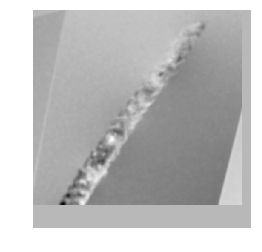

In [33]:
n = np.shape(py)[1]
for i in range(n):
    plt.imshow(py[:,i,:],cmap='Greys')
    plt.axis('off')
    plt.savefig(r'C:\Users\Sauron\Documents\grl31\CuCo NWs\Gif\y\\0%i.png'%i)

In [34]:
images = []
for i in range(n):
    fpath = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\Gif\y\\0%i.png'%i
    images.append(imageio.imread(fpath))
    
for i in range(n-1,0,-1):
    fpath = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\Gif\y\\0%i.png'%i
    images.append(imageio.imread(fpath))
    
imageio.mimsave(r'C:\Users\Sauron\Documents\grl31\CuCo NWs\Gif\\moviey.gif', images)

47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3
2
1


In [30]:
len(images)

46

((512, 46, 512), (512, 48, 512))

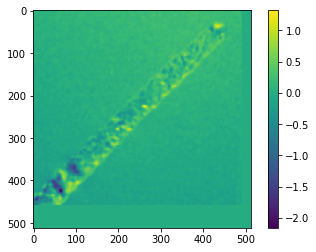

In [286]:
# Double check alignment at 0 tilt
plt.imshow(px[:,23,:]-py[:,23,:])
plt.colorbar()
np.shape(px),np.shape(py)

In [5]:
import astra
astra.astra.set_gpu_index(0,memory=5e9)

In [396]:
nmin = 15
px = px
py = py
angx= as_x
angy= as_y
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

x1,x2,x3 = ma.rotate_magnetisation(b1d,b2d,b3d,-30,-10,45)
np.save('Data/CuCo_conv-n15.npy',[x1,x2,x3])
#ma.save_B_to_paraview('Data/CuCo_conv-n5',x1,x2,x3)

In [397]:
nmin = 30
px = px
py = py
angx= as_x
angy= as_y
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

x1,x2,x3 = ma.rotate_magnetisation(b1d,b2d,b3d,-30,-10,45)
np.save('Data/CuCo_conv-n30.npy',[x1,x2,x3])

In [398]:
nmaj=3
nmin=5
weight=8e-4
th1,th2=.6,.8
n_pad=1

t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

x1,x2,x3 = ma.rotate_magnetisation(b1m,b2m,b3m,-30,-10,45)
np.save('Data/CuCo_wrap-n5-w8e4.npy',[x1,x2,x3])
#ma.save_B_to_paraview('Data/CuCo_wrap-n5-w2e3',x1,x2,x3)

..\multi_axis.py:2578: RuntimeWarning: divide by zero encountered in true_divide
  new_x = weight_phases(new_x,1/ws[:,0])
..\multi_axis.py:2565: RuntimeWarning: invalid value encountered in multiply
  new_p = p*w
..\multi_axis.py:2581: RuntimeWarning: divide by zero encountered in true_divide
  new_y = weight_phases(new_y,1/ws[:,1])


Initialised
 Iter   Time      primal          gap        violation       step     
   0%    10s     3.640e-02     9.992e-01          0        0.000e+00  
  20%    55s     2.807e-02     7.987e-01          0        1.000e+00  
  40%    1m38    2.443e-02     7.052e-01          0        4.007e-01  
  60%    2m21    2.224e-02     6.447e-01          0        2.421e-01  
  80%    3m 4    2.067e-02     5.989e-01          0        1.747e-01  
 100%    3m48    1.945e-02     5.617e-01          0        1.383e-01  

 Iter   Time      primal          gap        violation       step     
   0%    10s     2.115e-02     9.992e-01          0        0.000e+00  
  20%    53s     1.231e-02     8.191e-01          0        1.000e+00  
  40%    1m37    9.222e-03     6.754e-01          0        3.743e-01  
  60%    2m20    7.700e-03     5.604e-01          0        2.133e-01  
  80%    3m 4    6.795e-03     4.677e-01          0        1.455e-01  
 100%    3m46    6.185e-03     3.928e-01          0        1.103

In [399]:
nmaj=3
nmin=15
weight=1e-3
th1,th2=.6,.8
n_pad=1

t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

x1,x2,x3 = ma.rotate_magnetisation(b1m,b2m,b3m,-30,-10,45)
np.save('Data/CuCo_wrap-n15-w1e3.npy',[x1,x2,x3])

Initialised
 Iter   Time      primal          gap        violation       step     
   0%    10s     3.640e-02     9.990e-01          0        0.000e+00  
   6%    55s     2.811e-02     7.985e-01          0        1.000e+00  
  13%    1m38    2.450e-02     7.051e-01          0        4.005e-01  
  20%    2m21    2.233e-02     6.445e-01          0        2.419e-01  
  26%    3m 3    2.078e-02     5.988e-01          0        1.746e-01  
  33%    3m46    1.957e-02     5.616e-01          0        1.381e-01  
  40%    4m29    1.857e-02     5.300e-01          0        1.152e-01  
  46%    5m11    1.772e-02     5.118e-01          0        9.924e-02  
  53%    5m54    1.698e-02     4.928e-01          0        8.751e-02  
  60%    6m36    1.632e-02     4.736e-01          0        7.848e-02  
  66%    7m19    1.573e-02     4.547e-01          0        7.128e-02  
  73%    8m 2    1.519e-02     4.362e-01          0        6.539e-02  
  80%    8m45    1.470e-02     4.182e-01          0        6.046e

In [400]:
nmaj=3
nmin=30
weight=1e-3
th1,th2=.6,.8
n_pad=1

t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

x1,x2,x3 = ma.rotate_magnetisation(b1m,b2m,b3m,-30,-10,45)
np.save('Data/CuCo_wrap-n30-w1e3.npy',[x1,x2,x3])

Initialised
 Iter   Time      primal          gap        violation       step     
   0%    10s     3.640e-02     9.990e-01          0        0.000e+00  
   3%    54s     2.811e-02     7.985e-01          0        1.000e+00  
   6%    1m37    2.450e-02     7.051e-01          0        4.005e-01  
  10%    2m20    2.233e-02     6.445e-01          0        2.419e-01  
  13%    3m 2    2.078e-02     5.988e-01          0        1.746e-01  
  16%    3m44    1.957e-02     5.616e-01          0        1.381e-01  
  20%    4m27    1.857e-02     5.300e-01          0        1.152e-01  
  23%    5m10    1.772e-02     5.118e-01          0        9.924e-02  
  26%    5m53    1.698e-02     4.928e-01          0        8.751e-02  
  30%    6m35    1.632e-02     4.736e-01          0        7.848e-02  
  33%    7m18    1.573e-02     4.547e-01          0        7.128e-02  
  36%    8m 0    1.519e-02     4.362e-01          0        6.539e-02  
  40%    8m43    1.470e-02     4.182e-01          0        6.046e

In [289]:
nmaj=3
nmin=5
weight=8e-3
th1,th2=.6,.8
n_pad=1

t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

x1,x2,x3 = ma.rotate_magnetisation(b1m,b2m,b3m,-30,-10,45)
np.save('Data/CuCo_wrap-n5-w8e3.npy',[x1,x2,x3])
ma.save_B_to_paraview('Data/CuCo_wrap-n5-w8e3',x1,x2,x3)

Initialised
 Iter   Time      primal          gap        violation       step     
   0%    10s     3.640e-02     9.920e-01          0        0.000e+00  
  20%    54s     2.910e-02     7.927e-01          0        1.000e+00  
  40%    1m37    2.611e-02     6.994e-01          0        3.972e-01  
  60%    2m23    2.442e-02     6.388e-01          0        2.385e-01  
  80%    3m 9    2.327e-02     5.931e-01          0        1.720e-01  
 100%    3m55    2.240e-02     5.561e-01          0        1.364e-01  

 Iter   Time      primal          gap        violation       step     
   0%    10s     2.115e-02     9.920e-01          0        0.000e+00  
  20%    54s     1.351e-02     8.172e-01          0        1.000e+00  
  40%    1m37    1.109e-02     6.757e-01          0        3.699e-01  
  60%    2m20    1.003e-02     5.611e-01          0        2.087e-01  
  80%    3m 4    9.483e-03     4.681e-01          0        1.417e-01  
 100%    3m47    9.164e-03     3.923e-01          0        1.074

In [ ]:
ma.plot_component_orthoslices(b1d,b2d,b3d,i=400,npad=n_pad)

In [261]:
nmin = 5
px = px
py = py
angx= as_x
angy= as_y
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

In [174]:
b3dd = b3d/10

In [262]:
t1,t2,t3 = ma.rotate_magnetisation(b1d,b2d,b3d,-30,-10,45)

KeyboardInterrupt: 

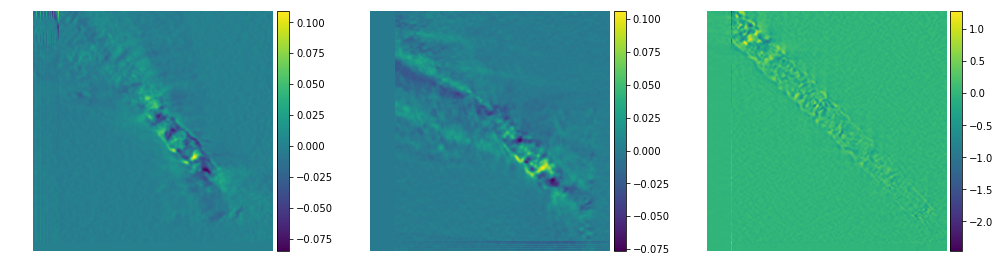

In [276]:
ma.plot_component_orthoslices(b1d,b2d,b3d,i=280,npad=1)

In [49]:
np.save('Data/CuCo_conv-n15.npy',[t1,t2,t3])

In [61]:
# Works if you wait long enough!
ma.save_B_to_paraview('Data/CuCo_conv-n15',t1,t2,t3)

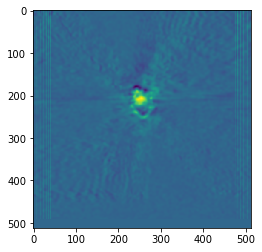

In [281]:
plt.imshow(b1d[:,252,:])

In [401]:
d1,d2,d3 = np.load('Data/CuCo_conv-n5.npy')
dd1,dd2,dd3 = np.load('Data/CuCo_conv-n15.npy')
ddd1,ddd2,ddd3 = np.load('Data/CuCo_conv-n30.npy')


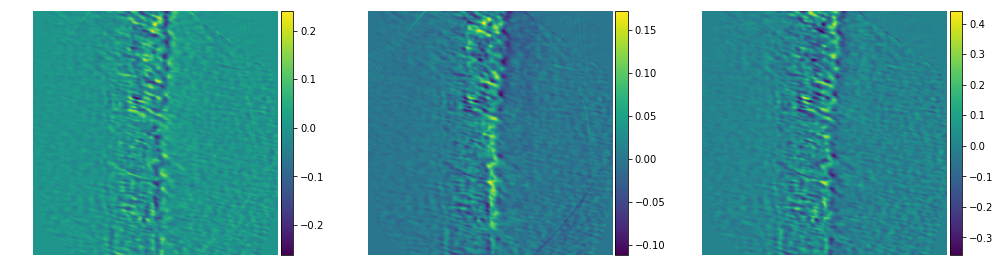

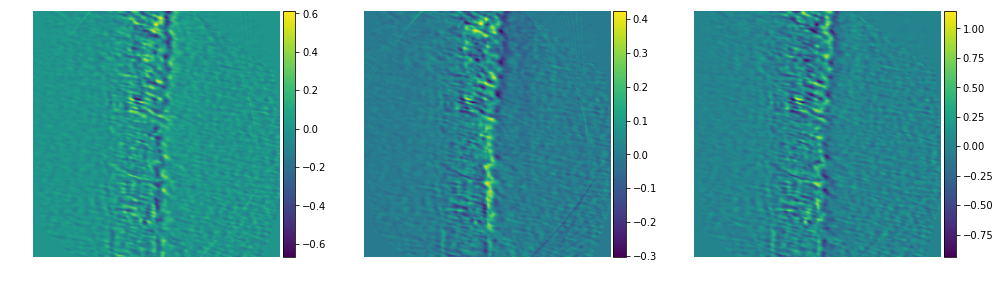

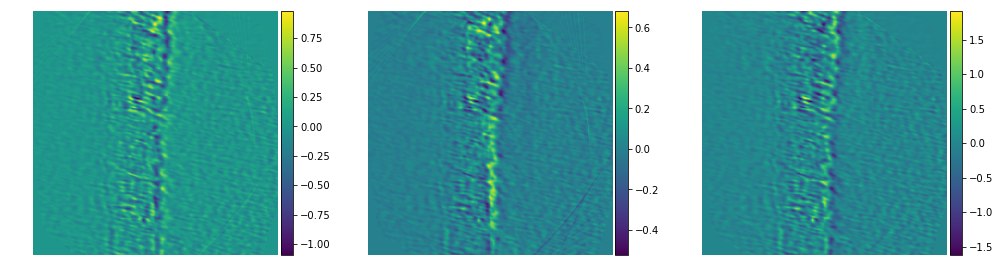

In [469]:
i = 250
o = 'x'
ma.plot_component_orthoslices(d1,d2,d3,i=i,npad=1,oslice=o)
ma.plot_component_orthoslices(dd1,dd2,dd3,i=i,npad=1,oslice=o)
ma.plot_component_orthoslices(ddd1,ddd2,ddd3,i=i,npad=1,oslice=o)


In [455]:
mmm1,mmm2,mmm3 = np.load('Data/CuCo_wrap-n5-w2e3.npy')
# mm1,mm2,mm3 = np.load('Data/CuCo_wrap-n5-w8e4.npy')

m1,m2,m3 = np.load('Data/CuCo_wrap-n15-w1e3.npy')
mm1,mm2,mm3 = np.load('Data/CuCo_wrap-n30-w1e3.npy')

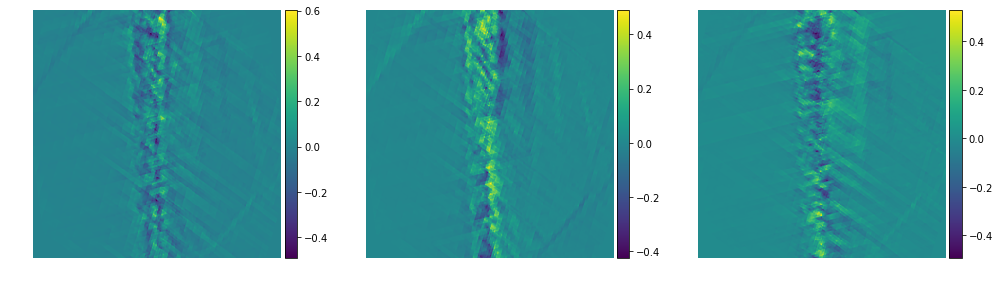

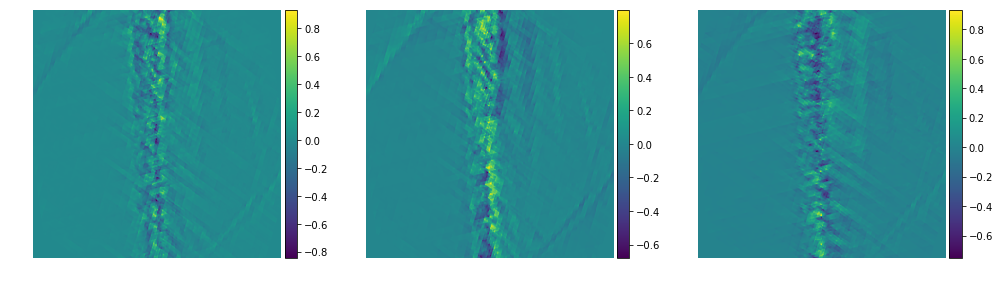

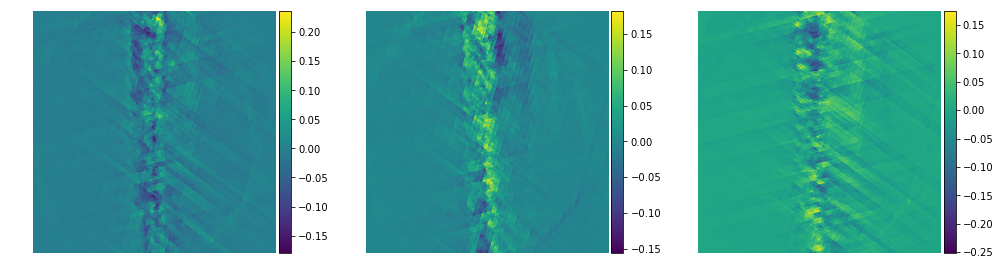

In [468]:
i = 250
o = 'x'
ma.plot_component_orthoslices(m1,m2,m3,i=i,npad=1,oslice=o)
ma.plot_component_orthoslices(mm1,mm2,mm3,i=i,npad=1,oslice=o)
ma.plot_component_orthoslices(mmm1,mmm2,mmm3,i=i,npad=1,oslice=o)

In [480]:
ma.COD(dd1,d1)

0.972412524217706

In [367]:
np.shape(m1[c:-d,:,c:-e])

(72, 512, 102)

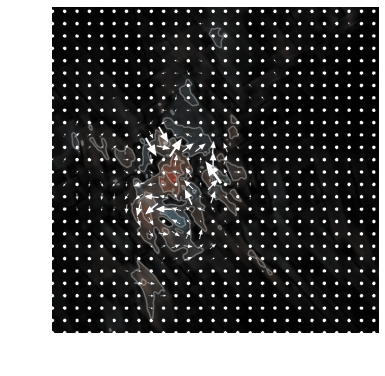

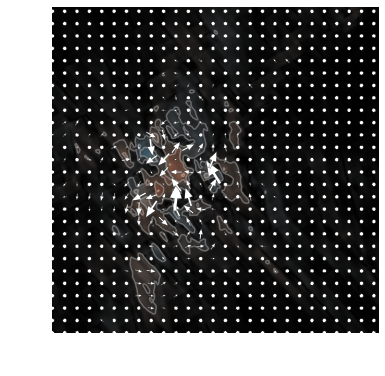

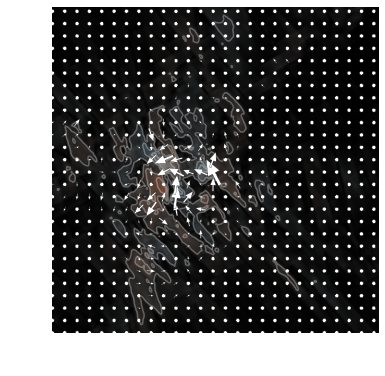

In [452]:
m1,m2,m3 = np.load('Data/CuCo_wrap-n5-w8e4.npy')
f,ax=plt.subplots(figsize=(6,6))

#ma.plot_2d_B(m2[100:400,i,100:400],m3[100:400,i,100:400],quiver=True,ax=ax,B_contour=False,s=2)
c=150
d=150
e=150
i=240-c
plot_3d_B_slice(m1[c:-d,c:-c,c:-e],m2[c:-d,c:-c,c:-e],m3[c:-d,c:-c,c:-e],ax=ax,s=8,oslice='y',scale=7,i_slice=i,quiver=True)
plt.show()

f,ax=plt.subplots(figsize=(6,6))
i+=4
plot_3d_B_slice(m1[c:-d,c:-c,c:-e],m2[c:-d,c:-c,c:-e],m3[c:-d,c:-c,c:-e],ax=ax,s=8,oslice='y',scale=7,i_slice=i,quiver=True)
plt.show()

f,ax=plt.subplots(figsize=(6,6))
i+=4

plot_3d_B_slice(m1[c:-d,c:-c,c:-e],m2[c:-d,c:-c,c:-e],m3[c:-d,c:-c,c:-e],ax=ax,s=8,oslice='y',scale=7,i_slice=i,quiver=True)
plt.show()
#ma.plot_B_series(m1,m2,m3,slices=[250])

In [580]:
nmin = 15
px = px
py = py
angx= as_x
angy= as_y
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

In [581]:
#x1 = anisodiff3(b1d,niter=5,kappa=50,gamma=0.1,step=(1.,1.,1.),option=1,ploton=False)
import scipy
x1 = scipy.ndimage.gaussian_filter(b1d,2)

In [582]:
#x2 = anisodiff3(b2d,niter=5,kappa=50,gamma=0.1,step=(1.,1.,1.),option=1,ploton=False)
x2 = scipy.ndimage.gaussian_filter(b2d,2)

In [583]:
x3 = ma.dual_axis_bz_from_bxby(x1,x2)

In [485]:
def anisodiff3(stack,niter=1,kappa=50,gamma=0.1,step=(1.,1.,1.),option=1,ploton=False):
	"""
	3D Anisotropic diffusion.

	Usage:
	stackout = anisodiff(stack, niter, kappa, gamma, option)

	Arguments:
	        stack  - input stack
	        niter  - number of iterations
	        kappa  - conduction coefficient 20-100 ?
	        gamma  - max value of .25 for stability
	        step   - tuple, the distance between adjacent pixels in (z,y,x)
	        option - 1 Perona Malik diffusion equation No 1
	                 2 Perona Malik diffusion equation No 2
	        ploton - if True, the middle z-plane will be plotted on every 
	        	 iteration

	Returns:
	        stackout   - diffused stack.

	kappa controls conduction as a function of gradient.  If kappa is low
	small intensity gradients are able to block conduction and hence diffusion
	across step edges.  A large value reduces the influence of intensity
	gradients on conduction.

	gamma controls speed of diffusion (you usually want it at a maximum of
	0.25)

	step is used to scale the gradients in case the spacing between adjacent
	pixels differs in the x,y and/or z axes

	Diffusion equation 1 favours high contrast edges over low contrast ones.
	Diffusion equation 2 favours wide regions over smaller ones.

	Reference: 
	P. Perona and J. Malik. 
	Scale-space and edge detection using ansotropic diffusion.
	IEEE Transactions on Pattern Analysis and Machine Intelligence, 
	12(7):629-639, July 1990.

	Original MATLAB code by Peter Kovesi  
	School of Computer Science & Software Engineering
	The University of Western Australia
	pk @ csse uwa edu au
	<http://www.csse.uwa.edu.au>

	Translated to Python and optimised by Alistair Muldal
	Department of Pharmacology
	University of Oxford
	<alistair.muldal@pharm.ox.ac.uk>

	June 2000  original version.       
	March 2002 corrected diffusion eqn No 2.
	July 2012 translated to Python
	"""

	# ...you could always diffuse each color channel independently if you
	# really want
	if stack.ndim == 4:
		warnings.warn("Only grayscale stacks allowed, converting to 3D matrix")
		stack = stack.mean(3)

	# initialize output array
	stack = stack.astype('float32')
	stackout = stack.copy()

	# initialize some internal variables
	deltaS = np.zeros_like(stackout)
	deltaE = deltaS.copy()
	deltaD = deltaS.copy()
	NS = deltaS.copy()
	EW = deltaS.copy()
	UD = deltaS.copy()
	gS = np.ones_like(stackout)
	gE = gS.copy()
	gD = gS.copy()

	# create the plot figure, if requested
	if ploton:
		import pylab as pl
		from time import sleep

		showplane = stack.shape[0]//2

		fig = pl.figure(figsize=(20,5.5),num="Anisotropic diffusion")
		ax1,ax2 = fig.add_subplot(1,2,1),fig.add_subplot(1,2,2)

		ax1.imshow(stack[showplane,...].squeeze(),interpolation='nearest')
		ih = ax2.imshow(stackout[showplane,...].squeeze(),interpolation='nearest',animated=True)
		ax1.set_title("Original stack (Z = %i)" %showplane)
		ax2.set_title("Iteration 0")

		fig.canvas.draw()

	for ii in np.arange(1,niter):

		# calculate the diffs
		deltaD[:-1,: ,:  ] = np.diff(stackout,axis=0)
		deltaS[:  ,:-1,: ] = np.diff(stackout,axis=1)
		deltaE[:  ,: ,:-1] = np.diff(stackout,axis=2)

		# conduction gradients (only need to compute one per dim!)
		if option == 1:
			gD = np.exp(-(deltaD/kappa)**2.)/step[0]
			gS = np.exp(-(deltaS/kappa)**2.)/step[1]
			gE = np.exp(-(deltaE/kappa)**2.)/step[2]
		elif option == 2:
			gD = 1./(1.+(deltaD/kappa)**2.)/step[0]
			gS = 1./(1.+(deltaS/kappa)**2.)/step[1]
			gE = 1./(1.+(deltaE/kappa)**2.)/step[2]

		# update matrices
		D = gD*deltaD
		E = gE*deltaE
		S = gS*deltaS

		# subtract a copy that has been shifted 'Up/North/West' by one
		# pixel. don't as questions. just do it. trust me.
		UD[:] = D
		NS[:] = S
		EW[:] = E
		UD[1:,: ,: ] -= D[:-1,:  ,:  ]
		NS[: ,1:,: ] -= S[:  ,:-1,:  ]
		EW[: ,: ,1:] -= E[:  ,:  ,:-1]

		# update the image
		stackout += gamma*(UD+NS+EW)

		if ploton:
			iterstring = "Iteration %i" %(ii+1)
			ih.set_data(stackout[showplane,...].squeeze())
			ax2.set_title(iterstring)
			fig.canvas.draw()
			# sleep(0.01)

	return stackout

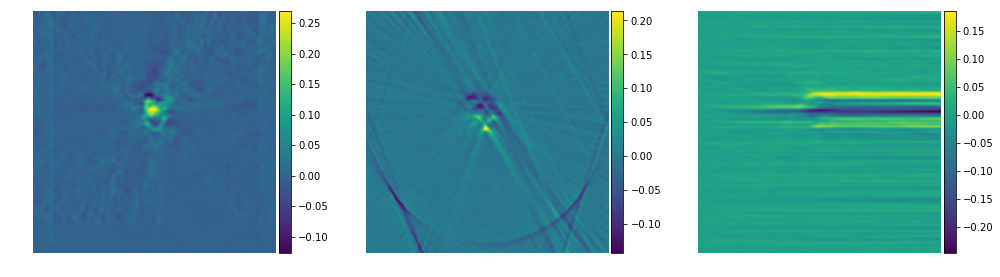

In [504]:
i = 250
o = 'y'
ma.plot_component_orthoslices(x1,x2,x3/5,i=i,npad=1,oslice=o)

In [584]:
x1,x2,x3 = ma.rotate_magnetisation(x1,x2,x3/5,-30,-10,45)
np.save('Data/CuCo_conv-n15-scaled.npy',[x1,x2,x3])

In [585]:
ma.save_B_to_paraview('Data/CuCo_conv-n15-scaled',x1,x2,x3)

### Comparison

In [4]:
d1,d2,d3 = np.load('Data/CuCo_conv-n15-scaled.npy')
m1,m2,m3 = np.load('Data/CuCo_wrap-n5-w2e3.npy')
p = np.load('Data/electro_n200-w01.npy')

In [588]:
ma.COD(m1,d1),ma.COD(m2,d2),ma.COD(m3,d3)

(0.2579813609831696, 0.41555116048499485, 0.044723868812385215)

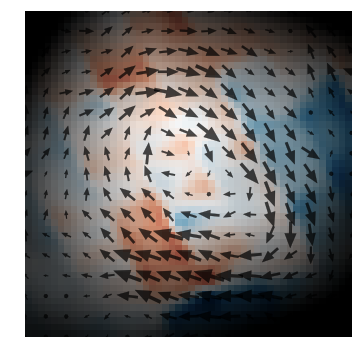

In [264]:
%matplotlib inline
plt.figure(figsize=(6,6))
x1 = m1[205:255,325,225:275]
x2 = m2[205:255,325,225:275]
x3 = m3[205:255,325,225:275]
pp = p[205:255,325,225:275]

s=3
plt.quiver(x1[::s,::s].T,x3[::s,::s].T,pivot='mid',scale=2,width=0.013,headaxislength=5,headwidth=4,minshaft=1.8,edgecolors='k',lw=.3,color='k',alpha=.7)
plt.imshow(x2,extent=[0,16,0,16],cmap='RdBu',vmax=.15,vmin=-.15)

plt.axis('off')
np.max(x2),np.min(x2)

plt.imshow(pp,extent=[0,16,0,16],cmap=ma.alpha_cmap())

In [267]:
np.max(x2),np.min(x2)

(0.1566786, -0.08595896)

In [259]:
np.max(x2),np.min(x2)

(0.14534992, -0.08798571)

Text(0.5, 1.0, '$B_z$ / T')

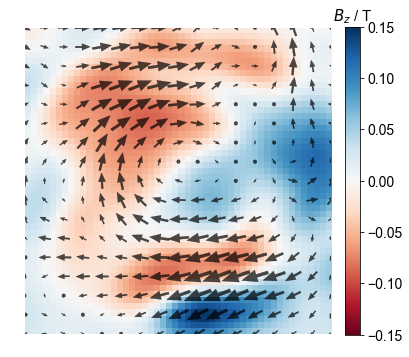

In [283]:
plt.figure(figsize=(6,6))
x1 = d1[205:255,325,225:275]
x2 = d2[205:255,325,225:275]
x3 = d3[205:255,325,225:275]

s=3
plt.quiver(x1[::s,::s].T,x3[::s,::s].T,pivot='mid',scale=2,width=0.013,headaxislength=5,headwidth=4,minshaft=1.8,edgecolors='k',lw=.3,color='k',alpha=.7)
plt.imshow(x2,extent=[0,16,0,16],cmap='RdBu',vmax=.15,vmin=-.15)

plt.axis('off')

np.max(x2),np.min(x2)
#plt.imshow(pp,extent=[0,16,0,16],cmap=ma.alpha_cmap())

cbar = plt.colorbar(fraction=0.046, pad=0.04)
ax=plt.gca()
cbar.ax.tick_params(labelsize=14)
cbar.ax.set_title('$B_z$ / T',fontsize=15)

In [286]:
np.shape(x2)
50*r

67.0

In [287]:
300*r

402.0

### Comparison to original paper

In [405]:
d1,d2,d3 = np.load('Data/CuCo_conv-n15-scaled.npy')
m1,m2,m3 = np.load('Data/CuCo_wrap-n5-w2e3.npy')
p = np.load('Data/electro_n200-w01.npy')

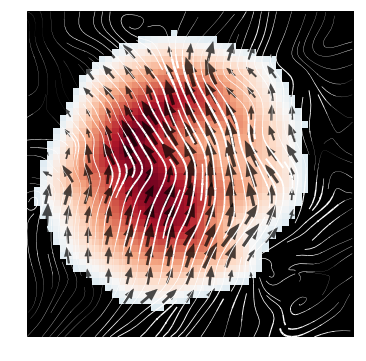

In [47]:
%matplotlib inline
plt.figure(figsize=(6,6))
vs = [430,400,358,330,290,260,215]

x1 = m1[205:255,vs[ii],225:275]
x2 = m2[205:255,vs[ii],225:275]
x3 = m3[205:255,vs[ii],225:275]
pp = p[205:255,vs[ii],225:275]

s=3
plt.quiver(-np.fliplr(x3[::s,::s]),np.fliplr(x1[::s,::s]),pivot='mid',scale=2,width=0.013,headaxislength=5,headwidth=4,minshaft=1.8,edgecolors='k',lw=.3,color='k',alpha=.7)
#plt.imshow(x2,extent=[0,16,0,16],cmap='RdBu',vmax=.15,vmin=-.15)

plt.axis('off')
np.max(x2),np.min(x2)

plt.imshow(pp,extent=[0,16,0,16],cmap='RdBu_r')
mask = copy.deepcopy(pp)
t=.4
mask[mask<t] = 0
mask[mask>t] = 1
plt.imshow(mask,extent=[0,16,0,16],cmap=ma.alpha_cmap())

xs = np.linspace(0,16,num=np.shape(pp)[0])
ys = np.linspace(0,16,num=np.shape(pp)[1])
X,Y = np.meshgrid(xs,ys)
mag = (x1**2+x2**2+x3**2)**0.5
mag = mag/np.max(mag)
plt.streamplot(X,Y,-np.fliplr(x3),np.fliplr(x1),color='w',linewidth=mag**1.7*3,arrowsize=0.01,density=1.5)

In [24]:
np.min(mag)

0.0081240395

In [ ]:
mag_range = (np.max(mag_B)-np.min(mag_B))/1e-9
n_levels = int(mag_range/mag_res)
cs = plt.contour(mag_B.T,origin='lower',levels=10, extent=[p1[0], p2[0], p1[1],p2[1]], alpha = .3,colors='white')

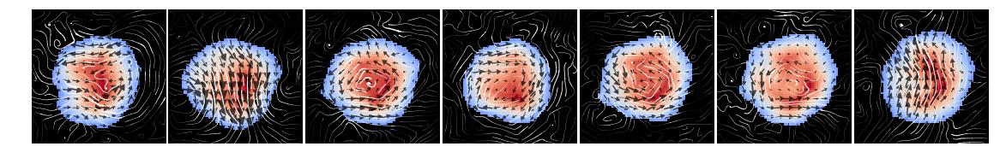

In [53]:
%matplotlib inline
f,axs=plt.subplots(figsize=(20,20),ncols=7,sharey=True)
vs = [430,400,358,330,290,250,215]

for ii in range(len(vs)):
    x1 = m1[200:260,vs[ii],220:280]
    x2 = m2[200:260,vs[ii],220:280]
    x3 = m3[200:260,vs[ii],220:280]
    pp = p[200:260,vs[ii],220:280]

    s=4
    axs[ii].quiver(-np.fliplr((x3[::s,::s])),np.fliplr(x1[::s,::s]),pivot='mid',scale=1.5,width=0.013,headaxislength=5,headwidth=6,minshaft=2.3,edgecolors='k',lw=.3,color='k',alpha=.7)
    #plt.imshow(x2,extent=[0,16,0,16],cmap='RdBu',vmax=.15,vmin=-.15)

    axs[ii].axis('off')
    np.max(x2),np.min(x2)

    ss=int(60/s)
    axs[ii].imshow(pp[::-1,::-1],extent=[0,ss,0,ss],cmap='coolwarm',vmin=.3)
    mask = copy.deepcopy(pp)
    t=.4
    mask[mask<t] = 0
    mask[mask>t] = 1
    axs[ii].imshow(mask[::-1,::-1],extent=[0,ss,0,ss],cmap=ma.alpha_cmap())
    
    xs = np.linspace(0,ss,num=np.shape(pp)[0])
    ys = np.linspace(0,ss,num=np.shape(pp)[1])
    X,Y = np.meshgrid(xs,ys)
    mag = (x1**2+x2**2+x3**2)**0.5
    mag = mag/np.max(mag)
    axs[ii].streamplot(X,Y,-np.fliplr(x3),np.fliplr(x1),color='w',linewidth=mag**1.7*2,arrowsize=0.01,density=1)
    
#plt.tight_layout()
f.subplots_adjust(wspace=0.02)

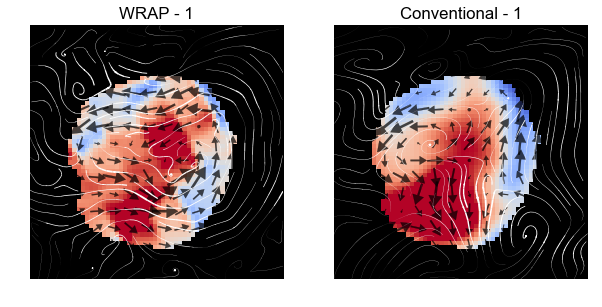

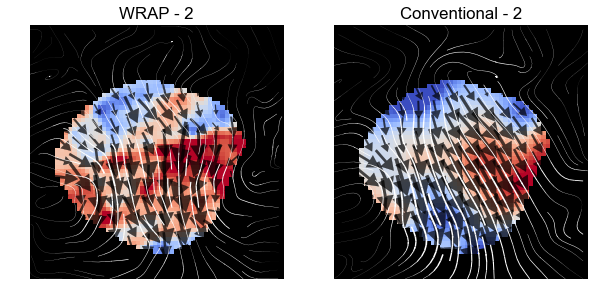

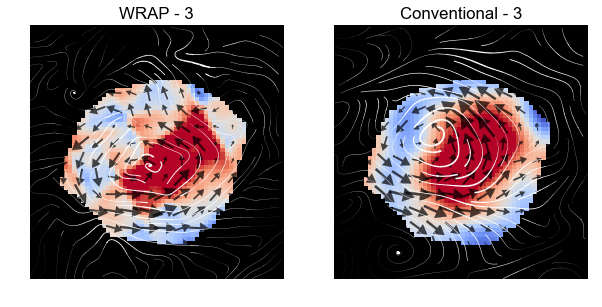

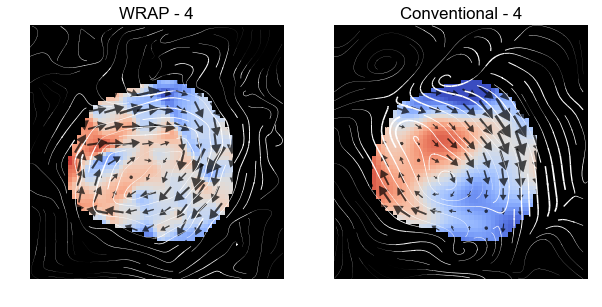

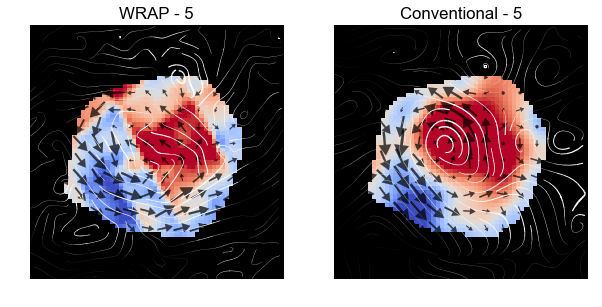

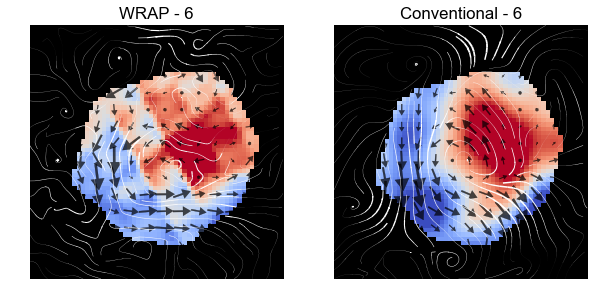

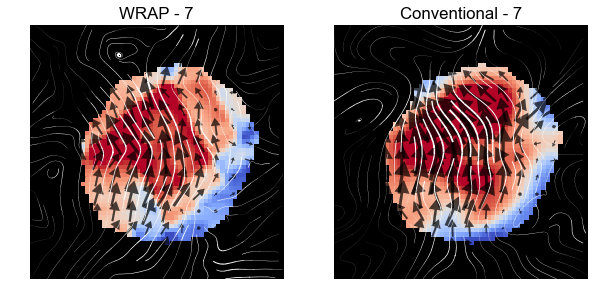

In [423]:


for num,ix in enumerate(vs):
#ix=2
    f,axs=plt.subplots(ncols=2,figsize=(10,5))
    num+=1
    ix=num-1
    x1 = m1[200:260,vs[ix],220:280]
    x2 = m2[200:260,vs[ix],220:280]
    x3 = m3[200:260,vs[ix],220:280]
    pp = p[200:260,vs[ix],220:280]

    ii=0
    s=4
    axs[ii].quiver(-np.fliplr((x3[::s,::s])),np.fliplr(x1[::s,::s]),pivot='mid',scale=1.5,width=0.013,headaxislength=5,headwidth=6,minshaft=2.3,edgecolors='k',lw=.3,color='k',alpha=.7)
    #plt.imshow(x2,extent=[0,16,0,16],cmap='RdBu',vmax=.15,vmin=-.15)

    axs[ii].axis('off')
    np.max(x2),np.min(x2)

    ss=int(60/s)
    axs[ii].imshow(x2[::-1,::-1],extent=[0,ss,0,ss],cmap='coolwarm',vmax=.1,vmin=-0.1)
    mask = copy.deepcopy(pp)
    t=.4
    mask[mask<t] = 0
    mask[mask>t] = 1
    axs[ii].imshow(mask[::-1,::-1],extent=[0,ss,0,ss],cmap=ma.alpha_cmap())

    xs = np.linspace(0,ss,num=np.shape(pp)[0])
    ys = np.linspace(0,ss,num=np.shape(pp)[1])
    X,Y = np.meshgrid(xs,ys)
    mag = (x1**2+x2**2+x3**2)**0.5
    mag = mag/np.max(mag)
    axs[ii].streamplot(X,Y,-np.fliplr(x3),np.fliplr(x1),color='w',linewidth=mag**1.7*2,arrowsize=0.01,density=1)


    x1 = d1[200:260,vs[ix],220:280]
    x2 = d2[200:260,vs[ix],220:280]
    x3 = d3[200:260,vs[ix],220:280]
    pp = p[200:260,vs[ix],220:280]

    ii=1
    s=4
    axs[ii].quiver(-np.fliplr((x3[::s,::s])),np.fliplr(x1[::s,::s]),pivot='mid',scale=1.5,width=0.013,headaxislength=5,headwidth=6,minshaft=2.3,edgecolors='k',lw=.3,color='k',alpha=.7)
    #plt.imshow(x2,extent=[0,16,0,16],cmap='RdBu',vmax=.15,vmin=-.15)

    axs[ii].axis('off')
    np.max(x2),np.min(x2)

    ss=int(60/s)
    axs[ii].imshow(x2[::-1,::-1],extent=[0,ss,0,ss],cmap='coolwarm',vmax=.1,vmin=-0.1)
    mask = copy.deepcopy(pp)
    t=.4
    mask[mask<t] = 0
    mask[mask>t] = 1
    axs[ii].imshow(mask[::-1,::-1],extent=[0,ss,0,ss],cmap=ma.alpha_cmap())

    xs = np.linspace(0,ss,num=np.shape(pp)[0])
    ys = np.linspace(0,ss,num=np.shape(pp)[1])
    X,Y = np.meshgrid(xs,ys)
    mag = (x1**2+x2**2+x3**2)**0.5
    mag = mag/np.max(mag)
    axs[ii].streamplot(X,Y,-np.fliplr(x3),np.fliplr(x1),color='w',linewidth=mag**1.7*2,arrowsize=0.01,density=1)


    import matplotlib
    # Set font and colormap for plotting
    font = {'family':'sans-serif','sans-serif':['Arial'],
            'size'   : 14}
    matplotlib.rc('font', **font)

    axs[0].set_title('WRAP - %i'%num)
    axs[1].set_title('Conventional - %i' %num)

    plt.savefig(r'C:\Users\Sauron\Documents\grl31\CuCo NWs\gif2\%i.png'%num)
    plt.show()

In [426]:
import imageio

In [431]:
import imageio
images = []
for i in range(1,len(vs)+1):
    #num=i+1
    num=i
    fpath = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\gif2\%i.png'%num
    images.append(imageio.imread(fpath))

    
imageio.mimsave(r'C:\Users\Sauron\Documents\grl31\CuCo NWs\newvid.gif', images)

writer = imageio.get_writer(r'C:\Users\Sauron\Documents\grl31\CuCo NWs\newvid.mp4', fps=1)

for im in images:
    writer.append_data(im)
writer.close()

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (720, 360) to (720, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [432]:
np.shape(images)

(7, 360, 720, 4)

## Electrosatic recon

In [54]:
# load .npy files properly

folder = r'C:\Users\Sauron\Documents\grl31\CuCo NWs\CuCo-NWs - George\Extracted\\'

files = ['Tilt-angles X-axis',
 'Tilt-angles Y-axis',
 'tsX-magpha-flipped AT',
 'tsX-magpha-flipped',
 'tsX',
 'tsY-magpha-flipped AT',
 'tsY-magpha-flipped',
 'tsY']

# x tilt angles in degrees
as_x = np.load(folder+files[0]+'.npy')
as_x = as_x*180/np.pi
new = []
for a in as_x:
    new.append([a,0,0])
as_x = np.array(new)

# y tilt angles in degrees
as_y = np.load(folder+files[1]+'.npy')
as_y = as_y*180/np.pi
new = []
for a in as_y:
    new.append([0,a,0])
as_y= np.array(new)

i=0
# x phase unflipped
px0 = np.load(folder+files[2+i]+'.npy')
px0 = np.transpose(px0,[1,0,2])

# y phase unflipped
py0 = np.load(folder+files[5+i]+'.npy')
py0 = np.transpose(py0,[1,0,2])

i=2
# x phase flipped & aligned
px2 = np.load(folder+files[2+i]+'.npy')
px2 = np.transpose(px2,[1,0,2])

# y phase flipped & aligned
py2 = np.load(folder+files[5+i]+'.npy')
py2 = np.transpose(py2,[1,0,2])

# Calculate magnetic phase shift
px = (px0+px2)/2
py = (py0+py2)/2

# Crop x to same shape as y

    # from skimage.feature import register_translation
    # from skimage.filters import prewitt, median, sobel, gabor, gaussian

    # a = px[112:-112,23,112:-112]
    # b = py[:,23,:]

    # ref = gaussian(sobel(b),1.5)
    # im = gaussian(sobel(a),1.5)
    # h0= np.hanning(np.size(ref,0))
    # h1= np.hanning(np.size(ref,1))
    # hann2d = np.sqrt(np.outer(h0,h1))
    # ref= hann2d*ref
    # im = hann2d*im

    # shift, error, diffphase = register_translation(ref,im, 100)

    ## Having used cross-correlation to define shift between two stacks!
px = px[38:-186,:,135:-89]

# Apply smoothing
test = []
s = np.shape(px)[1]
for i in range(s):
    im = px[:,i,:]
    im = anisodiff(im,niter=20,gamma=.2,kappa=30,option=2)
    test.append(im)
test = np.transpose(test,axes=[1,0,2])
px = test

test = []
s = np.shape(py)[1]
for i in range(s):
    im = py[:,i,:]
    im = anisodiff(im,niter=20,gamma=.2,kappa=30,option=2)
    test.append(im)
test = np.transpose(test,axes=[1,0,2])
py = test

# pad data
# n_pad=112#624
# px = np.pad(px,((n_pad,n_pad),(0,0),(n_pad,n_pad)))
# py = np.pad(py,((n_pad,n_pad),(0,0),(n_pad,n_pad)))

# Get shape to 512x512
    # Crop a small amount
px = px[50:-50,:,50:-50]
py = py[50:-50,:,50:-50]

    # Zoom a small amount
px = zoom(px,(.731,1,.731))
py = zoom(py,(.731,1,.731))

# Align axis - determined manually
from skimage.transform import iradon, AffineTransform, warp, rotate
shiftX=20 # +ve shifts left
shiftY=54 # +ve shifts up
OriginalSinogram = np.transpose(px,axes=[2,0,1])
tformTrans = AffineTransform(translation=(shiftY,shiftX))
sinogram= warp(OriginalSinogram,tformTrans) 
sinogram=np.transpose(sinogram,axes=[1,2,0])
px = sinogram

OriginalSinogram = np.transpose(py,axes=[2,0,1])
tformTrans = AffineTransform(translation=(shiftY,shiftX))
sinogram= warp(OriginalSinogram,tformTrans) 
sinogram=np.transpose(sinogram,axes=[1,2,0])
py = sinogram

# Define resolution
x = .9e-6 # very rough! probs needs changing
p1 = (0,0,0)
p2 = (x,x,x)
n = (512,512,512)
mesh_params = [p1,p2,n]

# Multi axis data
angles = np.concatenate([as_x,as_y])
phis = np.concatenate([px,py],axis=1)

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\scipy\ndimage\interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [148]:
np.shape(px0)

(1024, 46, 1024)

In [144]:
.9e-6/512

1.7578125e-09

In [169]:
ma.plot_phases_interactive(phis,angles)

interactive(children=(IntSlider(value=46, description='i', max=93), Output()), _dom_classes=('widget-interact'…

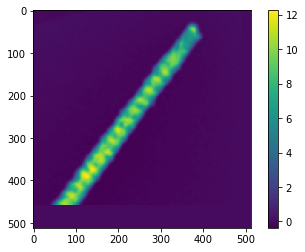

In [174]:
plt.imshow(phis[:,60])
plt.colorbar()

In [55]:
vectors = ma.generate_vectors(angles)
raw_data=phis
#r = ma.generate_reconstruction(raw_data,vectors, algorithm = 'TV1', niter=200, weight = 0.01)
r = ma.generate_reconstruction(raw_data,vectors, algorithm = 'TV1_unnorm', niter=200, weight = 0.01,callback_freq=5)



 Iter   Time      primal          gap        violation       step     
   0%    13s     3.053e+05     1.000e+00     0.000e+00     0.000e+00  
   2%    2m 2    4.927e+04    -4.221e-01     1.977e+01     4.250e-01  
   5%    3m50    2.315e+04    -4.174e-01     3.265e+01     1.622e-01  
   7%    5m37    2.015e+04    -7.317e-02     4.192e+01     8.002e-02  
  10%    7m25    1.918e+04     3.859e-02     4.819e+01     4.337e-02  
  12%    9m12    1.894e+04     1.912e-02     5.235e+01     2.746e-02  
  15%   10m59    1.894e+04     9.349e-03     5.569e+01     1.916e-02  
  17%   12m45    1.902e+04     1.430e-02     5.805e+01     1.466e-02  
  20%   14m31    1.913e+04     2.253e-02     5.972e+01     1.198e-02  
  22%   16m19    1.925e+04     2.928e-02     6.110e+01     1.013e-02  
  25%   18m 4    1.937e+04     3.422e-02     6.215e+01     8.719e-03  
  27%   19m50    1.950e+04     3.810e-02     6.251e+01     7.605e-03  
  30%   21m37    1.962e+04     4.148e-02     6.272e+01     6.706e-03  
  32% 

In [71]:
recon_vector = ma.reorient_reconstruction(r,normalise=False)

In [72]:
x = ma.rotate_bulk(recon_vector,-30,-10,45)

ValueError: Colormap hotcold is not recognized. Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, inferno, inferno_r, jet, jet_r, magma, magma_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, twilight, twilight_r, twilight_shifted, twilight_shifted_r, viridis, viridis_r, winter, winter_r

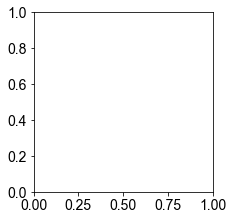

In [403]:


plt.figure(figsize=(12,3.3))


phase = x[::-1,::-1,255][200:350]
#ce = lam*E/np.pi
ce = 0.00653
thickness=1.313 # 0.48 (original pixel size) * 1/0.731 (zoom factor) * 2 (resolution change from hologram to phase image)
MIP = phase/ce/thickness
thresh=10#np.min(MIP)

#im = plt.imshow(MIP,cmap='RdBu_r',vmin=thresh)
im = plt.imshow(MIP,cmap='hotcold',vmin=thresh)
cbar =plt.colorbar(im,fraction=0.046, pad=0.04,ax=plt.gca())
mask = copy.deepcopy(MIP)
mask[mask<thresh]=0
mask[mask>thresh]=1
#mask=1-mask
plt.imshow(mask,cmap=ma.alpha_cmap())
plt.axis('off')


#cbar.set_label('MIP / V', rotation=270)
#plt.tight_layout()

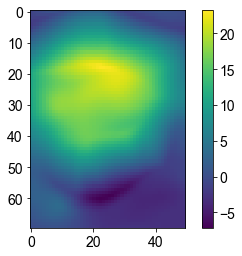

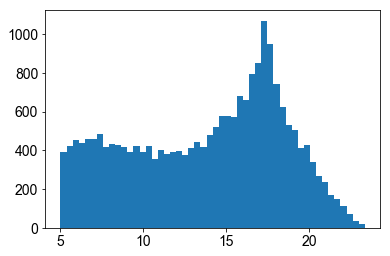

In [399]:
plt.imshow(x[200:270,-180,230:280]/ce/thickness)
plt.colorbar()
plt.show()
arr=x[200:270,150:160,230:280]/ce/thickness
arr = arr.flatten()
arr = np.delete(arr,np.where(arr<5))
plt.hist(arr,bins=50)
plt.show()

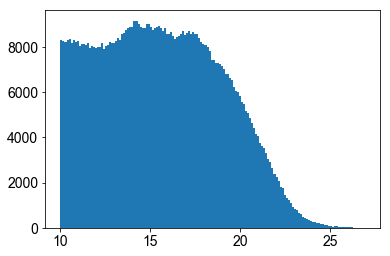

In [337]:
arr = x[200:270,:,220:290]/ce/thickness
flat = arr.flatten()
flat = np.delete(flat,np.where(flat<10))
out = plt.hist(flat,150)
plt.show()

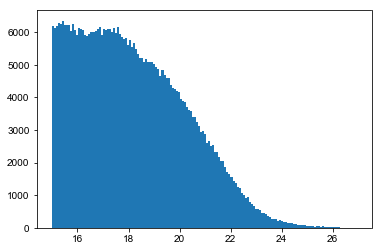

In [268]:
arr = x[200:350,:,200:350]/ce/thickness
flat = arr.flatten()
flat = np.delete(flat,np.where(flat<15))
out = plt.hist(flat,150)
plt.show()

In [184]:
out[1]

array([10.00001871, 10.11282179, 10.22562488, 10.33842796, 10.45123104,
       10.56403412, 10.6768372 , 10.78964029, 10.90244337, 11.01524645,
       11.12804953, 11.24085261, 11.3536557 , 11.46645878, 11.57926186,
       11.69206494, 11.80486802, 11.91767111, 12.03047419, 12.14327727,
       12.25608035, 12.36888343, 12.48168652, 12.5944896 , 12.70729268,
       12.82009576, 12.93289885, 13.04570193, 13.15850501, 13.27130809,
       13.38411117, 13.49691426, 13.60971734, 13.72252042, 13.8353235 ,
       13.94812658, 14.06092967, 14.17373275, 14.28653583, 14.39933891,
       14.51214199, 14.62494508, 14.73774816, 14.85055124, 14.96335432,
       15.07615741, 15.18896049, 15.30176357, 15.41456665, 15.52736973,
       15.64017282, 15.7529759 , 15.86577898, 15.97858206, 16.09138514,
       16.20418823, 16.31699131, 16.42979439, 16.54259747, 16.65540055,
       16.76820364, 16.88100672, 16.9938098 , 17.10661288, 17.21941596,
       17.33221905, 17.44502213, 17.55782521, 17.67062829, 17.78

In [210]:

p = .5
24*(1-p)+13*p

18.5

array([14.06092967, 17.10661288])

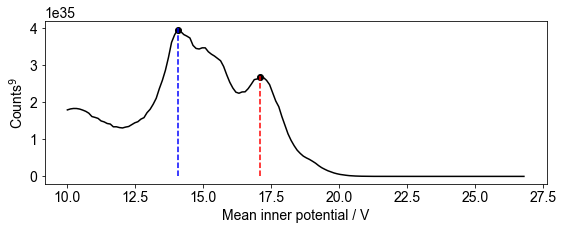

In [402]:
%matplotlib inline
# %matplotlib qt
# import matplotlib
# Set font and colormap for plotting
font = {'family':'sans-serif','sans-serif':['Arial'],
        'size'   : 14}
matplotlib.rc('font', **font)

plt.figure(figsize=(9,3))

from scipy.signal import savgol_filter
smooth = savgol_filter(out[0], 11, 2)
plt.plot(out[1][:-1],smooth**9,'k-')

peaks = scipy.signal.find_peaks(smooth)
peaks = peaks[0]

peaks = [peaks[2],peaks[-1]]
plt.plot(np.array(out[1])[peaks],np.array(smooth**9)[peaks],'ko')

plt.plot([14.06,14.06],[0,4e35],'b--')
plt.plot([17.10,17.10],[0,2.7e35],'r--')



plt.xlabel('Mean inner potential / V')
plt.ylabel('Counts$^9$')

np.array(out[1])[peaks]

# plt.ylim([2e35,3e35])


In [ ]:
14+-1, 17+-1

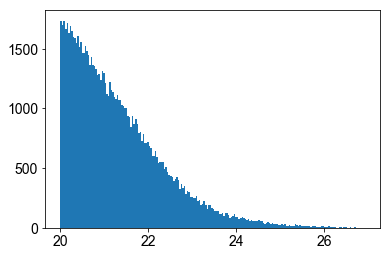

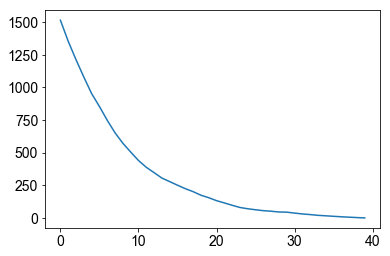

In [306]:
arr = x[200:350,:,200:350]/ce/thickness
flat = arr.flatten()
flat = np.delete(flat,np.where(flat<20))
out = plt.hist(flat,200)
plt.show()

#plt.plot(smooth[110:])

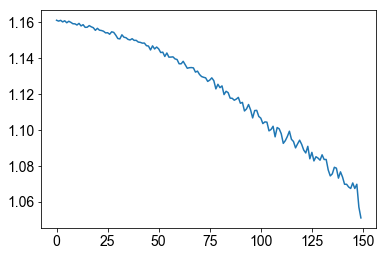

In [314]:
plt.plot(out[0][:150]**.02)

In [192]:
import scipy
peaks = scipy.signal.find_peaks(smooth)
peaks = peaks[0]
peaks[0]

2

In [557]:
x=np.load('Data/electro_n200-w01_unnorm.npy')

In [59]:
import hyperspy.api as hs

ModuleNotFoundError: No module named 'hyperspy'

In [92]:
np.save(r'C:\Users\Sauron\Documents\grl31\George Github\phd-work\multi-axis-tomo\alg paper\Data\electro_n200-w01-unnorm.tiff',x)

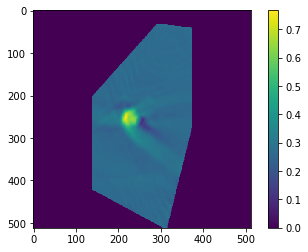

In [58]:
# Save to tiff using hyperspy
#x = np.load(r'C:\Users\Sauron\Documents\grl31\George Github\phd-work\multi-axis-tomo\alg paper\Data\electro_n200-w01.npy')
x = x.T
reconstruction = hs.signals.Signal2D(x)
reconstruction.change_dtype(np.float32)
reconstruction.save(r'C:\Users\Sauron\Documents\grl31\George Github\phd-work\multi-axis-tomo\alg paper\Data\electro_n200-w01-unnorm.tiff')

NameError: name 'hs' is not defined

# Experimental performance quantification
## FSC attempt

In [9]:
data_exp = [px,py,angles,mesh_params]

In [10]:
np.save('Data/CuCo_magphasedata.npy',data_exp)

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\numpy\core\_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [120]:
# Load full dataset
px,py,angles,mesh_params = np.load('Data/CuCo_magphasedata.npy',allow_pickle=True)

In [7]:
np.shape(px),np.shape(py),np.shape(angles)

((512, 46, 512), (512, 48, 512), (94, 3))

In [123]:
ang_x = angles[:46]
ang_y = angles[46:]
np.shape(ang_x),np.shape(ang_y)

((46, 3), (48, 3))

In [25]:
for i,a in enumerate(ang_x):
    if i%4 == 0:
        print(i)

0
4
8
12
16
20
24
28
32
36
40
44


In [43]:
a = copy.deepcopy(ang_x)
np.shape(np.delete(a,[1,5,10],axis=0))

(43, 3)

In [35]:
np.shape(a)

(46, 3)

In [121]:
#split data for FSC
def fsc_datasplit(px,py,ang_x,ang_y,mod=2):
    """ Returns inputs split into datasets a and b
    if mod == 2 then all the data is used and is split by odd/even
    if e.g. mod == 4, then data is split in 4, but still only two datasets get returned """
    # Deepcopy inputs into sets a and b
    px_splita = copy.deepcopy(px)
    py_splita = copy.deepcopy(py)
    ang_x_splita = copy.deepcopy(ang_x)
    ang_y_splita = copy.deepcopy(ang_y)
    
    px_splitb = copy.deepcopy(px)
    py_splitb = copy.deepcopy(py)
    ang_x_splitb = copy.deepcopy(ang_x)
    ang_y_splitb = copy.deepcopy(ang_y)
    
    # Split dataset into two
    isx_to_deletea = []
    isx_to_deleteb = []
    for i,a in enumerate(ang_x):
        if i%mod != 0:
            isx_to_deletea.append(i)
            
            if i != len(ang_x)-1:
                isx_to_deleteb.append(i+1)
                
    isy_to_deletea = []
    isy_to_deleteb = []
    for i,a in enumerate(ang_y):
        if i%mod != 0:
            isy_to_deletea.append(i)
            
            if i != len(ang_y)-1:
                isy_to_deleteb.append(i+1)
            
    px_splita = np.delete(px_splita,isx_to_deletea,axis=1)
    py_splita = np.delete(py_splita,isy_to_deletea,axis=1)
    ang_x_splita = np.delete(ang_x_splita,isx_to_deletea,axis=0)
    ang_y_splita = np.delete(ang_y_splita,isy_to_deletea,axis=0)

    px_splitb = np.delete(px_splitb,isx_to_deleteb,axis=1)
    py_splitb = np.delete(py_splitb,isy_to_deleteb,axis=1)
    ang_x_splitb = np.delete(ang_x_splitb,isx_to_deleteb,axis=0)
    ang_y_splitb = np.delete(ang_y_splitb,isy_to_deleteb,axis=0)
            
    return px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb
            
            

In [122]:
px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb = fsc_datasplit(px,py,ang_x,ang_y,mod=3)

NameError: name 'ang_x' is not defined

In [124]:
def fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
                 nmaj=3,nmin=5,weight=8e-4,th1=.6,th2=.8,n_pad=1, n_save='Data/FSC/data.npy'):
    
    # Reconstruct split a
    anglesa = np.concatenate([ang_x_splita,ang_y_splita])
    phisa = np.concatenate([px_splita,py_splita],axis=1)
    
    t1,t2,t3=ma.iterative_update_algorithm(phisa,anglesa,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)
    
    np.save('Data/FSC/'+n_save+'_ma_a.npy',[b1m,b2m,b3m])
    
    # Reconstruct split b
    anglesb = np.concatenate([ang_x_splitb,ang_y_splitb])
    phisb = np.concatenate([px_splitb,py_splitb],axis=1)
    
    t1,t2,t3=ma.iterative_update_algorithm(phisb,anglesb,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)
    
    np.save('Data/FSC/'+n_save+'_ma_b.npy',[b1m,b2m,b3m])
    

In [125]:
def fsc_recon_conv(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
                 nmin=15, n_save='Data/FSC/data.npy'):
    
    # Reconstruct split a
    bx_p,by_p = ma.dual_axis_B_generation(px_splita,py_splita,mesh_params)
    b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,ang_x_splita,ang_y_splita,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
    b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
    
    np.save('Data/FSC/'+n_save+'_conv_a.npy',[b1d,b2d,b3d])
    
    # Reconstruct split b
    bx_p,by_p = ma.dual_axis_B_generation(px_splitb,py_splitb,mesh_params)
    b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,ang_x_splitb,ang_y_splitb,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
    b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
    
    np.save('Data/FSC/'+n_save+'_conv_b.npy',[b1d,b2d,b3d])
    

In [83]:
# full recon ma
nmaj=3
nmin=5
weight=8e-4
th1,th2=.6,.8
n_pad=1

t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight,callback=True)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

np.save('Data/FSC/fullrecon_ma.npy',[b1m,b2m,b3m])


Initialised
 Iter   Time      primal          gap        violation       step     
   0%    10s     3.640e-02     9.992e-01          0        0.000e+00  
  20%    54s     2.807e-02     7.987e-01          0        1.000e+00  
  40%    1m37    2.443e-02     7.052e-01          0        4.007e-01  
  60%    2m19    2.224e-02     6.447e-01          0        2.421e-01  
  80%    3m 2    2.067e-02     5.989e-01          0        1.747e-01  
 100%    3m46    1.945e-02     5.617e-01          0        1.383e-01  

 Iter   Time      primal          gap        violation       step     
   0%    10s     2.115e-02     9.992e-01          0        0.000e+00  
  20%    54s     1.231e-02     8.191e-01          0        1.000e+00  
  40%    1m37    9.222e-03     6.754e-01          0        3.743e-01  
  60%    2m19    7.700e-03     5.604e-01          0        2.133e-01  
  80%    3m 2    6.795e-03     4.677e-01          0        1.455e-01  
 100%    3m44    6.185e-03     3.928e-01          0        1.103

In [84]:
# full recon conv
nmin = 5
px = px
py = py
angx= as_x
angy= as_y
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

np.save('Data/FSC/fullrecon_conv.npy',[b1d,b2d,b3d])

In [ ]:
b3d=b3d/5

In [ ]:
d1,d2,d3 = np.load('Data/CuCo_conv-n15-scaled.npy')
m1,m2,m3 = np.load('Data/CuCo_wrap-n5-w2e3.npy')

In [86]:
mod=4
px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb = fsc_datasplit(px,py,ang_x,ang_y,mod=mod)
# fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
#              n_save='mod4')
fsc_recon_conv(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
               n_save='mod4')

In [87]:
mod=3
px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb = fsc_datasplit(px,py,ang_x,ang_y,mod=mod)
# fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
#              n_save='mod3')
fsc_recon_conv(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
               n_save='mod3')

In [88]:
mod=2
px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb = fsc_datasplit(px,py,ang_x,ang_y,mod=mod)
# fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
#              n_save='mod2')
fsc_recon_conv(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
               n_save='mod2')

In [133]:
mod=2
px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb = fsc_datasplit(px,py,ang_x,ang_y,mod=mod)
fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
             n_save='mod2_lowreg2',weight=8e-7)
# fsc_recon_conv(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params,
#                n_save='mod2')

Initialised
 Iter   Time      primal          gap        violation       step     
   0%     8s     6.502e-02     1.000e+00          0        0.000e+00  
  20%    42s     4.598e-02     7.520e-01          0        1.000e+00  
  40%    1m17    3.833e-02     6.419e-01          0        3.897e-01  
  60%    1m52    3.386e-02     5.743e-01          0        2.345e-01  
  80%    2m26    3.080e-02     5.250e-01          0        1.674e-01  
 100%    3m 1    2.852e-02     4.861e-01          0        1.303e-01  

 Iter   Time      primal          gap        violation       step     
   0%     8s     5.368e-02     1.000e+00          0        0.000e+00  
  20%    44s     2.860e-02     7.629e-01          0        1.000e+00  
  40%    1m19    2.034e-02     5.837e-01          0        3.666e-01  
  60%    1m55    1.636e-02     4.644e-01          0        2.073e-01  
  80%    2m29    1.403e-02     4.309e-01          0        1.404e-01  
 100%    3m 4    1.249e-02     3.983e-01          0        1.057

Now to analyse

In [30]:
import scipy.ndimage as ndimage
def calc_fsc(rho1, rho2, side):
    """ Calculate the Fourier Shell Correlation between two electron density maps."""
    # Calculate fourier spacing grid
    df = 1.0/side
    n = rho1.shape[0]
    qx_ = np.fft.fftfreq(n)*n*df
    qx, qy, qz = np.meshgrid(qx_,qx_,qx_,indexing='ij')
    qx_max = qx.max()
    qr = np.sqrt(qx**2+qy**2+qz**2)
    qmax = np.max(qr)
    qstep = np.min(qr[qr>0])
    nbins = int(qmax/qstep)
    qbins = np.linspace(0,nbins*qstep,nbins+1)
    
    #create an array labeling each voxel according to which qbin it belongs
    qbin_labels = np.searchsorted(qbins, qr, "right")
    qbin_labels -= 1
    
    # Take fourier transform of data
    F1 = np.fft.fftn(rho1)
    F2 = np.fft.fftn(rho2)
    
    # Calculate FSC
    numerator = ndimage.sum(np.real(F1*np.conj(F2)), labels=qbin_labels,
        index=np.arange(0,qbin_labels.max()+1))
    term1 = ndimage.sum(np.abs(F1)**2, labels=qbin_labels,
        index=np.arange(0,qbin_labels.max()+1))
    term2 = ndimage.sum(np.abs(F2)**2, labels=qbin_labels,
        index=np.arange(0,qbin_labels.max()+1))
    denominator = (term1*term2)**0.5
    FSC = numerator/denominator
    qidx = np.where(qbins<qx_max)
    return  np.vstack((qbins[qidx],FSC[qidx])).T

In [31]:
# rho1 = np.load(r'Data/FSC/mod2_conv_a.npy')
# rho2 = np.load(r'Data/FSC/mod2_conv_b.npy')

rho1 = np.load(r'Data/FSC/mod2_ma_a.npy')
rho2 = np.load(r'Data/FSC/mod4_ma_b.npy')

In [27]:
np.shape(rho2[0])

(512, 512, 512)

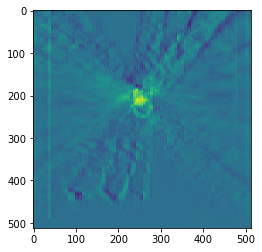

In [35]:

plt.imshow(rho2[0][:,252,:])

In [39]:
F1 = np.fft.fftn(rho1[0])


C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log10
  """Entry point for launching an IPython kernel.


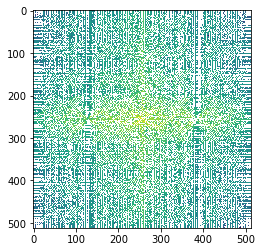

In [42]:
plt.imshow(np.fft.fftshift(np.log10(F1[0].real)))

In [32]:
res = calc_fsc(rho1[0],rho2[0],100e-9)

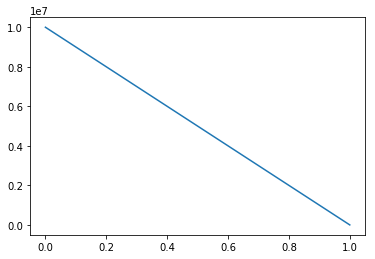

In [33]:
plt.plot(res[0],res[1])

https://github.com/MaximilianBeckers/SPOC

In [152]:
#fsc_tv = FSC(r_tv_a,r_tv_b, None, 100e-9, .5, 3, 0, verbose, None, 0)

def FSC(halfMap1, halfMap2, maskData, apix, cutoff, numAsymUnits, localRes, verbose, permutedCorCoeffs, SMLM):

	#********************************************
	#***** function that calculates the FSC *****
	#********************************************

	if localRes:
		maskCoeff = 0.23;
	elif SMLM:
		maskCoeff = 0.6;
	else:
		maskCoeff = 0.7;

	if maskData is not None:
		halfMap1 = halfMap1*maskData;
		halfMap2 = halfMap2*maskData;

	#calculate frequency map - presumabl the fourier space coordinates
	freqMap = calculate_frequency_map(halfMap1);
	freqMap = freqMap/float(apix);

	#do fourier transforms
	try:
		import pyfftw
		import multiprocessing

		fftObject_half1 = pyfftw.builders.rfftn(halfMap1);
		fftObject_half2 = pyfftw.builders.rfftn(halfMap2);
		fft_half1 = fftObject_half1(halfMap1);
		fft_half2 = fftObject_half2(halfMap2);
	except:
		fft_half1 = np.fft.rfftn(halfMap1);
		fft_half2 = np.fft.rfftn(halfMap2);
    
    # Define initial values
	sizeMap = halfMap1.shape;
    
	res = np.fft.rfftfreq(sizeMap[0], 1.0);
	res = res/float(apix);
	numRes = res.shape[0];
    
	resSpacing = (res[1] - res[0])/2.0;
	FSC = np.ones((res.shape[0]));
	pVals = np.zeros((res.shape[0]));
	percentCutoffs = np.zeros((res.shape[0], 4));
	threeSigma = np.zeros((res.shape[0]));
	threeSigmaCorr = np.zeros((res.shape[0]));
	tmpPermutedCorCoeffs = [];

	numCalculations = res.shape[0];

	if verbose:
		print("Run permutation test of each resolution shell ...");
    
    # Loop over all resolution values
	for i in range(res.shape[0]):
		tmpRes = res[i];
        # Extract shell layer
		resShell_half1 = fft_half1[((tmpRes - resSpacing) < freqMap) & (freqMap < (tmpRes + resSpacing))];
		resShell_half2 = fft_half2[((tmpRes - resSpacing) < freqMap) & (freqMap < (tmpRes + resSpacing))];
        
        # Calculate correlation between each shell, this follows the standard FSC equation
		FSC[i] = correlationCoefficient(resShell_half1, resShell_half2);

		# if (permutedCorCoeffs is not None): #for local resolution estimation
		# 	tmpCorCoeffs = permutedCorCoeffs[i];
		# 	pVals[i] = (tmpCorCoeffs[tmpCorCoeffs > FSC[i]].shape[0])/(float(tmpCorCoeffs.shape[0]));
		# 	tmpPermutedCorCoeffs = None;
		# else:
		# 	pVals[i], percentCutoffs[i,:], threeSigma[i], threeSigmaCorr[i], corCoeffs = permutationTest(resShell_half1, resShell_half2, numAsymUnits, maskCoeff);
		# 	tmpPermutedCorCoeffs.append(corCoeffs);

		if verbose:
			#print output
			progress = i/float(numCalculations);
			if i%(int(numCalculations/20.0)) == 0:
				output = "%.1f" %(progress*100) + "% finished ..." ;
				print(output);
		
	return FSC#, percentCutoffs, pVals, tmpPermutedCorCoeffs
# 	pVals[0] = 0.0;

# 	#for the first two resolutions shells, use a 0.75 FSC criterion for local resolutions, as permutation not reliabele for such small sample sizes
# 	if localRes or SMLM:
# 		if FSC[0] < 0.75:
# 			pVals[0] = 1.0;
# 		else:
# 			pVals[0] = 0.0;
		
# 		if FSC[1] < 0.75:
# 			pVals[1] = 1.0;
# 		else:
# 			pVals[1] = 0.0;

# # 	# do FDR control of p-Values
# # 	qVals_FDR = FDRutil.pAdjust(pVals, 'BY');

# # 	tmpFSC = np.copy(FSC);
# # 	tmpFSC[tmpFSC > cutoff] = 1.0;
# # 	tmpFSC[tmpFSC <= cutoff] = 0.0;
# # 	tmpFSC = 1.0 - tmpFSC;
# # 	tmpFSC[0] = 0.0;	
# # 	tmpFSC[1] = 0.0;

# 	try:
# 		resolution = np.min(np.argwhere(tmpFSC))-1;

# 		if resolution < 0:
# 			resolution = 0.0;
# 		else:
# 			if res[int(resolution)] == 0.0:
# 				resolution = 0.0;
# 			else:
# 				tmpFreq = res[int(resolution)] #+ (res[resolution+1] - res[resolution])/2.0;
# 				resolution = float(1.0/tmpFreq);
# 	except:
# 		resolution = 2.0*apix;

# 	# threshQVals = np.copy(qVals_FDR);
# 	# threshQVals[threshQVals <= 0.01] = 0.0; #signal
# 	# threshQVals[threshQVals > 0.01] = 1.0 #no signal

# # 	try:
# # 		resolution_FDR = np.min(np.argwhere(threshQVals)) - 1;

# # 		if resolution_FDR < 0:
# # 			resolution_FDR = 0.0;
# # 		else:
# # 			if res[int(resolution_FDR)] == 0.0:
# # 				resolution_FDR = 0.0;
# # 			else:
# # 				tmpFreq = res[int(resolution_FDR)] #+ (res[resolution_FDR + 1] - res[resolution_FDR]) / 2.0;
# # 				resolution_FDR = float(1.0/tmpFreq);
# # 	except:
# # 		resolution_FDR = 2.0*apix;

# # 	if verbose:
# # 		print('Resolution at a unmasked ' + repr(cutoff) + ' FSC threshold: ' + repr(round(resolution, 2)));
# # 		print('Resolution at 1 % FDR-FSC: ' + repr(round(resolution_FDR, 2)) + ' Angstrom');
# # 		#print('Resolution at 0.01 % FDR: ' + repr(round(resolution_FDR01, 2)) + ' Angstrom');
# # 		#print('Resolution at 1 % FWER: ' + repr(round(resolution_FWER, 2)) + ' Angstrom');

	# return res, FSC, percentCutoffs, pVals, qVals_FDR, resolution_FDR, tmpPermutedCorCoeffs;

def calculate_frequency_map(map):

	#*********************************************************
	#*** calculation of the frequency map of the given map ***
	#*********************************************************

	sizeMap = map.shape;

	if map.ndim == 3:
		# calc frequency for each voxel
		freqi = np.fft.fftfreq(sizeMap[0], 1.0);
		freqj = np.fft.fftfreq(sizeMap[1], 1.0);
		freqk = np.fft.rfftfreq(sizeMap[2], 1.0);

		sizeFFT = np.array([freqi.size, freqj.size, freqk.size]);
		FFT = np.zeros(sizeFFT);

		freqMapi = np.copy(FFT);
		for j in range(sizeFFT[1]):
			for k in range(sizeFFT[2]):
				freqMapi[:, j, k] = freqi * freqi;

		freqMapj = np.copy(FFT);
		for i in range(sizeFFT[0]):
			for k in range(sizeFFT[2]):
				freqMapj[i, :, k] = freqj * freqj;

		freqMapk = np.copy(FFT);
		for i in range(sizeFFT[0]):
			for j in range(sizeFFT[1]):
				freqMapk[i, j, :] = freqk * freqk;

		frequencyMap = np.sqrt(freqMapi + freqMapj + freqMapk);

	elif map.ndim == 2:
		# calc frequency for each voxel
		freqi = np.fft.fftfreq(sizeMap[0], 1.0);
		freqj = np.fft.rfftfreq(sizeMap[1], 1.0);

		sizeFFT = np.array([freqi.size, freqj.size]);
		FFT = np.zeros(sizeFFT);

		freqMapi = np.copy(FFT);
		for j in range(sizeFFT[1]):
			freqMapi[:, j] = freqi * freqi;

		freqMapj = np.copy(FFT);
		for i in range(sizeFFT[0]):
			freqMapj[i, :] = freqj * freqj;

		frequencyMap = np.sqrt(freqMapi + freqMapj);

	return frequencyMap;

def correlationCoefficient(sample1, sample2):

	#*******************************
	#*** calc. correlation coeff ***
	#*******************************

	FSCnominator = np.sum((sample1 * np.conj(sample2)) + (np.conj(sample1) * sample2));
	FSCdenominator = np.sqrt(np.sum(2.0*np.square(np.absolute(sample1))) * 2.0*np.sum(np.square(np.absolute(sample2))));

	if FSCdenominator != 0:
		FSC = np.real(FSCnominator) / np.real(FSCdenominator);
	else:
		FSC = 0.0;

	return FSC;

def permutationTest(sample1, sample2, numAsymUnits, maskCoeff):

	#***************************************************
	#**** permutation-test of the two given samples ****
	#***************************************************

	#now get effective sample sizes
	numSamples = sample2.shape[0];
	maxSamples = np.min(((maskCoeff)*numSamples/float(numAsymUnits), 200000));
	maxSamples = np.max((maxSamples, 1.0));
	maxSamples = int(maxSamples);
	numSamplesThreeSigma = np.min((np.max((numSamples/float(numAsymUnits), 1.0)), 200000));
	numSamplesThreeSigma = int(numSamplesThreeSigma);

	#effective sample size van Heel (2005)
	numSamplesThreeSigmaCorr = np.min((np.max((numSamples/float(numAsymUnits)*((3.0/2.0)*maskCoeff)**2, 1.0)), 200000));
	#numSamplesThreeSigmaCorr = np.min((np.max((numSamples/float(numAsymUnits)*maskCoeff, 1.0)), 200000));
	numSamplesThreeSigmaCorr = int(numSamplesThreeSigmaCorr);

	#get real FSC value
	trueFSC = correlationCoefficient(sample1, sample2);

	numPermutations = np.min((math.factorial(numSamples), 1000));
	corrCoeff = np.zeros(numPermutations);

	#set random seed
	np.random.seed(3);

	if numSamples > maxSamples:  # do subsampling
		randomIndices = np.random.choice(range(numSamples), maxSamples, replace=False);
		tmpSample1 = np.copy(sample1[randomIndices]);
		tmpSample2 = np.copy(sample2[randomIndices]);
		numSamples = maxSamples;
	else:
		tmpSample1 = np.copy(sample1);
		tmpSample2 = np.copy(sample2);

	tmpFSCdenominator = np.sqrt(np.sum(2.0 * np.square(np.absolute(tmpSample1))) * 2.0 * np.sum(np.square(np.absolute(tmpSample2))));
	tmpSample1ComplexConj = np.conj(tmpSample1);
	tmpSample1 = 0; #free memory

	#do the actual permutations
	permutedCorCoeffs, numPermutations = doPermutations(tmpSample2, tmpSample1ComplexConj, numPermutations, tmpFSCdenominator, trueFSC);

	permutedCorCoeffs = np.real(permutedCorCoeffs)/np.real(tmpFSCdenominator);

	#calculate the pValue
	extremeCorCoeff = permutedCorCoeffs[permutedCorCoeffs>trueFSC];
	numExtreme = extremeCorCoeff.shape[0];
	pValue = numExtreme/float(numPermutations);

	#plot 3Sigma curve
	threeSigma = 3.0/(math.sqrt(numSamplesThreeSigma)+3.0-1.0);
	threeSigmaCorr = 3.0/(math.sqrt(numSamplesThreeSigmaCorr)+3.0-1.0);

	#calculate one percent cutoffs, i.e. cutoffs for each voxel before multiple testing correction
	permutedCorCoeffs = np.sort(permutedCorCoeffs);
	_onePercentCutoff = permutedCorCoeffs[int(numPermutations - math.floor(numPermutations * 0.0015)) - 1];
	onePercentCutoff = permutedCorCoeffs[int(numPermutations - math.floor(numPermutations * 0.01)) - 1];
	fivePercentCutoff = permutedCorCoeffs[int(numPermutations - math.floor(numPermutations * 0.05)) - 1];
	tenPercentCutoff = permutedCorCoeffs[int(numPermutations - math.floor(numPermutations * 0.10)) - 1];
	percentCutoffs = np.array((tenPercentCutoff, fivePercentCutoff, onePercentCutoff, _onePercentCutoff));
	percentCutoffs[percentCutoffs<=0] = 1.0;

	#if sample size of FSC values is low, use a 0.75 FSC threshold
	if maxSamples < 10:
		if trueFSC < 0.75:
			pValue = 1.0;
		else:
			pValue = 0.0;

		percentCutoffs = np.ones(percentCutoffs.shape);

	return pValue, percentCutoffs, threeSigma, threeSigmaCorr, permutedCorCoeffs;

#--------------------------------------------------------
def doPermutations(tmpSample2, tmpSample1ComplexConj, numPermutations, tmpFSCdenominator, trueFSC):


	prevPValue = 0.0;
	permutedCorCoeffs = np.zeros(0);
	itNumPermutations = 200;  #check p-value every 200 permutations

	if numPermutations<1000: #for the first resolutions shells no p-value convergence test

		tmpPermutedCorCoeffs = generatePermutations(numPermutations, tmpSample1ComplexConj, tmpSample2);
		permutedCorCoeffs = np.append(permutedCorCoeffs, tmpPermutedCorCoeffs);

	else: #check convergence of p-values every 200 permutations

		numChecks = int(numPermutations/float(itNumPermutations));

		for i in range(numChecks):

			tmpPermutedCorCoeffs = generatePermutations(itNumPermutations, tmpSample1ComplexConj, tmpSample2);
			permutedCorCoeffs = np.append(permutedCorCoeffs, tmpPermutedCorCoeffs);

			#calculate temporary p-value
			tmpPermutedCorCoeffs = np.real(permutedCorCoeffs) / np.real(tmpFSCdenominator);

			#calculate the pValue
			extremeCorCoeff = tmpPermutedCorCoeffs[tmpPermutedCorCoeffs>trueFSC];
			numExtreme = extremeCorCoeff.shape[0];
			newPValue = numExtreme / float(tmpPermutedCorCoeffs.size);

			# if p-value accuracy is high enough, stop permutations
			if (newPValue - prevPValue) < 0.001:
				numPermutations = (i + 1)*itNumPermutations;
				break;

			prevPValue = newPValue;

	return permutedCorCoeffs, numPermutations;

#-------------------------------------------------------
def generatePermutations(numPermutations, tmpSample1ComplexConj, tmpSample2):

	permutedCorCoeffs = np.zeros(numPermutations);
	for i in range(numPermutations):

		permutedSample2 = np.random.permutation(tmpSample2);

		summand = tmpSample1ComplexConj * permutedSample2;
		tmpCorCoeff = np.sum(np.conj(summand) + summand);

		permutedCorCoeffs[i] = np.real(tmpCorCoeff);

	return permutedCorCoeffs;

#--------------------------------------------------------
def writeFSC(resolutions, FSC, qValuesFDR, pValues, resolution):

	#*******************************
	#******* write FSC plots *******
	#*******************************

	plt.plot(resolutions, FSC, label="FSC", linewidth=1.5);

	#threshold the adjusted pValues
	qValuesFDR[qValuesFDR<=0.01] = 0.0;
	pValues[pValues<=0.01] = 0.0;

	plt.plot(resolutions[0:][qValuesFDR==0.0], qValuesFDR[qValuesFDR==0.0]-0.05, 'xr', label="sign. at 1% FDR");
	#plt.plot(resolutions[0:][pValues==0.0], pValues[pValues==0.0]-0.1, 'xb', label="sign. at 1%");

	plt.axhline(0.5, linewidth = 0.5, color = 'r');
	plt.axhline(0.143, linewidth = 0.5, color = 'r');
	plt.axhline(0.0, linewidth = 0.5, color = 'b');
	plt.axvline(1.0/resolution, linewidth = 0.5, color = 'b');

	#add text with resolution
	plt.text(0, 1.1, "Resolution at 1% FDR-FSC: {:.2f} Angstroem".format(resolution), fontsize=12);

	plt.xlabel("1/resolution [1/A]");
	plt.ylabel("FSC");
	plt.legend();

	plt.savefig('FSC.pdf', dpi=400);
	plt.close();

	#save txt file
	np.savetxt("FSC.txt", (resolutions, FSC));

#-------------------------------------------------------
def roundMapToVectorElements(map, apix): 
	
	sizeMap = map.shape;
	res = np.fft.rfftfreq(sizeMap[0], 1.0);
	res = res/float(apix);

	numRes = res.size;
	resSpacing = (res[1] - res[0])/2.0;
	
	for i in range(numRes):
	
		#get lower and upper bounds
		upper = 1.0/(res[i] - resSpacing);
		lower = 1.0/(res[i] + resSpacing);

		if i==0 :
			map[map>lower] = 100;
		
		elif i==(numRes-1):
			map[map<=upper] = 1.0/(res[i]);
		
		else: 
			map[(map>lower) & (map<=upper)] = 1.0/(res[i]);
		
	return map

#-------------------------------------------------------
def getNumAsymUnits(symmetry):

	#get symmetry group
	symGroup = symmetry[0];

	if symGroup == 'C':

		# get symmetry order
		symOrder = symmetry[1:];
		numAsymUnits = int(symOrder);

	elif symGroup == 'D':

		# get symmetry order
		symOrder = symmetry[1:];
		numAsymUnits = int(symOrder)*2;

	elif symGroup == 'O':

		numAsymUnits = 24;

	elif symGroup == 'I':

		numAsymUnits = 60;

	else:

		print("Symmetry not known. Exit ...");
		sys.exit();

	return numAsymUnits;


from scipy.interpolate import RegularGridInterpolator
import math

In [330]:
full_m = np.load(r'Data/FSC/fullrecon_ma.npy')
full_c = np.load(r'Data/FSC/fullrecon_conv.npy')

d2_m_a = np.load(r'Data/FSC/mod2_ma_a.npy')
d2_m_b = np.load(r'Data/FSC/mod2_ma_b.npy')

d2_c_a = np.load(r'Data/FSC/mod2_conv_a.npy')
d2_c_b = np.load(r'Data/FSC/mod2_conv_b.npy')

d3_m_a = np.load(r'Data/FSC/mod3_ma_a.npy')
d3_m_b = np.load(r'Data/FSC/mod3_ma_b.npy')

d3_c_a = np.load(r'Data/FSC/mod3_conv_a.npy')
d3_c_b = np.load(r'Data/FSC/mod3_conv_b.npy')

d4_m_a = np.load(r'Data/FSC/mod4_ma_a.npy')
d4_m_b = np.load(r'Data/FSC/mod4_ma_b.npy')

d4_c_a = np.load(r'Data/FSC/mod4_conv_a.npy')
d4_c_b = np.load(r'Data/FSC/mod4_conv_b.npy')

ValueError: cannot reshape array of size 134105945 into shape (3,512,512,512)

In [185]:
m_2x = ma.COD(full_m[0],d2_m_a[0])
m_2y = ma.COD(full_m[1],d2_m_a[1])
m_2z = ma.COD(full_m[2],d2_m_a[2])
m_2avg = np.mean([m_2x,m_2y,m_2z])

c_2x = ma.COD(full_c[0],d2_c_a[0])
c_2y = ma.COD(full_c[1],d2_c_a[1])
c_2z = ma.COD(full_c[2],d2_c_a[2])
c_2avg = np.mean([c_2x,c_2y,c_2z])

m_3x = ma.COD(full_m[0],d3_m_a[0])
m_3y = ma.COD(full_m[1],d3_m_a[1])
m_3z = ma.COD(full_m[2],d3_m_a[2])
m_3avg = np.mean([m_3x,m_3y,m_3z])

c_3x = ma.COD(full_c[0],d3_c_a[0])
c_3y = ma.COD(full_c[1],d3_c_a[1])
c_3z = ma.COD(full_c[2],d3_c_a[2])
c_3avg = np.mean([c_3x,c_3y,c_3z])

m_4x = ma.COD(full_m[0],d4_m_a[0])
m_4y = ma.COD(full_m[1],d4_m_a[1])
m_4z = ma.COD(full_m[2],d4_m_a[2])
m_4avg = np.mean([m_4x,m_4y,m_4z])

c_4x = ma.COD(full_c[0],d4_c_a[0])
c_4y = ma.COD(full_c[1],d4_c_a[1])
c_4z = ma.COD(full_c[2],d4_c_a[2])
c_4avg = np.mean([c_4x,c_4y,c_4z])

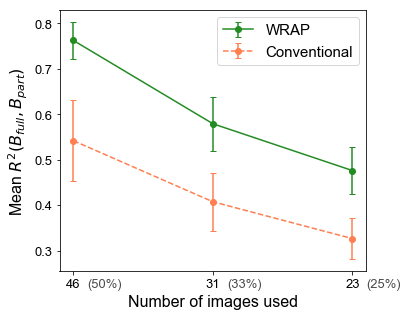

In [209]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)
plt.figure(figsize=[5.5,4.8])
cods_m = [m_2avg,m_3avg,m_4avg]
cods_c = [c_2avg,c_3avg,c_4avg]
es_m = np.array([np.std([m_2x,m_2y,m_2z]),np.std([m_3x,m_3y,m_3z]),np.std([m_4x,m_4y,m_4z])])
es_c = np.array([np.std([c_2x,c_2y,c_2z]),np.std([c_3x,c_3y,c_3z]),np.std([c_4x,c_4y,c_4z])])

plt.errorbar([1,2,3],cods_m,yerr=es_m,fmt='o-',capsize=3,label='WRAP',color='forestgreen')
plt.errorbar([1,2,3,],cods_c,yerr=es_c,fmt='o--',capsize=3,label='Conventional',color='coral')

# plt.fill_between([1,2,3],cods_m-es_m,cods_m+es_m)
# plt.fill_between([1,2,3,],cods_c-es_c,cods_c+es_c)
plt.xticks([1,2,3],['46', '31', '23'])
plt.text(1.1,0.22,'(50%)',color='k',alpha=.7)
plt.text(2.1,0.22,'(33%)',color='k',alpha=.7)
plt.text(3.1,0.22,'(25%)',color='k',alpha=.7)
plt.xlabel('Number of images used',fontsize=16)
plt.ylabel('Mean $R^2(B_{full},B_{part})$',fontsize=16)
plt.legend(fontsize=15)

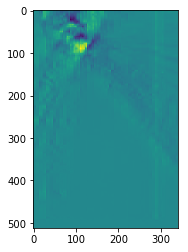

In [173]:
plt.imshow(d2_m_a[0][:,:,100:440])

In [9]:
fsc_2m0 = FSC(d2_m_a[0][:,:,100:440], d2_m_b[0][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_2c0 = FSC(d2_c_a[0][:,:,100:440], d2_c_b[0][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)

fsc_2m1 = FSC(d2_m_a[1][:,:,100:440], d2_m_b[1][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_2c1 = FSC(d2_c_a[1][:,:,100:440], d2_c_b[1][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)

fsc_2m2 = FSC(d2_m_a[2][:,:,100:440], d2_m_b[2][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_2c2 = FSC(d2_c_a[2][:,:,100:440], d2_c_b[2][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...


KeyboardInterrupt: 

In [232]:
fsc_results = [fsc_2m0,fsc_2c0,fsc_2m1,fsc_2c1,fsc_2m2,fsc_2c2]
np.save(r'Data/FSC/initial_FSC.npy',fsc_results)

In [315]:
fsc_results = np.load(r'Data/initial_FSC.npy')
fsc_2m0,fsc_2c0,fsc_2m1,fsc_2c1,fsc_2m2,fsc_2c2 = fsc_results

(-0.2, 1.1)

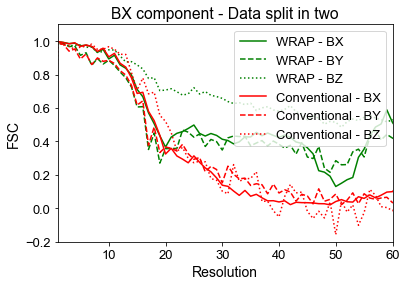

In [316]:
plt.plot(fsc_2m0, 'g-', label='WRAP - BX')
plt.plot(fsc_2m1, 'g--', label='WRAP - BY')
plt.plot(fsc_2m2, 'g:', label='WRAP - BZ')
plt.plot(fsc_2c0, 'r-', label = 'Conventional - BX')
plt.plot(fsc_2c1, 'r--', label = 'Conventional - BY')
plt.plot(fsc_2c2, 'r:', label = 'Conventional - BZ')
#plt.plot(fsc_2m0, 'g-', label='WRAP - 2')

plt.legend()
plt.ylabel('FSC', fontsize=14)
plt.xlabel('Resolution', fontsize=14)
plt.title('BX component - Data split in two')
plt.xlim([1,60])
plt.ylim([-.2,1.1])

In [221]:
len(fsc_2m0)*2

514

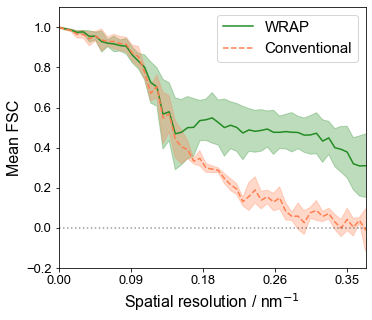

In [328]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)

r = 1.34


plt.figure(figsize=[5.5,4.8])

fsc_m_avg = np.mean([fsc_2m0,fsc_2m1,fsc_2m2],axis=0)
fsc_c_avg = np.mean([fsc_2c0,fsc_2c1,fsc_2c2],axis=0)

es_m = np.std([fsc_2m0,fsc_2m1,fsc_2m2],axis=0)
es_c = np.std([fsc_2c0,fsc_2c1,fsc_2c2],axis=0)

xs = np.arange(len(fsc_2m0))
fsc_c_avg[0]=1
es_c[0]=es_c[1]
plt.plot(fsc_m_avg, 'g-', label='WRAP', color='forestgreen')
plt.plot(fsc_c_avg, 'r--', label = 'Conventional', color='coral')
plt.fill_between(xs,fsc_m_avg-es_m,fsc_m_avg+es_m, color='forestgreen',alpha=.3)
plt.fill_between(xs,fsc_c_avg-es_c,fsc_c_avg+es_c, color='coral',alpha=.3)
#plt.plot(fsc_2m0, 'g-', label='WRAP - 2')

plt.legend(fontsize=15)
plt.ylabel('Mean FSC', fontsize=16)
plt.xlabel('Spatial resolution / nm$^{-1}$', fontsize=16)
plt.xlim([1,50])
plt.ylim([-.2,1.1])
plt.plot([0,60],[0,0],'k:',alpha=0.4)

# from matplotlib.ticker import FormatStrFormatter
# ax=plt.gca()
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

ix = np.linspace(0,47,5)
rx = ix*1/r/100
srx = ['%.2f'%x for x in rx]
plt.xticks(ticks=ix,labels=srx)
plt.show()


FSC on magnitude only

In [17]:
a = [1,2,3]
np.hypot(a,a)

array([1.41421356, 2.82842712, 4.24264069])

In [329]:
mag_wrap_a = (d2_m_a[0][:,:,100:440]**2 + d2_m_a[1][:,:,100:440]**2 + d2_m_a[2][:,:,100:440]**2)**0.5
mag_wrap_b = (d2_m_b[0][:,:,100:440]**2 + d2_m_b[1][:,:,100:440]**2 + d2_m_b[2][:,:,100:440]**2)**0.5

mag_conv_a = (d2_c_a[0][:,:,100:440]**2 + d2_c_a[1][:,:,100:440]**2 + d2_c_a[2][:,:,100:440]**2)**0.5
mag_conv_b = (d2_c_b[0][:,:,100:440]**2 + d2_c_b[1][:,:,100:440]**2 + d2_c_b[2][:,:,100:440]**2)**0.5

fsc_mag_w = FSC(mag_wrap_a,mag_wrap_b, None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_mag_c = FSC(mag_conv_a,mag_conv_b, None, 100e-9, .5, 3, 0, 1, None, 0)

NameError: name 'd2_m_a' is not defined

(-0.2, 1.1)

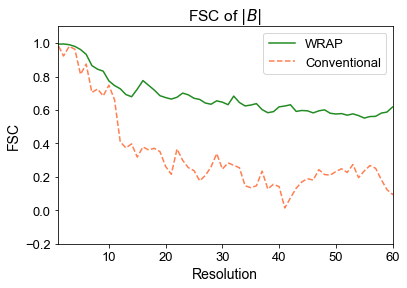

In [228]:
plt.plot(fsc_mag_w,color='forestgreen', label='WRAP')
plt.plot((fsc_mag_c),'--', color='coral', label='Conventional')

plt.legend()
plt.ylabel('FSC', fontsize=14)
plt.xlabel('Resolution', fontsize=14)
plt.title('FSC of $|B|$')
plt.xlim([1,60])
plt.ylim([-.2,1.1])

FSC of scalar recon

Text(0.5, 0, 'Fourier shell radius / px')

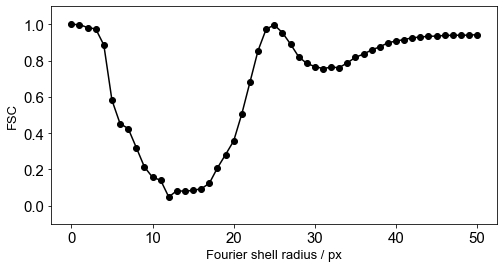

In [290]:
n=50
P = np.zeros((n,n,n))
for i in range(int(n/2)):
    P[2*i,:,:] = 1
    
angles = ma.generate_angles(mode='x',alpha=90,n_tilt=101)
raw_data = ma.generate_proj_data(P,angles)
vectors = ma.generate_vectors(angles)

d_a = ma.noisy(raw_data,noise_typ='poisson',val_pois=100)
d_b = ma.noisy(raw_data,noise_typ='poisson',val_pois=100)

r_tv_a = ma.generate_reconstruction(d_a,vectors,algorithm='SIRT3D_CUDA',niter=20,callback_freq=20,weight=0.00001)
r_tv_b = ma.generate_reconstruction(d_b,vectors,algorithm='SIRT3D_CUDA',niter=21,callback_freq=20,weight=0.00001)

zoomin = True
if zoomin == True:
    from scipy.ndimage import zoom
    f=2
    r_tv_a = zoom(r_tv_a,(f,f,f))
    r_tv_b = zoom(r_tv_b,(f,f,f))

fsc = FSC(r_tv_a,r_tv_b, None, 100e-9, .5, 3, 0, False, None, 0)

plt.figure(figsize=(8,4))
plt.ylim([-.1,1.1])

xs = np.arange(len(fsc))#/len(fsc)
plt.plot(xs,fsc,'ko-')
plt.ylabel('FSC',fontsize=13)
plt.xlabel('Fourier shell radius / px',fontsize=13)

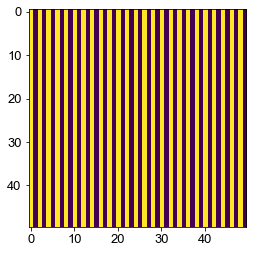

In [240]:
plt.imshow(P[:,:,25])

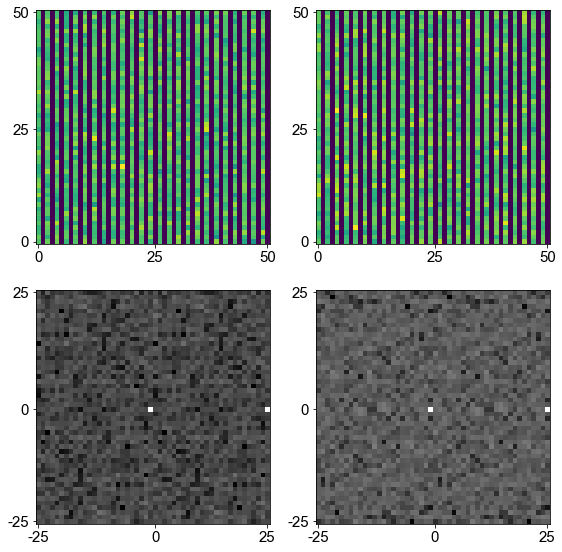

In [289]:
import matplotlib
# Set font and colormap for plotting
font = {'family':'sans-serif','sans-serif':['Arial'],
        'size'   : 15}
matplotlib.rc('font', **font)

f,axs=plt.subplots(ncols=2,nrows=2,figsize=(8,8))

axs[0,0].imshow(d_a[:,50,:])
axs[0,1].imshow(d_b[:,50,:])

for ax in (axs[0,0],axs[0,1]):
    ax.set_xticks([0,25,49])
    ax.set_xticklabels([0,25,50])
    ax.set_yticks([0,25,49])
    ax.set_yticklabels([50,25,0])

fft = np.fft.fft2(d_a[:,50,:])
fft = np.fft.fftshift(fft)
axs[1,0].imshow(np.fliplr(np.log10((abs(fft)))),cmap='gray')
axs[1,0].set_xticks([0,25,49])
axs[1,0].set_xticklabels([-25,0,25])
axs[1,0].set_yticks([0,25,49])
axs[1,0].set_yticklabels([25,0,-25])

fft = np.fft.fft2(d_b[:,50,:])
fft = np.fft.fftshift(fft)
axs[1,1].imshow(np.fliplr(np.log10((abs(fft)))),cmap='gray')
axs[1,1].set_xticks([0,25,49])
axs[1,1].set_xticklabels([-25,0,25])
axs[1,1].set_yticks([0,25,49])
axs[1,1].set_yticklabels([25,0,-25])

plt.tight_layout()

([<matplotlib.axis.YTick at 0x271f92ea9b0>,
 [Text(0, 0, '25'), Text(0, 25, '0'), Text(0, 49, '-25')])

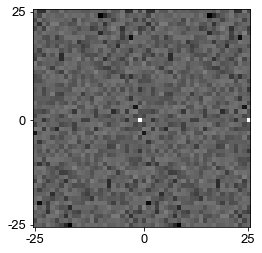

In [261]:
fft = np.fft.fft2(d_a[:,50,:])
fft = np.fft.fftshift(fft)
plt.imshow(np.fliplr(np.log10((abs(fft)))),cmap='gray')


plt.xticks([0,25,49],[-25,0,25])
plt.yticks([0,25,49],[25,0,-25])

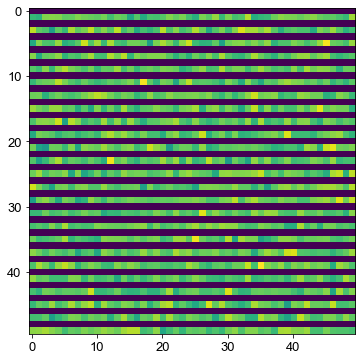

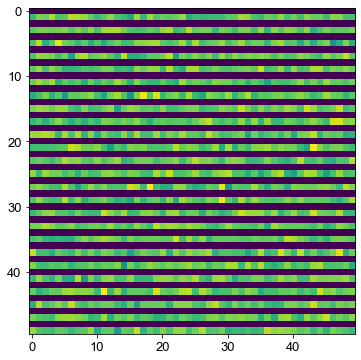

In [242]:
plt.figure(figsize=(6,6))
plt.imshow(d_a[:,50,:])
plt.show()
plt.figure(figsize=(6,6))
plt.imshow(d_b[:,50,:])

In [179]:
# Make phantom
f=.7
#X,Y,Z,P = ma.generate_tetrapod(n=100*f,r_tet=40*f,r_cyl=10*f)

n=32
P = np.zeros((n,n,n))
for i in range(int(n/2)):
    P[:,2*i,:] = 1


# Add noise
Pn = ma.noisy(P,noise_typ='poisson',val_pois=100)
Pn = ma.noisy(Pn,noise_typ='gauss',g_var=.01)
Pn = ma.noisy(Pn,noise_typ='s&p',p_sp=0.005)

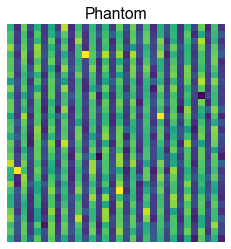

In [180]:
plt.imshow(Pn[:,:,20])
plt.axis('off')
plt.title('Phantom')
plt.show()

In [181]:
# generate projections
angles = ma.generate_angles(mode='x',alpha=70,n_tilt=120)
raw_data = ma.generate_proj_data(Pn,angles)
vectors = ma.generate_vectors(angles)

In [182]:
# split into 2 sets
ang_a = angles[::2]
ang_b = angles[1::2]

d_a = raw_data[:,::2,:]
d_b = raw_data[:,1::2,:]

v_a = vectors[::2]
v_b = vectors[1::2]

In [183]:
# Perform reconstructions
r_tv_a = ma.generate_reconstruction(d_a,v_a,algorithm='TV1',niter=20,callback_freq=20,weight=0.00001)
r_tv_b = ma.generate_reconstruction(d_b,v_b,algorithm='TV1',niter=20,callback_freq=20,weight=0.00001)

r_tvh_a = ma.generate_reconstruction(d_a,v_a,algorithm='TV1',niter=20,callback_freq=20,weight=0.1)
r_tvh_b = ma.generate_reconstruction(d_b,v_b,algorithm='TV1',niter=20,callback_freq=20,weight=0.1)

r_sirt_a = ma.generate_reconstruction(d_a,v_a,algorithm='SIRT3D_CUDA',niter=20)
r_sirt_b = ma.generate_reconstruction(d_b,v_b,algorithm='SIRT3D_CUDA',niter=20)

 Iter   Time      primal          gap        violation       step     
   0%     0s     1.013e+03     1.000e+00          0        0.000e+00  
 100%     0s     2.653e+01    -2.074e-02     4.905e+03     2.487e-02  

 Iter   Time      primal          gap        violation       step     
   0%     0s     1.013e+03     1.000e+00          0        0.000e+00  
 100%     0s     2.653e+01    -2.075e-02     4.922e+03     2.486e-02  

 Iter   Time      primal          gap        violation       step     
   0%     0s     1.013e+03     1.000e+00          0        0.000e+00  
 100%     0s     3.364e+02     8.998e-01     1.561e-02     7.770e-02  

 Iter   Time      primal          gap        violation       step     
   0%     0s     1.013e+03     1.000e+00          0        0.000e+00  
 100%     0s     3.364e+02     8.998e-01     1.468e-02     7.771e-02  



In [184]:
# low weighting
r_tvl_a = ma.generate_reconstruction(d_a,v_a,algorithm='TV1',niter=20,callback_freq=20,weight=1e-10)
r_tvl_b = ma.generate_reconstruction(d_b,v_b,algorithm='TV1',niter=20,callback_freq=20,weight=0)


 Iter   Time      primal          gap        violation       step     
   0%     0s     1.013e+03     1.000e+00          0        0.000e+00  
 100%     0s     2.655e+01    -2.054e-02     4.921e+08     2.505e-02  

 Iter   Time      primal          gap        violation       step     
   0%     0s     1.013e+03     1.000e+00          0        0.000e+00  


..\RegTomoReconMulti.py:1786: RuntimeWarning: invalid value encountered in true_divide
  return max(0, y.max() / scale - 1)


 100%     0s     2.654e+01    -2.056e-02        inf        2.504e-02  



..\RegTomoReconMulti.py:1786: RuntimeWarning: divide by zero encountered in double_scalars
  return max(0, y.max() / scale - 1)


In [90]:
fsc_tvl = FSC(r_tvl_a,r_tvl_b, None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...


In [92]:
ma.COD(r_tv_a,P), ma.COD(r_tvh_a,P), ma.COD(r_tvl_a,P), ma.COD(r_sirt_a,P)

(0.3945217726552196,
 0.37119104178418255,
 0.394553830692992,
 0.36514431510731576)

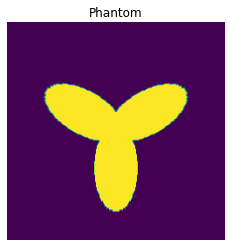

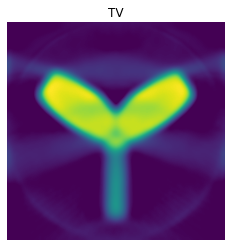

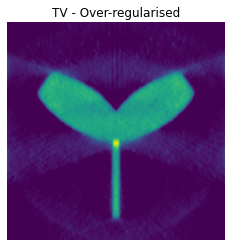

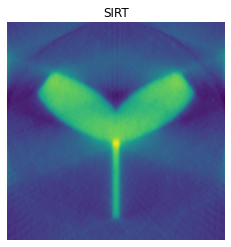

In [44]:
i=100
plt.imshow(P[:,:,i])
plt.axis('off')
plt.title('Phantom')
plt.show()

plt.imshow(r_tv_a[:,:,i])
plt.axis('off')
plt.title('TV')
plt.show()

plt.imshow(r_tvh_a[:,:,i])
plt.axis('off')
plt.title('TV - Over-regularised')
plt.show()

plt.imshow(r_sirt_a[:,:,i])
plt.axis('off')
plt.title('SIRT')
plt.show()

In [41]:
fsc_tv = FSC(r_tv_a,r_tv_b, None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_tvh = FSC(r_tvh_a,r_tvh_b, None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_sirt = FSC(r_sirt_a,r_sirt_b, None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3

In [61]:
np.save('Data/fsc_tvh_tetrapod.npy',fsc_tvh)
np.save('Data/fsc_tv_tetrapod.npy',fsc_tv)
np.save('Data/fsc_tvl_tetrapod.npy',fsc_tvl)
np.save('Data/fsc_sirt_tetrapod.npy',fsc_sirt)

In [76]:
import matplotlib

def plot_topfrontside(P,noise=False):
    font = {'family':'sans-serif','sans-serif':'Arial',
            'size'   : 13}
    matplotlib.rc('font', **font)
    
    p1 =np.mean(P,axis=2)
    p2=np.mean(np.transpose(P,(2,1,0)),axis=2)[::-1]
    p3 = np.flipud(np.mean(P,axis=1).T)
    
    if noise == True:
        p1 = ma.noisy(p1,noise_typ='poisson',val_pois=100)
        p2 = ma.noisy(p2,noise_typ='poisson',val_pois=100)
        p3 = ma.noisy(p3,noise_typ='poisson',val_pois=100)

    f,axs = plt.subplots(ncols=3)
    axs[0].imshow(p1,cmap='Greys_r')
    axs[0].axis('off')
    axs[0].set_title('Top')

    axs[1].imshow(p2,cmap='Greys_r')
    axs[1].axis('off')
    axs[1].set_title('Front')

    axs[2].imshow(p3,cmap='Greys_r')
    axs[2].axis('off')
    axs[2].set_title('Side')
    
# Pn = ma.noisy(P,noise_typ='poisson',val_pois=1e3)
# Pn = ma.noisy(Pn,noise_typ='gauss',g_var=.1)
# Pn = ma.noisy(Pn,noise_typ='s&p',p_sp=0.05)
# plot_topfrontside(Pn)   

In [10]:
import sklearn

In [145]:
from skimage.data import binary_blobs
# Simulate 2D 'blob' phantom
h=30
blobs = binary_blobs(length=128, n_dim=3, volume_fraction=0.13, seed=5,blob_size_fraction=.4)
# # Make specimen thin in third dimension
#groundtruth = np.pad(blobs,(

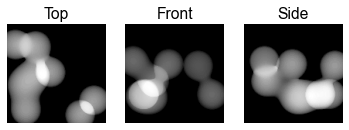

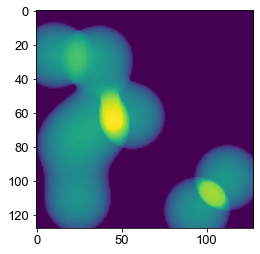

In [146]:
plot_topfrontside(blobs) 
plt.show()
plt.imshow(np.mean(blobs,axis=2))

In [148]:
def plot_scalar_fsc(name='test'):
    
    fsc_tvh=np.load('Data/fsc_tvh_%s.npy'%name,)
    fsc_tv=np.load('Data/fsc_tv_%s.npy'%name,)
    fsc_tvl=np.load('Data/fsc_tvl_%s.npy'%name)
    fsc_sirt=np.load('Data/fsc_sirt_%s.npy'%name)
    
    xmax = len(fsc_tvh)
    xs = np.arange(xmax)/xmax
    
    plt.plot(xs,fsc_tvh,'-^',label='TV - High weight',color='b')
    plt.plot(xs,fsc_tv,'-o',label='TV - Ideal weight',color='dodgerblue')
    plt.plot(xs,fsc_tvl,'-v',label='TV - Low weight',color='cyan',alpha=.5)

    plt.plot(xs,fsc_sirt,'r',label='SIRT')
    plt.legend()
    #plt.xlim([0,25])
    plt.plot([0,1],[0,0],'k:',alpha=0.4)

    plt.legend(fontsize=15)
    plt.ylabel('FSC', fontsize=16)
    plt.xlabel('Spatial frequency (1/Nyquist)', fontsize=16)
    plt.title('%s, single axis, 120 tilts, $\pm 70^{\circ}$, \n 250 x 250 x 250 px, $r_t$ = 100 px, $r_b$ = 25 px'%name)
    
#plot_scalar_fsc(name='test')

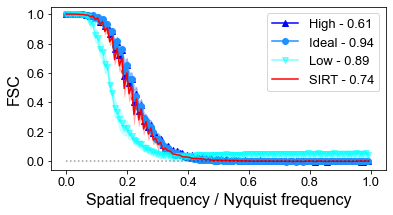

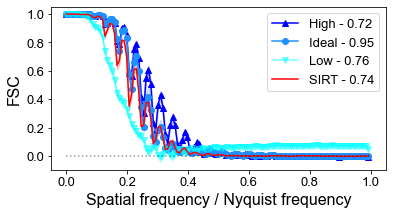

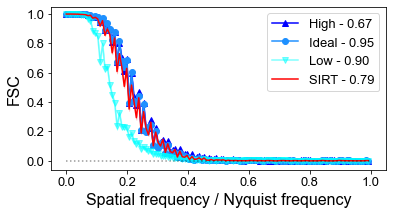

In [301]:
def plot_scalar_fsc_mean(name='test', flip=False,downsample=False, cod = [0.6191715600802089, 0.9380382125484844, 0.8702235097027358, 0.73238437514294],ntest=10):
    plt.figure(figsize=(6,3))
    hs = []
    ms = []
    ls = []
    ss = []
    for i in range(ntest):
        fsc_tvh=np.load('Data/fsc_tvh_%s%i.npy'%(name,i))
        fsc_tvm=np.load('Data/fsc_tv_%s%i.npy'%(name,i),)
        fsc_tvl=np.load('Data/fsc_tvl_%s%i.npy'%(name,i))
        fsc_sirt=np.load('Data/fsc_sirt_%s%i.npy'%(name,i))
        hs.append(fsc_tvh)
        ms.append(fsc_tvm)
        ls.append(fsc_tvl)
        ss.append(fsc_sirt)

        xmax = len(fsc_tvh)
        xs = np.arange(xmax)/xmax

#         plt.plot(xs,fsc_tvh,'-',color='b',alpha=.1)
#         plt.plot(xs,fsc_tvm,'-',color='dodgerblue',alpha=.1)
#         plt.plot(xs,fsc_tvl,'-',color='cyan',alpha=.1)

#         plt.plot(xs,fsc_sirt,'r',alpha=.1)
       

        
    hsm = np.mean(hs,axis=0)
    msm = np.mean(ms,axis=0)
    lsm = np.mean(ls,axis=0)
    ssm = np.mean(ss,axis=0)

    if flip == True:
        hsm2 = hsm
        lsm2 = lsm
        hsm = lsm2
        lsm = hsm2
        
    if downsample == True:
        hsm = hsm[::2]
        msm = msm[::2]
        lsm = lsm[::2]
        ssm = ssm[::2]
        xs = xs[::2]
    
    ehsm = np.std(hs,axis=0)
    emsm = np.std(ms,axis=0)
    elsm = np.std(ls,axis=0)
    essm = np.std(ss,axis=0)
        
    plt.plot(xs,hsm,'-^',label='High - %.2f' % cod[0],color='b')
    plt.plot(xs,msm,'-o',label='Ideal - %.2f' % cod[1],color='dodgerblue')
    plt.plot(xs,lsm,'-v',label='Low - %.2f' % cod[2],color='cyan',alpha=.5)
    plt.plot(xs,ssm,'r',label='SIRT - %.2f' % cod[3])
    
    plt.fill_between(xs,hsm-ehsm,hsm+ehsm,color='b',alpha=.2)
    plt.fill_between(xs,msm-emsm,msm+emsm,color='dodgerblue',alpha=.2)
    plt.fill_between(xs,lsm-elsm,lsm+elsm,color='cyan',alpha=.2)
    plt.fill_between(xs,ssm-essm,ssm+essm,color='r',alpha=.2)
    
    
    plt.legend(loc='upper right')
    #plt.xlim([0,25])
    plt.plot([0,1],[0,0],'k:',alpha=0.4)

    #plt.legend(fontsize=15)
    plt.ylabel('FSC', fontsize=16)
    plt.xlabel('Spatial frequency / Nyquist frequency', fontsize=16)
    #plt.title('%s, single axis, 120 tilts, $\pm 70^{\circ}$, \n 100 x 100 x 100 px, $r_t$ = 100 px, $r_b$ = 25 px\n'%name)

#plot_scalar_fsc_mean(name='pillar')
plot_scalar_fsc_mean(name='pillar2',cod=[0.6128089504624654, 0.9353666502163175, 0.8877762046857309, 0.7363373727578791])
plt.show()
plot_scalar_fsc_mean(name='tetrapod',cod=[0.7205340104736365, 0.9460139622141283, 0.7604139225493918, 0.7443431724471102])
plt.show()
plot_scalar_fsc_mean(name='sphere',cod=[0.6719784229104836, 0.9465622830742725, 0.895091859457671, 0.7861993704719528])

In [166]:
def scalar_fsc_exp(P,name='test',n_tilt=60,alpha=70,callback=True,poiss_count=150,wh=1,wi=0.1,wl=0.01,return_recon=False,zoomin=False,niter=100,alg='TV1',wav=True):
    # generate projections
    angles = ma.generate_angles(mode='x',alpha=alpha,n_tilt=n_tilt)
    raw_data = ma.generate_proj_data(P,angles)
    raw_data = ma.noisy(raw_data,noise_typ='poisson',val_pois=poiss_count)
    ma.plot_phases_interactive(raw_data)
    vectors = ma.generate_vectors(angles)
    
    # split into 2 sets
    ang_a = angles[::2]
    ang_b = angles[1::2]

    d_a = raw_data[:,::2,:]
    d_b = raw_data[:,1::2,:]

    v_a = vectors[::2]
    v_b = vectors[1::2]
    
    cf = 2
    verbose=True
    if callback == False:
        cf = 0
        verbose=False

    # Perform reconstructions
    r_tv_a = ma.generate_reconstruction(d_a,v_a,algorithm=alg,niter=niter,callback_freq=cf,weight=wi)
    r_tv_a = np.transpose(r_tv_a,axes=(2,1,0))[:,::-1,:]
    r_tv_b = ma.generate_reconstruction(d_b,v_b,algorithm=alg,niter=niter,callback_freq=cf,weight=wi)
    r_tv_b = np.transpose(r_tv_b,axes=(2,1,0))[:,::-1,:]

    r_tvh_a = ma.generate_reconstruction(d_a,v_a,algorithm=alg,niter=niter,callback_freq=cf,weight=wh)
    r_tvh_b = ma.generate_reconstruction(d_b,v_b,algorithm=alg,niter=niter,callback_freq=cf,weight=wh)
    r_tvh_a = np.transpose(r_tvh_a,axes=(2,1,0))[:,::-1,:]
    r_tvh_b = np.transpose(r_tvh_b,axes=(2,1,0))[:,::-1,:]
    
    # low weighting
    if wav == False:
        alg = 'TV1_unnorm' # unnorm properly returns to LS solution
    r_tvl_a = ma.generate_reconstruction(d_a,v_a,algorithm=alg,niter=niter,callback_freq=cf,weight=wl)
    r_tvl_b = ma.generate_reconstruction(d_b,v_b,algorithm=alg,niter=niter,callback_freq=cf,weight=wl)
    r_tvl_a = np.transpose(r_tvl_a,axes=(2,1,0))[:,::-1,:]
    r_tvl_b = np.transpose(r_tvl_b,axes=(2,1,0))[:,::-1,:]

    r_sirt_a = ma.generate_reconstruction(d_a,v_a,algorithm='SIRT3D_CUDA',niter=niter)
    r_sirt_b = ma.generate_reconstruction(d_b,v_b,algorithm='SIRT3D_CUDA',niter=niter)
    r_sirt_a = np.transpose(r_sirt_a,axes=(2,1,0))[:,::-1,:]
    r_sirt_b = np.transpose(r_sirt_b,axes=(2,1,0))[:,::-1,:]
    
    print('high, mid, low, sirt')
    print(ma.COD(r_tvh_a,P), ma.COD(r_tv_a,P), ma.COD(r_tvl_a,P), ma.COD(r_sirt_a,P))
    
    if zoomin == True:
        from scipy.ndimage import zoom
        f=2
        r_tv_a = zoom(r_tv_a,(f,f,f))
        r_tv_b = zoom(r_tv_b,(f,f,f))
        r_tvh_a = zoom(r_tvh_a,(f,f,f))
        r_tvh_b = zoom(r_tvh_b,(f,f,f))
        r_tvl_a = zoom(r_tvl_a,(f,f,f))
        r_tvl_b = zoom(r_tvl_b,(f,f,f))
        r_sirt_a = zoom(r_sirt_a,(f,f,f))
        r_sirt_b = zoom(r_sirt_b,(f,f,f))
    
    fsc_tv = FSC(r_tv_a,r_tv_b, None, 100e-9, .5, 3, 0, verbose, None, 0)
    fsc_tvh = FSC(r_tvh_a,r_tvh_b, None, 100e-9, .5, 3, 0, verbose, None, 0)
    fsc_tvl = FSC(r_tvl_a,r_tvl_b, None, 100e-9, .5, 3, 0, verbose, None, 0)
    fsc_sirt = FSC(r_sirt_a,r_sirt_b, None, 100e-9, .5, 3, 0, verbose, None, 0)
    
    np.save('Data/fsc_tvh_%s.npy' % name,fsc_tvh)
    np.save('Data/fsc_tv_%s.npy' % name,fsc_tv)
    np.save('Data/fsc_tvl_%s.npy' % name,fsc_tvl)
    np.save('Data/fsc_sirt_%s.npy' % name,fsc_sirt)
    
    if return_recon == True:
        return r_tvl_a, r_tv_a, r_tvh_a, r_sirt_a

interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.7448482854552362 0.3044567435483271 0.2408732393836727 0.7262966970231798


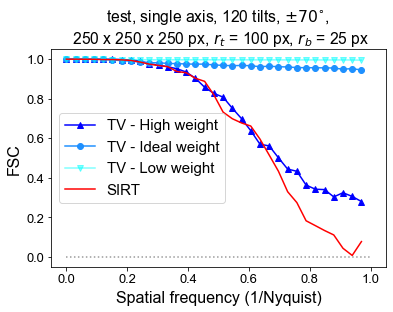

In [305]:
P = binary_blobs(length=50, n_dim=3, volume_fraction=0.13, seed=5,blob_size_fraction=.3)
P = np.pad(P,[[7,7],[7,7],[7,7]])
rl,rm,rh,rs = scalar_fsc_exp(P,name='test',n_tilt=92,callback=False,poiss_count=1000,wh=.01,wi=0.0005,wl=0.000001,return_recon=True,alg='TV1')
plot_scalar_fsc(name='test')

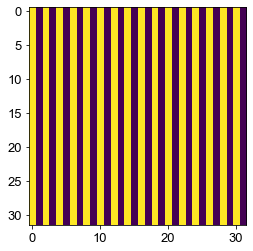

In [161]:
# nyquist phantom
n=32
P = np.zeros((n,n,n))
for i in range(int(n/2)):
    P[:,:,2*i] = 1
    
plt.imshow(p[:,20,:])

interactive(children=(IntSlider(value=49, description='i', max=99), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.8700158109454852 0.8700158109454852 0.8700158109454852 0.8700158109454852


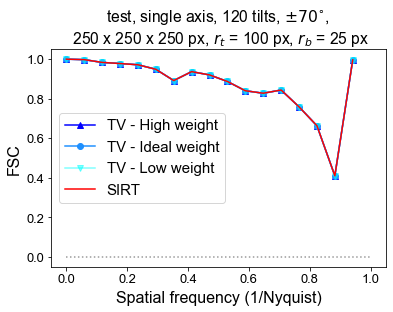

In [172]:
f=0.32
#X,Y,Z,P = ma.generate_pillar_cavities(n=100*f,x_len=70*f,y_len=50*f,z_len=50*f,r_cyl=15*f,depth=25*f)
n=32
P = np.zeros((n,n,n))
for i in range(int(n/2)):
    P[:,2*i,:] = 1
    
rl,rm,rh,rs = scalar_fsc_exp(P,name='test',n_tilt=100,alpha=90,callback=False,poiss_count=1000000,wh=.01,wi=0.0005,wl=0.000001,return_recon=True,alg='SIRT3D_CUDA')
plot_scalar_fsc(name='test')

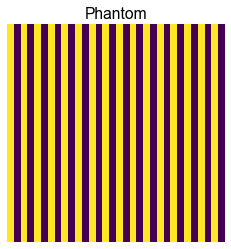

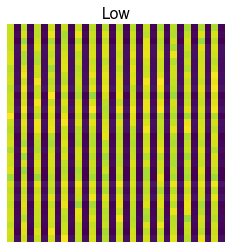

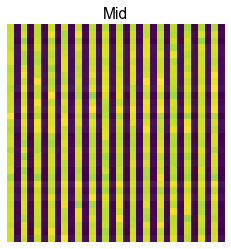

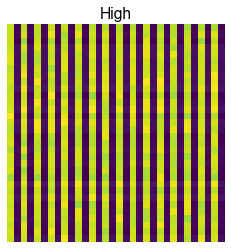

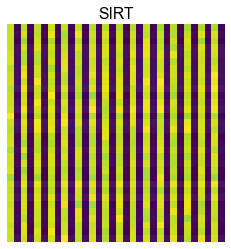

In [170]:
i=30
plt.imshow(P[:,:,i])
plt.axis('off')
plt.title('Phantom')
plt.show()

plt.imshow(rl[:,:,i])
plt.axis('off')
plt.title('Low')
plt.show()

plt.imshow(rm[:,:,i])
plt.axis('off')
plt.title('Mid')
plt.show()

plt.imshow(rh[:,:,i])
plt.axis('off')
plt.title('High')
plt.show()

plt.imshow(rs[:,:,i])
plt.axis('off')
plt.title('SIRT')
plt.show()

In [295]:
n_tilt=100
poiss_count=100
angles = ma.generate_angles(mode='x',alpha=70,n_tilt=n_tilt)
raw_data = ma.generate_proj_data(P,angles)
raw_data = ma.noisy(raw_data,noise_typ='poisson',val_pois=poiss_count)
vectors = ma.generate_vectors(angles)

# split into 2 sets
ang_a = angles[::2]
ang_b = angles[1::2]

d_a = raw_data[:,::2,:]
d_b = raw_data[:,1::2,:]

v_a = vectors[::2]
v_b = vectors[1::2]

cf = 2
verbose=True
callback=False
if callback == False:
    cf = 0
    verbose=False

# Perform reconstructions
wi=0.1
r_tv_a = ma.generate_reconstruction(d_a,v_a,algorithm='TV1',niter=40,callback_freq=cf,weight=wi)

print(ma.COD(P,r_tv_a))

r_tv_a = ma.generate_reconstruction(d_a,v_a,algorithm='TV1',niter=50,callback_freq=cf,weight=wi)

print(ma.COD(P,r_tv_a))

r_tv_a = ma.generate_reconstruction(d_a,v_a,algorithm='TV1',niter=100,callback_freq=cf,weight=wi)

print(ma.COD(P,r_tv_a))

0.2003915183720735
0.1930237485789758
0.17240870314696424


In [306]:
cods = []
for i in range(10):
    cod = [1,2,3,4]
    cods.append(cod)
    
np.mean(cods,axis=0)

array([1., 2., 3., 4.])

In [53]:
def average_scalar_fsc(P,name='test',ntest=10,wav=True):
    cods = []
    for i in range(ntest):
        ax,ay,az=np.random.rand(3)*360
        Pr = ma.rotate_bulk(P,ax,ay,az)
        if wav == True:
            rl,rm,rh,rs = scalar_fsc_exp(Pr,name=name+str(i),n_tilt=92,callback=False,poiss_count=100,wh=.01,wi=0.0005,wl=0.000001,return_recon=True,alg='wavelet_coif1')
        else: #TV
            rl,rm,rh,rs = scalar_fsc_exp(Pr,name=name+str(i),n_tilt=92,callback=False,poiss_count=100,wh=.005,wi=.01,wl=1,return_recon=True,alg='TV1',wav=False)
        cod = [ma.COD(rh,Pr), ma.COD(rm,Pr), ma.COD(rl,Pr), ma.COD(rs,Pr)]
        cods.append(cod)
    mcods=np.mean(cods,axis=0)
    print('mean',mcods)
    import astra
    astra.clear()

In [ ]:
def average_scalar_fsc_blob(name='test',ntest=10,wav=True,poiss_count=100):
    cods = []
    for i in range(ntest):
        Pr = binary_blobs(length=128, n_dim=3, volume_fraction=0.13, seed=5+i,blob_size_fraction=.3)
        if wav == True:
            rl,rm,rh,rs = scalar_fsc_exp(Pr,name=name+str(i),n_tilt=92,callback=False,poiss_count=poiss_count,wh=.01,wi=0.0005,wl=0.000001,return_recon=True,alg='wavelet_coif1')
        else: #TV
            rl,rm,rh,rs = scalar_fsc_exp(Pr,name=name+str(i),n_tilt=92,callback=False,poiss_count=poiss_count,wh=.005,wi=.01,wl=1,return_recon=True,alg='TV1',wav=False)
        cod = [ma.COD(rh,Pr), ma.COD(rm,Pr), ma.COD(rl,Pr), ma.COD(rs,Pr)]
        import astra
        astra.clear()
    
    cods.append(cod)
    mcods=np.mean(cods,axis=0)
    print('mean',mcods)
    

average_scalar_fsc_blob(name='blobs_wav',ntest=3,poiss_count=1000)
average_scalar_fsc_blob(name='blobs',ntest=3,wav=False,poiss_count=1000)

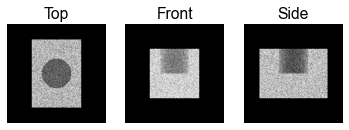

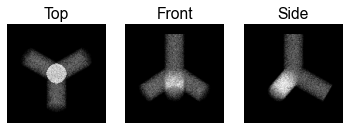

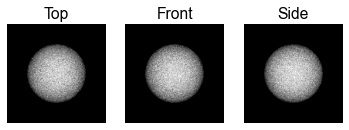

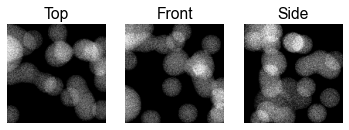

In [292]:
f=1.28
X,Y,Z,P = ma.generate_pillar_cavities(n=100*f,x_len=70*f,y_len=50*f,z_len=50*f,r_cyl=15*f,depth=25*f)
plot_topfrontside(P,noise=True)

plt.show()

X,Y,Z,P = ma.generate_tetrapod(n=100*f,r_tet=40*f,r_cyl=10*f)
plot_topfrontside(P,noise=True)

plt.show
X,Y,Z,P = ma.generate_sphere(n=100*f,r=30*f)
plot_topfrontside(P,noise=True)

P = binary_blobs(length=128, n_dim=3, volume_fraction=0.13, seed=5,blob_size_fraction=.3)
plot_topfrontside(P,noise=True)

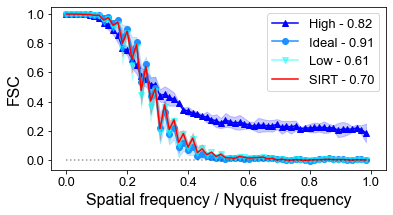

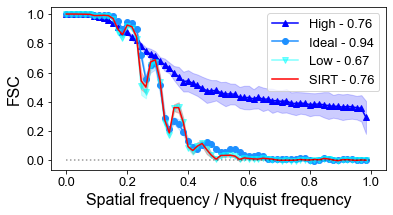

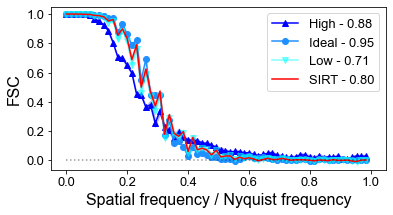

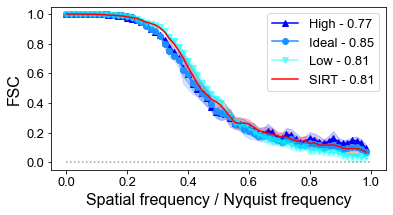

In [309]:
plot_scalar_fsc_mean(name='pillar3',cod=[0.81615099, 0.9143189,  0.60573318, 0.7042273],ntest=3)
plt.show()
plot_scalar_fsc_mean(name='tetrapod3',cod=[0.75993528, 0.93927077, 0.67093445 ,0.75575774],ntest=3)
plt.show()
plot_scalar_fsc_mean(name='sphere3',cod=[0.87660465 ,0.94932669 ,0.70811911, 0.79875113],ntest=3)
plt.show()
plot_scalar_fsc_mean(name='blobs3',cod=[0.76891291, 0.84657125, 0.80983429, 0.81123155],ntest=3)

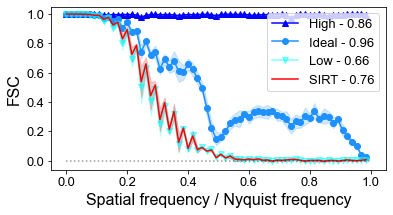

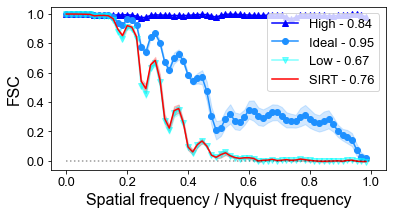

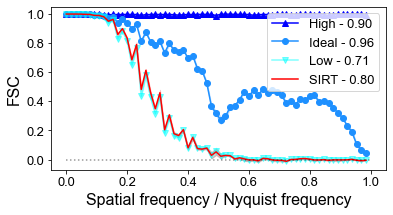

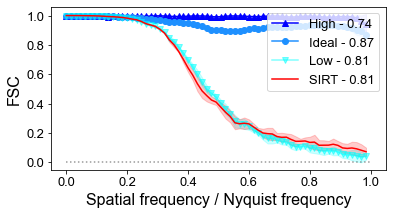

In [313]:
plot_scalar_fsc_mean(name='pillar_wav',cod=[0.8597330215009293, 0.9571627604675804, 0.6567889520468051, 0.7609881076958522],ntest=3)
plt.show()
plot_scalar_fsc_mean(name='tetrapod_wav',cod=[0.8442953865620066, 0.9481052355746051, 0.6675516965744257, 0.7557660035230697],ntest=3)
plt.show()
plot_scalar_fsc_mean(name='sphere_wav',cod=[0.9018827474913738, 0.9613519551364803, 0.706816956348655, 0.7978283293148865],ntest=3)
plt.show()
plot_scalar_fsc_mean(name='blobs_wav3',cod=[0.74102804, 0.86667006, 0.81190247 ,0.81132011],ntest=3)

In [58]:
f=1.28
# X,Y,Z,P = ma.generate_pillar_cavities(n=100*f,x_len=70*f,y_len=50*f,z_len=50*f,r_cyl=15*f,depth=25*f)
# average_scalar_fsc(P,name='pillar_wav',ntest=3)


X,Y,Z,P = ma.generate_tetrapod(n=100*f,r_tet=40*f,r_cyl=10*f)
average_scalar_fsc(P,name='tetrapod_wav',ntest=3)


X,Y,Z,P = ma.generate_sphere(n=100*f,r=30*f)
average_scalar_fsc(P,name='sphere_wav',ntest=3)

interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.8442953865620066 0.9481052355746051 0.6675516965744257 0.7557660035230697


interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.8379453406689724 0.9429800122780087 0.6843665519099704 0.7603455129074981


interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.8359120251158683 0.9310746318124625 0.6423370613337218 0.7322082322916875
mean [0.83938425 0.94071996 0.66475177 0.74943992]


interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.9018827474913738 0.9613519551364803 0.706816956348655 0.7978283293148865


interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.9017079198370753 0.9609054450754215 0.707603403425411 0.7985049922514894


interactive(children=(IntSlider(value=45, description='i', max=91), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.9016976158798391 0.9613691689556627 0.7078835511329342 0.7987758938542227
mean [0.90176276 0.96120886 0.70743464 0.79836974]


In [352]:
f=.7
X,Y,Z,P = ma.generate_pillar_cavities(n=100*f,x_len=70*f,y_len=50*f,z_len=50*f,r_cyl=15*f,depth=25*f)
angles = ma.generate_angles(mode='x',alpha=70,n_tilt=120)
raw_data = ma.generate_proj_data(P,angles)
raw_data_n = ma.noisy(raw_data,noise_typ='poisson',val_pois=100)

SNR:  41.360539032204606


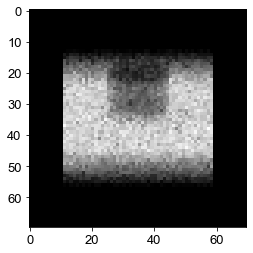

In [354]:
plt.imshow(raw_data_n[:,0,:],cmap='Greys_r')
#plt.axis('off')

noise = raw_data_n-raw_data
SNR = np.var(raw_data)/np.var(noise)
print('SNR: ',SNR)

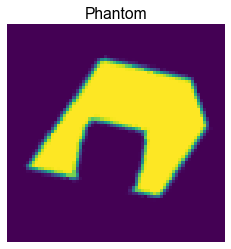

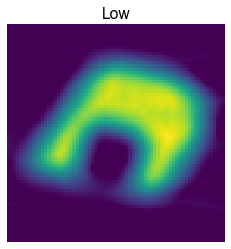

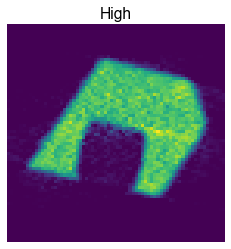

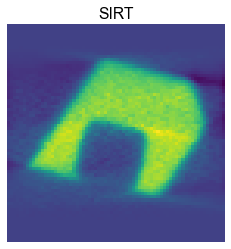

In [289]:
i=30
plt.imshow(P[:,:,i])
plt.axis('off')
plt.title('Phantom')
plt.show()

plt.imshow(rm[:,:,i])
plt.axis('off')
plt.title('Low')
plt.show()

plt.imshow(rh[:,:,i])
plt.axis('off')
plt.title('High')
plt.show()

plt.imshow(rs[:,:,i])
plt.axis('off')
plt.title('SIRT')
plt.show()

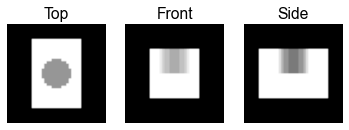

interactive(children=(IntSlider(value=29, description='i', max=59), Output()), _dom_classes=('widget-interact'…

high, mid, low, sirt
0.7223030131521887 0.9028611344618556 0.6368005465833555 0.7380536747402575


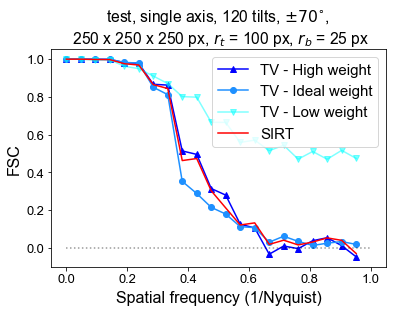

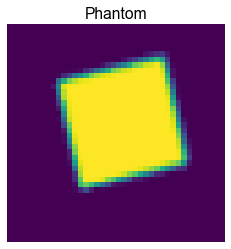

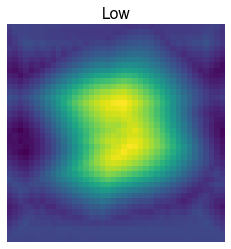

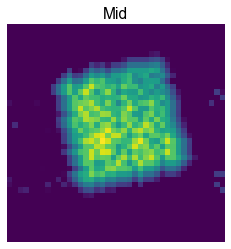

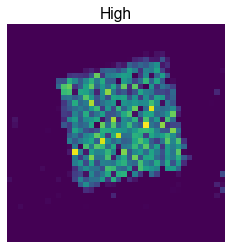

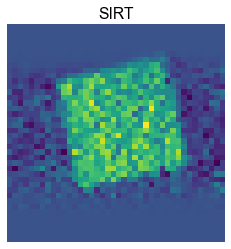

In [332]:
# Make phantom
f=.4
#X,Y,Z,P = ma.generate_tetrapod(n=100*f,r_tet=40*f,r_cyl=10*f)
X,Y,Z,P = ma.generate_pillar_cavities(n=100*f,x_len=70*f,y_len=50*f,z_len=50*f,r_cyl=15*f,depth=25*f)
#X,Y,Z,P = ma.generate_sphere(n=100*f,r=25*f)

plot_topfrontside(P) 

ax,ay,az=np.random.rand(3)*360

P = ma.rotate_bulk(P,ax,ay,az)


plt.show()
rl,rm,rh,rs = scalar_fsc_exp(P,name='test',n_tilt=60,callback=False,poiss_count=100,wh=.1,wi=0.01,wl=0.001, return_recon = True)
plot_scalar_fsc(name='test')
plt.show()
i=30
title = ['Phantom', 'Low', 'Mid', 'High', 'SIRT']
for j,im in enumerate([P,rl,rm,rh,rs]):
    plt.imshow(im[:,:,i])
    plt.axis('off')
    plt.title(title[j])
    plt.show()

In [211]:
f=2.5
X,Y,Z,P = ma.generate_sphere(n=100*f,r=30*f)

# Add noise
Pn = ma.noisy(P,noise_typ='poisson',val_pois=1e3)
Pn = ma.noisy(Pn,noise_typ='gauss',g_var=.1)
Pn = ma.noisy(Pn,noise_typ='s&p',p_sp=0.05)


plot_topfrontside(Pn) 
plt.show()
scalar_fsc_exp(Pn,name='sphere')
plot_scalar_fsc(name='sphere')

KeyboardInterrupt: 

..\multi_axis.py:804: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = np.max(image) # set value to max
..\multi_axis.py:810: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = np.min(image) # set value to min


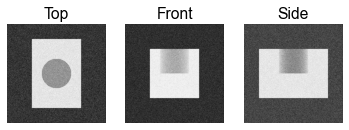

 Iter   Time      primal          gap        violation       step     
   0%     1s     1.852e+05     1.000e+00          0        0.000e+00  
  10%     6s     2.988e+05     1.000e+00     2.247e+04     2.327e+00  
  20%    11s     1.518e+05     3.743e-01     1.356e+04     1.705e+00  
  30%    17s     3.428e+03    -6.904e-01     1.914e+04     9.387e-01  
  40%    23s     2.227e+03    -1.951e-01     2.388e+04     2.873e-01  
  50%    28s     1.802e+03     2.597e-02     2.728e+04     1.595e-01  
  60%    34s     1.538e+03    -1.595e-02     3.014e+04     1.162e-01  
  70%    39s     1.499e+03    -1.210e-01     3.278e+04     8.512e-02  
  80%    45s     1.497e+03    -1.966e-01     3.529e+04     6.586e-02  
  90%    50s     1.508e+03    -2.325e-01     3.768e+04     5.631e-02  
 100%    56s     1.534e+03    -2.471e-01     3.996e+04     4.950e-02  

 Iter   Time      primal          gap        violation       step     
   0%     1s     1.859e+05     1.000e+00          0        0.000e+00  
  10%

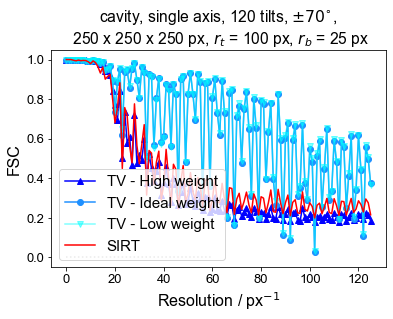

In [146]:
f=2.5
X,Y,Z,P = ma.generate_pillar_cavities(n=100*f,x_len=70*f,y_len=50*f,z_len=50*f,r_cyl=15*f,depth=25*f)

# Add noise
Pn = ma.noisy(P,noise_typ='poisson',val_pois=1e3)
Pn = ma.noisy(Pn,noise_typ='gauss',g_var=.1)
Pn = ma.noisy(Pn,noise_typ='s&p',p_sp=0.05)

plot_topfrontside(Pn) 
plt.show()
scalar_fsc_exp(Pn,name='cavity')
plot_scalar_fsc(name='cavity')

..\multi_axis.py:804: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = np.max(image) # set value to max
..\multi_axis.py:810: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = np.min(image) # set value to min


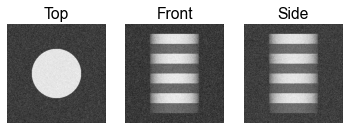

 Iter   Time      primal          gap        violation       step     
   0%     1s     1.542e+05     1.000e+00          0        0.000e+00  
  10%     6s     2.525e+05     1.000e+00     8.440e+03     2.328e+00  
  20%    11s     1.301e+05     3.874e-01     5.992e+03     1.770e+00  
  30%    17s     2.864e+03    -6.601e-01     8.998e+03     1.002e+00  
  40%    23s     2.152e+03     3.973e-02     1.251e+04     2.715e-01  
  50%    28s     1.780e+03     2.234e-01     1.523e+04     1.384e-01  
  60%    34s     1.607e+03     6.505e-02     1.725e+04     1.078e-01  
  70%    39s     1.608e+03    -6.035e-02     1.889e+04     7.741e-02  
  80%    45s     1.615e+03    -1.125e-01     2.035e+04     6.162e-02  
  90%    50s     1.627e+03    -1.238e-01     2.170e+04     5.428e-02  
 100%    55s     1.647e+03    -1.247e-01     2.297e+04     4.836e-02  

 Iter   Time      primal          gap        violation       step     
   0%     1s     1.554e+05     1.000e+00          0        0.000e+00  
  10%

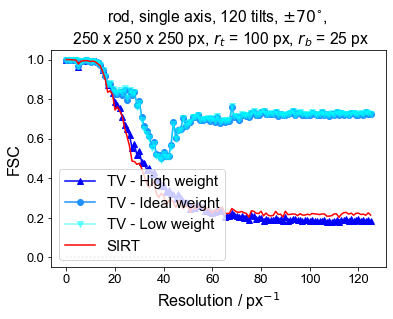

In [147]:
f=2.5
X,Y,Z,P = ma.generate_layered_rod(n=100*f,r=25*f,length=80*f,disc_width=10*f)

# Add noise
Pn = ma.noisy(P,noise_typ='poisson',val_pois=1e3)
Pn = ma.noisy(Pn,noise_typ='gauss',g_var=.1)
Pn = ma.noisy(Pn,noise_typ='s&p',p_sp=0.05)

plot_topfrontside(Pn) 
plt.show()
scalar_fsc_exp(Pn,name='rod')
plot_scalar_fsc(name='rod')

FSC CuCO lower reg

In [134]:
d2_mlr_a = np.load(r'Data/FSC/mod2_lowreg2_ma_a.npy')
d2_mlr_b = np.load(r'Data/FSC/mod2_lowreg2_ma_b.npy')

In [135]:
fsc_mlr1 = FSC(d2_mlr_a[0][:,:,100:440], d2_mlr_b[0][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_mlr2 = FSC(d2_mlr_a[1][:,:,100:440], d2_mlr_b[1][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_mlr3 = FSC(d2_mlr_a[2][:,:,100:440], d2_mlr_b[2][:,:,100:440], None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.

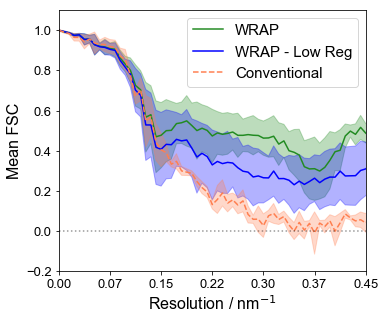

In [137]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)

r = 1.34


plt.figure(figsize=[5.5,4.8])

fsc_m_avg = np.mean([fsc_2m0,fsc_2m1,fsc_2m2],axis=0)
fsc_mlr_avg = np.mean([fsc_mlr1,fsc_mlr2,fsc_mlr3],axis=0)
fsc_c_avg = np.mean([fsc_2c0,fsc_2c1,fsc_2c2],axis=0)

es_m = np.std([fsc_2m0,fsc_2m1,fsc_2m2],axis=0)
es_mlr = np.std([fsc_mlr1,fsc_mlr2,fsc_mlr3],axis=0)
es_c = np.std([fsc_2c0,fsc_2c1,fsc_2c2],axis=0)

xs = np.arange(len(fsc_2m0))
fsc_c_avg[0]=1
es_c[0]=es_c[1]
plt.plot(fsc_m_avg, 'g-', label='WRAP', color='forestgreen')
plt.plot(fsc_mlr_avg, 'b-', label='WRAP - Low Reg')
plt.plot(fsc_c_avg, 'r--', label = 'Conventional', color='coral')
plt.fill_between(xs,fsc_m_avg-es_m,fsc_m_avg+es_m, color='forestgreen',alpha=.3)
plt.fill_between(xs,fsc_mlr_avg-es_mlr,fsc_mlr_avg+es_mlr, color='b',alpha=.3)
plt.fill_between(xs,fsc_c_avg-es_c,fsc_c_avg+es_c, color='coral',alpha=.3)
#plt.plot(fsc_2m0, 'g-', label='WRAP - 2')

plt.legend(fontsize=15)
plt.ylabel('Mean FSC', fontsize=16)
plt.xlabel('Resolution / nm$^{-1}$', fontsize=16)
plt.xlim([1,60])
plt.ylim([-.2,1.1])
plt.plot([0,60],[0,0],'k:',alpha=0.4)

# from matplotlib.ticker import FormatStrFormatter
# ax=plt.gca()
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

ix = np.array([0,10,20,30,40,50,60])
rx = ix*1/r/100
srx = ['%.2f'%x for x in rx]
plt.xticks(ticks=ix,labels=srx)
plt.show()


fsc sphere phantom

In [138]:
[phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s,MX_s,MY_s,MZ_s,AX_s,AY_s,AZ_s ] = np.load(r'Phantoms/sphere_phantom.npy',allow_pickle=True)
cut=int(np.shape(phis_s)[1]/2)
px = phis_s[:,:cut]
py = phis_s[:,cut:]
ang_x=angles_s[:cut]
ang_y=angles_s[cut:]

In [139]:
mod=2
px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb = fsc_datasplit(px,py,ang_x,ang_y,mod=mod)
fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params_s,
             n_save='sphere_wrap_ideal',n_pad=44,nmaj=3,nmin=12,weight=9e-3,th1=.2,th2 =.8)
fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params_s,
             n_save='sphere_wrap_low',n_pad=44,nmaj=3,nmin=12,weight=1e-4,th1=.2,th2 =.8)
fsc_recon_ma(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params_s,
             n_save='sphere_wrap_high',n_pad=44,nmaj=3,nmin=12,weight=8e-2,th1=.2,th2 =.8)
fsc_recon_conv(px_splita, px_splitb, py_splita, py_splitb, ang_x_splita,ang_x_splitb, ang_y_splita, ang_y_splitb, mesh_params_s,
               n_save='sphere_conv',nmin=3)

Initialised
 Iter   Time      primal          gap        violation       step     
   0%     0s     8.866e-02     9.910e-01          0        0.000e+00  
   8%     0s     3.960e-02     3.897e-01          0        1.000e+00  
  16%     1s     3.332e-02     1.937e-01          0        2.662e-01  
  25%     1s     3.161e-02     1.096e-01          0        1.305e-01  
  33%     2s     3.110e-02     7.827e-02          0        7.838e-02  
  41%     2s     3.098e-02     7.829e-02          0        5.506e-02  
  50%     3s     3.099e-02     7.838e-02          0        4.390e-02  
  58%     4s     3.105e-02     7.856e-02          0        3.880e-02  
  66%     4s     3.115e-02     7.870e-02          0        3.581e-02  
  75%     5s     3.128e-02     7.847e-02          0        3.371e-02  
  83%     5s     3.141e-02     7.825e-02          0        3.250e-02  
  91%     6s     3.155e-02     7.813e-02          0        3.151e-02  
 100%     6s     3.168e-02     7.805e-02          0        3.070e

In [145]:
s_w_i_a = np.load(r'Data/FSC/sphere_wrap_ideal_ma_a.npy')
np.shape(np.linalg.norm(s_w_i_a,axis=0))

(128, 128, 128)

In [181]:
s_w_i_a = np.linalg.norm(np.load(r'Data/FSC/sphere_wrap_ideal_ma_a.npy'),axis=0)
s_w_i_b = np.linalg.norm(np.load(r'Data/FSC/sphere_wrap_ideal_ma_b.npy'),axis=0)

s_w_l_a = np.linalg.norm(np.load(r'Data/FSC/sphere_wrap_low_ma_a.npy'),axis=0)
s_w_l_b = np.linalg.norm(np.load(r'Data/FSC/sphere_wrap_low_ma_b.npy'),axis=0)

s_w_h_a = np.linalg.norm(np.load(r'Data/FSC/sphere_wrap_high_ma_a.npy'),axis=0)
s_w_h_b = np.linalg.norm(np.load(r'Data/FSC/sphere_wrap_high_ma_b.npy'),axis=0)

s_c_a = np.linalg.norm(np.load(r'Data/FSC/sphere_conv_conv_a.npy'),axis=0)
s_c_b = np.linalg.norm(np.load(r'Data/FSC/sphere_conv_conv_b.npy'),axis=0)

In [212]:
n=44
fsc_w_i = FSC(s_w_i_a[n:-n,n:-n,n:-n],s_w_i_b[n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_l = FSC(s_w_l_a[n:-n,n:-n,n:-n],s_w_l_b[n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_h = FSC(s_w_h_a[n:-n,n:-n,n:-n],s_w_h_b[n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_c = FSC(s_c_a[n:-n,n:-n,n:-n],s_c_b[n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3

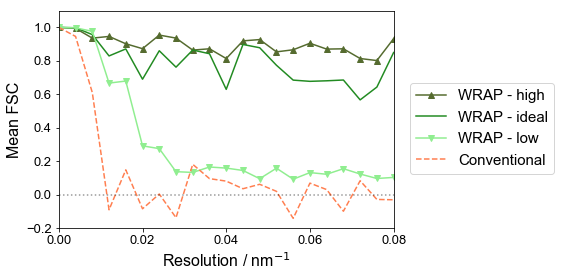

In [220]:
plt.plot(fsc_w_h,'-^',label='WRAP - high',color='darkolivegreen')
plt.plot(fsc_w_i,label='WRAP - ideal',color='forestgreen')
plt.plot(fsc_w_l,'-v',label='WRAP - low',color='lightgreen')

plt.plot(fsc_c,'--',label='Conventional',color='coral')


plt.legend(fontsize=15,loc=(1.05,.25))
plt.ylabel('Mean FSC', fontsize=16)
plt.xlabel('Resolution / nm$^{-1}$', fontsize=16)
plt.xlim([1,20])
plt.ylim([-.2,1.1])
plt.plot([0,60],[0,0],'k:',alpha=0.4)

from matplotlib.ticker import FormatStrFormatter
ax=plt.gca()
ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

ix = np.array([0,5,10,15,20])
rx = ix*1/r/100*1e-9
srx = ['%.2f'%x for x in rx]
plt.xticks(ticks=ix,labels=srx)
plt.show()

In [154]:
s_w_i_a = np.load(r'Data/FSC/sphere_wrap_ideal_ma_a.npy')
s_w_i_b = np.load(r'Data/FSC/sphere_wrap_ideal_ma_b.npy')

s_w_l_a =np.load(r'Data/FSC/sphere_wrap_low_ma_a.npy')
s_w_l_b = np.load(r'Data/FSC/sphere_wrap_low_ma_b.npy')

s_w_h_a = np.load(r'Data/FSC/sphere_wrap_high_ma_a.npy')
s_w_h_b = np.load(r'Data/FSC/sphere_wrap_high_ma_b.npy')

s_c_a = np.load(r'Data/FSC/sphere_conv_conv_a.npy')
s_c_b = np.load(r'Data/FSC/sphere_conv_conv_b.npy')

In [155]:
n=44
fsc_w_i1 = FSC(s_w_i_a[0][n:-n,n:-n,n:-n],s_w_i_b[0][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_i2 = FSC(s_w_i_a[1][n:-n,n:-n,n:-n],s_w_i_b[1][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_i3 = FSC(s_w_i_a[2][n:-n,n:-n,n:-n],s_w_i_b[2][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_i = np.mean([fsc_w_i1,fsc_w_i2,fsc_w_i3],axis=0)
es_w_i = np.std([fsc_w_i1,fsc_w_i2,fsc_w_i3],axis=0)

fsc_w_l1 = FSC(s_w_l_a[0][n:-n,n:-n,n:-n],s_w_l_b[0][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_l2 = FSC(s_w_l_a[1][n:-n,n:-n,n:-n],s_w_l_b[1][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_l3 = FSC(s_w_l_a[2][n:-n,n:-n,n:-n],s_w_l_b[2][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_l = np.mean([fsc_w_l1,fsc_w_l2,fsc_w_l3],axis=0)
es_w_l = np.std([fsc_w_l1,fsc_w_l2,fsc_w_l3],axis=0)

fsc_w_h1 = FSC(s_w_h_a[0][n:-n,n:-n,n:-n],s_w_h_b[0][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_h2 = FSC(s_w_h_a[1][n:-n,n:-n,n:-n],s_w_h_b[1][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_h3 = FSC(s_w_h_a[2][n:-n,n:-n,n:-n],s_w_h_b[2][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_w_h = np.mean([fsc_w_h1,fsc_w_h2,fsc_w_h3],axis=0)
es_w_h = np.std([fsc_w_h1,fsc_w_h2,fsc_w_h3],axis=0)

fsc_c1 = FSC(s_c_a[0][n:-n,n:-n,n:-n],s_c_b[0][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_c2 = FSC(s_c_a[1][n:-n,n:-n,n:-n],s_c_b[1][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_c3 = FSC(s_c_a[2][n:-n,n:-n,n:-n],s_c_b[2][n:-n,n:-n,n:-n], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_c = np.mean([fsc_c1,fsc_c2,fsc_c3],axis=0)
es_c = np.std([fsc_c1,fsc_c2,fsc_c3],axis=0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3% finished ...
19.0% finished ...
23.8% finished ...
28.6% finished ...
33.3% finished ...
38.1% finished ...
42.9% finished ...
47.6% finished ...
52.4% finished ...
57.1% finished ...
61.9% finished ...
66.7% finished ...
71.4% finished ...
76.2% finished ...
81.0% finished ...
85.7% finished ...
90.5% finished ...
95.2% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.8% finished ...
9.5% finished ...
14.3

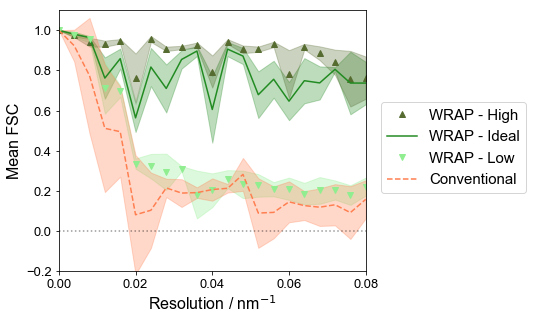

In [176]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)

r = 1
r = mesh_params_s[1][0]/mesh_params_s[2][0]

plt.figure(figsize=[5.5,4.8])

xs = np.arange(len(fsc_c1))
plt.plot(fsc_w_h, 'g^', label='WRAP - High', color='darkolivegreen')
plt.plot(fsc_w_i, 'g-', label='WRAP - Ideal', color='forestgreen')
plt.plot(fsc_w_l, 'gv', label='WRAP - Low', color='lightgreen')

plt.plot(fsc_c, 'r--', label = 'Conventional', color='coral')
plt.fill_between(xs,fsc_w_i-es_w_i,fsc_w_i+es_w_i, color='forestgreen',alpha=.3)
plt.fill_between(xs,fsc_w_l-es_w_l,fsc_w_l+es_w_l, color='lightgreen',alpha=.3)
plt.fill_between(xs,fsc_w_h-es_w_h,fsc_w_h+es_w_h, color='darkolivegreen',alpha=.3)
plt.fill_between(xs,fsc_c-es_c,fsc_c+es_c, color='coral',alpha=.3)
#plt.plot(fsc_2m0, 'g-', label='WRAP - 2')

plt.legend(fontsize=15,loc=(1.05,.3))
plt.ylabel('Mean FSC', fontsize=16)
plt.xlabel('Resolution / nm$^{-1}$', fontsize=16)
plt.xlim([1,20])
plt.ylim([-.2,1.1])
plt.plot([0,60],[0,0],'k:',alpha=0.4)

from matplotlib.ticker import FormatStrFormatter
ax=plt.gca()
ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

ix = np.array([0,5,10,15,20])
rx = ix*1/r/100*1e-9
srx = ['%.2f'%x for x in rx]
plt.xticks(ticks=ix,labels=srx)
plt.show()


In [75]:
fsc_2m0 = FSC(d2_m_a[0], d2_m_b[0], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_2c0 = FSC(d2_c_a[0], d2_c_b[0], None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...


In [81]:
fsc_4m0 = FSC(d4_m_a[0], d2_m_b[0], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_4c0 = FSC(d4_c_a[0], d2_c_b[0], None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...


In [84]:
fsc_2m2 = FSC(d2_m_a[2], d2_m_b[2], None, 100e-9, .5, 3, 0, 1, None, 0)
fsc_2c2 = FSC(d2_c_a[2]/10, d2_c_b[2]/10, None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...
Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.3% finished ...
14.0% finished ...
18.7% finished ...
23.3% finished ...
28.0% finished ...
32.7% finished ...
37.4% finished ...
42.0% finished ...
46.7% finished ...
51.4% finished ...
56.0% finished ...
60.7% finished ...
65.4% finished ...
70.0% finished ...
74.7% finished ...
79.4% finished ...
84.0% finished ...
88.7% finished ...
93.4% finished ...
98.1% finished ...


Text(0.5, 1.0, 'BZ component - Data split in two')

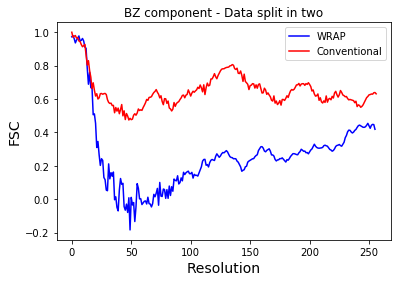

In [99]:
plt.plot(fsc_2m2[1:], 'b-', label='WRAP')
plt.plot(fsc_2c2, 'r-', label = 'Conventional')
#plt.plot(fsc_2m0, 'g-', label='WRAP - 2')

plt.legend()
plt.ylabel('FSC', fontsize=14)
plt.xlabel('Resolution', fontsize=14)
plt.title('BZ component - Data split in two')

Text(0.5, 0, 'Resolution')

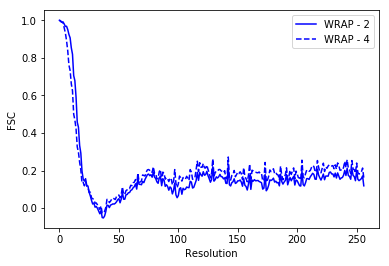

In [83]:
plt.plot(fsc_2m0, 'b-', label='WRAP - 2')
#plt.plot(fsc_2c0, 'r-', label = 'Conventional - 2')
plt.plot(fsc_4m0, 'b--', label='WRAP - 4')
#plt.plot(fsc_4c0, 'r--', label = 'Conventional - 4')
plt.legend()
plt.ylabel('FSC')
plt.xlabel('Resolution')

Text(0.5, 1.0, 'Halfmap difference - Conventional')

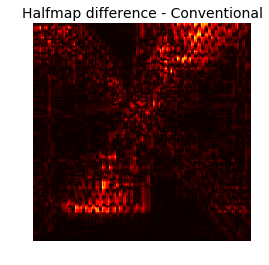

In [102]:
plt.imshow(abs(d2_c_a[0][:,250]-d2_c_b[0][:,250]),cmap='hot')
plt.axis('off')
plt.title('Halfmap difference - Conventional',fontsize=14)

boo!Surprise!

In [124]:
bz_rot_c2a = ma.rotate_bulk(d2_c_a[0],-30,-10,45)
bz_rot_c2b = ma.rotate_bulk(d2_c_b[0],-30,-10,45)

In [134]:
n=80
bz_rot_c2a_crop = bz_rot_c2a[205-n:255+n,:,225-n:275+n]
bz_rot_c2b_crop = bz_rot_c2b[205-n:255+n,:,225-n:275+n]

In [135]:
fsc_crop = FSC(bz_rot_c2a_crop, bz_rot_c2b_crop, None, 100e-9, .5, 3, 0, 1, None, 0)

Run permutation test of each resolution shell ...
0.0% finished ...
4.7% finished ...
9.4% finished ...
14.2% finished ...
18.9% finished ...
23.6% finished ...
28.3% finished ...
33.0% finished ...
37.7% finished ...
42.5% finished ...
47.2% finished ...
51.9% finished ...
56.6% finished ...
61.3% finished ...
66.0% finished ...
70.8% finished ...
75.5% finished ...
80.2% finished ...
84.9% finished ...
89.6% finished ...
94.3% finished ...
99.1% finished ...


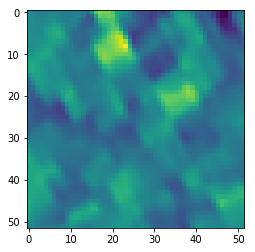

In [133]:
plt.imshow(bz_rot_c2b_crop[:,210,:]-bz_rot_c2a_crop[:,210,:])

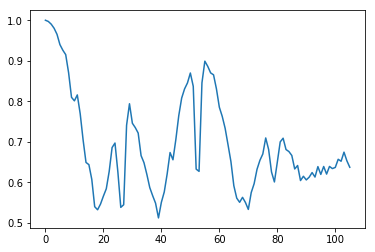

In [136]:
plt.plot(fsc_crop)

# Generate phantoms

In [78]:
# Create realistic phantoms
# phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h,MX_h,MY_h,MZ_h,AX_h,AY_h,AZ_h = create_hopfion_data()
# phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b,MX_b,MY_b,MZ_b,AX_b,AY_b,AZ_b = create_bubble_data()
phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s,MX_s,MY_s,MZ_s,AX_s,AY_s,AZ_s = create_sphere_data()

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\scipy\ndimage\interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [71]:
# Save realistic phantoms
fpath = r'Phantoms/hopfion_phantom.npy'
data = np.array([phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h,MX_h,MY_h,MZ_h,AX_h,AY_h,AZ_h],dtype=object)
np.save(fpath,data)

fpath = r'Phantoms/bubble_phantom.npy'
data = np.array([phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b,MX_b,MY_b,MZ_b,AX_b,AY_b,AZ_b],dtype=object)
np.save(fpath,data)

fpath = r'Phantoms/sphere_phantom.npy'
data = np.array([phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s,MX_s,MY_s,MZ_s,AX_s,AY_s,AZ_s],dtype=object)
np.save(fpath,data)

In [387]:
# Create ideal phantoms
phis_hi, angles_hi, BX_hi,BY_hi,BZ_hi, mesh_params_hi,MX_hi,MY_hi,MZ_hi = create_hopfion_data_ideal(tilt=30)
phis_bi, angles_bi, BX_bi,BY_bi,BZ_bi, mesh_params_bi,MX_bi,MY_bi,MZ_bi = create_bubble_data_ideal(tilt=30)
phis_si, angles_si, BX_si,BY_si,BZ_si, mesh_params_si,MX_si,MY_si,MZ_si = create_sphere_data_ideal(tilt=30)

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\scipy\ndimage\interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [388]:
# Save ideal phantoms
fpath = r'Phantoms/hopfion_phantom_ideal2.npy'
data = np.array([phis_hi, angles_hi, BX_hi,BY_hi,BZ_hi, mesh_params_hi,MX_hi,MY_hi,MZ_hi],dtype=object)
np.save(fpath,data)

fpath = r'Phantoms/bubble_phantom_ideal2.npy'
data = np.array([phis_bi, angles_bi, BX_bi,BY_bi,BZ_bi, mesh_params_bi,MX_bi,MY_bi,MZ_bi],dtype=object)
np.save(fpath,data)

fpath = r'Phantoms/sphere_phantom_ideal2.npy'
data = np.array([phis_si, angles_si, BX_si,BY_si,BZ_si, mesh_params_si,MX_si,MY_si,MZ_si],dtype=object)
np.save(fpath,data)

In [30]:
# Load real phantoms
[phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h,MX_h,MY_h,MZ_h ] = np.load(r'Phantoms/hopfion_phantom.npy',allow_pickle=True)
[phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b,MX_b,MY_b,MZ_b ] = np.load(r'Phantoms/bubble_phantom.npy',allow_pickle=True)
[phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s,MX_s,MY_s,MZ_s ] = np.load(r'Phantoms/sphere_phantom.npy',allow_pickle=True)

FileNotFoundError: [Errno 2] No such file or directory: 'Phantoms/hopfion_phantom.npy'

In [5]:
# Load ideal phantoms
[phis_hi, angles_hi, BX_hi,BY_hi,BZ_hi, mesh_params_hi,MX_hi,MY_hi,MZ_hi] = np.load(r'Phantoms/hopfion_phantom_ideal.npy',allow_pickle=True)
[phis_bi, angles_bi, BX_bi,BY_bi,BZ_bi, mesh_params_bi,MX_bi,MY_bi,MZ_bi] = np.load(r'Phantoms/bubble_phantom_ideal.npy',allow_pickle=True)
[phis_si, angles_si, BX_si,BY_si,BZ_si, mesh_params_si,MX_si,MY_si,MZ_si ] = np.load(r'Phantoms/sphere_phantom_ideal.npy',allow_pickle=True)

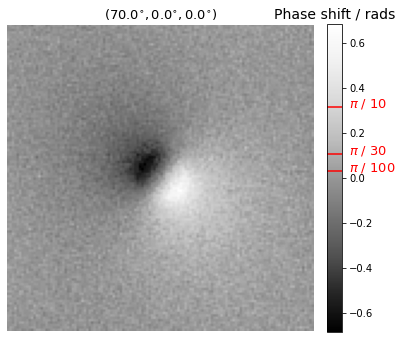

In [32]:
# Plot real to check
# ma.plot_phases_interactive(phis_h,angles_h)
# ma.plot_phases_interactive(phis_b,angles_b)
ma.plot_phases_interactive(phis_s,angles_s)

In [3]:
# Plot ideal to check
ma.plot_phases_interactive(phis_hi,angles_hi)
ma.plot_phases_interactive(phis_bi,angles_bi)
ma.plot_phases_interactive(phis_si,angles_si)

NameError: name 'phis_hi' is not defined

# Plot phantoms

In [6]:
# Load/define hopfion parameters
MX,MY,MZ,mesh_params = MX_h,MY_h,MZ_h,mesh_params_h
n_pad=44
fxc,fyc,fringe,rc,n,v,c = 548, 482, 10, 50, .1, .4, 2000

# Create phase images
a,_,p,_ = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= 2,a_range=0,n_pad=44)
pn = ma.noisy_phase(p,holo=True,MX=MX,MY=MY,MZ=MZ,angles=a,mesh_params=mesh_params,n_pad=44,fxc=fxc,fyc=fyc,fringe=fringe,rc=rc,n=n,v=v,c=c)

# Create holograms
aa=a[0]
phase_m = copy.deepcopy(p[:,0,:])
phase_tot = zoom(phase_m,(10,10))
MXr,MYr,MZr=ma.rotate_magnetisation(MX,MY,MZ,aa[0],aa[1],aa[2])
mag =(MXr**2+MYr**2+MZr**2)**.5 # magnitude of magnetisation
mag = mag/np.max(mag) # rescale so 1 is max
thickness = ma.project_along_z(mag,mesh_params=mesh_params) # project
thickness = np.pad(thickness,[(n_pad,n_pad),(n_pad,n_pad)],mode='edge')
amp = 1-thickness/np.max(thickness)/2
amp = zoom(amp,(10,10))
holo = hologram_frame(amp, phase_tot,sampling=fringe,visibility=v,poisson_noise=n,counts=c)
ref = hologram_frame(np.ones_like(phase_tot), np.zeros_like(phase_tot),sampling=fringe,visibility=v,poisson_noise=n)

SNR:  3.285346


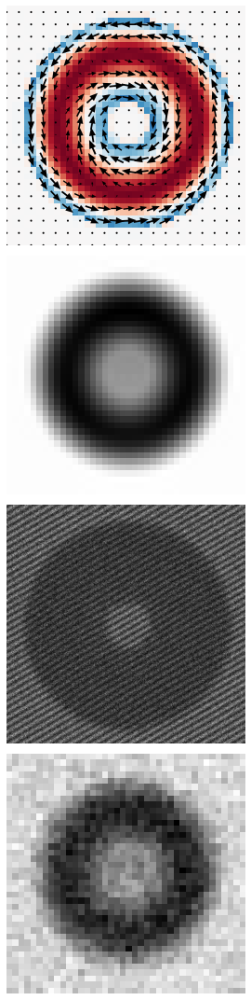

In [9]:
# Plot 
i = 19
n=44
f,axs = plt.subplots(nrows=4,figsize=(4,15))

plot_2d_mag(MX[:,:,i],MY[:,::1,i],MZ[:,:,i],s=2,ax=axs[0])
axs[1].imshow(p[n:-n,0,n:-n],cmap='gray')
n=44*10
axs[2].imshow(holo[n:-n,n:-n],cmap='gray')
n=44
axs[3].imshow(pn[n:-n,0,n:-n],cmap='gray')

for ax in axs:
    ax.axis('off')
f = plt.gcf()
f.patch.set_facecolor('white')
plt.tight_layout()

noise = pn-p
SNR = np.var(p)/np.var(noise)
print('SNR: ',SNR)

In [77]:
MX,MY,MZ,mesh_params = MX_h,MY_h,MZ_h,mesh_params_h
n_pad=44
fxc,fyc,fringe,rc,n,v,c = 548, 482, 10, 50, .1, .4, 2000
# Create phase images
a,_,p,_ = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= 10,a_range=70,n_pad=44)
pn = ma.noisy_phase(p,holo=True,MX=MX,MY=MY,MZ=MZ,angles=a,mesh_params=mesh_params,n_pad=44,fxc=fxc,fyc=fyc,fringe=fringe,rc=rc,n=n,v=v,c=c)

noise = pn-p
SNR = np.var(p)/np.var(noise)
print('SNR: ',SNR)

SNR:  2.106219


In [10]:
# Load/define stripe parameters
MX,MY,MZ,mesh_params = MX_b,MY_b,MZ_b,mesh_params_b
n_pad=44
fxc,fyc,fringe,rc,n,v,c = 576, 529, 10, 30, .02, .9, 2000
# Create phase images
a,_,p,_ = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= 2,a_range=0,n_pad=44)
pn = ma.noisy_phase(p,holo=True,MX=MX,MY=MY,MZ=MZ,angles=a,mesh_params=mesh_params,n_pad=44,fxc=fxc,fyc=fyc,fringe=fringe,rc=rc,n=n,v=v,c=c)

# Create holograms
aa=a[0]
phase_m = copy.deepcopy(p[:,0,:])
phase_tot = zoom(phase_m,(10,10))
MXr,MYr,MZr=ma.rotate_magnetisation(MX,MY,MZ,aa[0],aa[1],aa[2])
mag =(MXr**2+MYr**2+MZr**2)**.5 # magnitude of magnetisation
mag = mag/np.max(mag) # rescale so 1 is max
thickness = ma.project_along_z(mag,mesh_params=mesh_params) # project
thickness = np.pad(thickness,[(n_pad,n_pad),(n_pad,n_pad)],mode='edge')
amp = 1-thickness/np.max(thickness)/2
amp = zoom(amp,(10,10))
holo = hologram_frame(amp, phase_tot,sampling=fringe,visibility=v,poisson_noise=n,counts=c)
ref = hologram_frame(np.ones_like(phase_tot), np.zeros_like(phase_tot),sampling=fringe,visibility=v,poisson_noise=n)

SNR:  3.711992


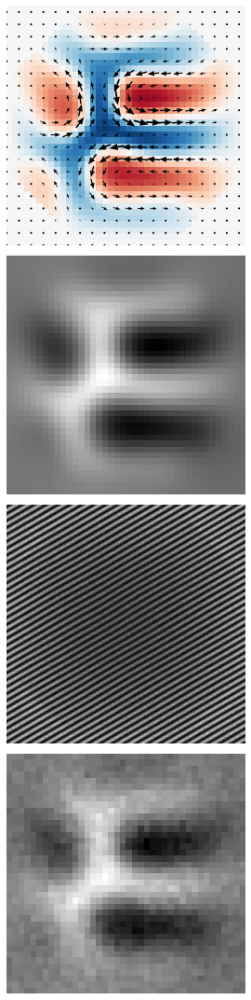

In [11]:
# Plot 
i = 20
n=44
f,axs = plt.subplots(nrows=4,figsize=(4,15))

plot_2d_mag(MX[:,:,i],MY[:,::1,i],MZ[:,:,i],s=2,ax=axs[0])
axs[1].imshow(p[n:-n,0,n:-n],cmap='gray')
n=44*10
axs[2].imshow(holo[n:-n,n:-n],cmap='gray')
n=44
axs[3].imshow(pn[n:-n,0,n:-n],cmap='gray')

for ax in axs:
    ax.axis('off')
f = plt.gcf()
f.patch.set_facecolor('white')
plt.tight_layout()

noise = pn-p
SNR = np.var(p)/np.var(noise)
print('SNR: ',SNR)

In [88]:
MX,MY,MZ,mesh_params = MX_b,MY_b,MZ_b,mesh_params_b
n_pad=44
fxc,fyc,fringe,rc,n,v,c = 576, 529, 10, 30, .03, .95, 2000
# Create phase images
a,_,p,_ = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= 10,a_range=70,n_pad=44)
pn = ma.noisy_phase(p,holo=True,MX=MX,MY=MY,MZ=MZ,angles=a,mesh_params=mesh_params,n_pad=44,fxc=fxc,fyc=fyc,fringe=fringe,rc=rc,n=n,v=v,c=c)

noise = pn-p
SNR = np.var(p)/np.var(noise)
print('SNR: ',SNR)

SNR:  5.1148973


In [12]:
# Load/define sphere parameters
MX,MY,MZ,mesh_params = MX_s,MY_s,MZ_s,mesh_params_s
n_pad=44
fxc,fyc,fringe,rc,n,v,c = 576, 529, 10, 30, .02, .7, 2000

# Create phase images
a,_,p,_ = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= 2,a_range=0,n_pad=44)
pn = ma.noisy_phase(p,holo=True,MX=MX,MY=MY,MZ=MZ,angles=a,mesh_params=mesh_params,n_pad=44,fxc=fxc,fyc=fyc,fringe=fringe,rc=rc,n=n,v=v,c=c)

# Create holograms
aa=a[0]
phase_m = copy.deepcopy(p[:,0,:])
phase_tot = zoom(phase_m,(10,10))
MXr,MYr,MZr=ma.rotate_magnetisation(MX,MY,MZ,aa[0],aa[1],aa[2])
mag =(MXr**2+MYr**2+MZr**2)**.5 # magnitude of magnetisation
mag = mag/np.max(mag) # rescale so 1 is max
thickness = ma.project_along_z(mag,mesh_params=mesh_params) # project
thickness = np.pad(thickness,[(n_pad,n_pad),(n_pad,n_pad)],mode='edge')
amp = 1-thickness/np.max(thickness)/2
amp = zoom(amp,(10,10))
holo = hologram_frame(amp, phase_tot,sampling=fringe,visibility=v,poisson_noise=n,counts=c)
ref = hologram_frame(np.ones_like(phase_tot), np.zeros_like(phase_tot),sampling=fringe,visibility=v,poisson_noise=n)

SNR:  3.6830978


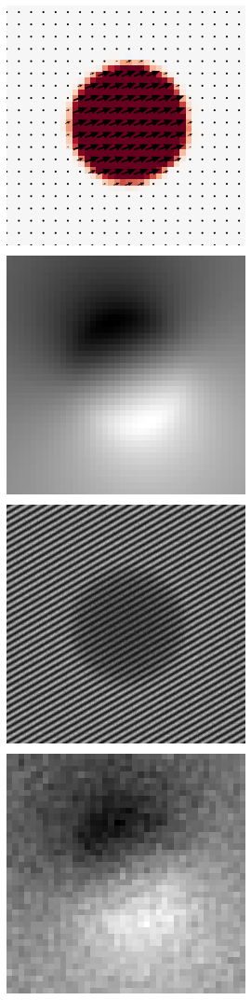

In [13]:
# Plot 
i = 20
n=44
f,axs = plt.subplots(nrows=4,figsize=(4,15))

plot_2d_mag(MX[:,:,i],MY[:,::1,i],MZ[:,:,i],s=2,ax=axs[0])
axs[1].imshow(p[n:-n,0,n:-n],cmap='gray')
n=44*10
axs[2].imshow(holo[n:-n,n:-n],cmap='gray')
n=44
axs[3].imshow(pn[n:-n,0,n:-n],cmap='gray')

for ax in axs:
    ax.axis('off')
f = plt.gcf()
f.patch.set_facecolor('white')
plt.tight_layout()

noise = pn-p
SNR = np.var(p)/np.var(noise)
print('SNR: ', SNR)

In [76]:
MX,MY,MZ,mesh_params = MX_s,MY_s,MZ_s,mesh_params_s
n_pad=44
fxc,fyc,fringe,rc,n,v,c = 576, 529, 10, 30, .02, .7, 2000
# Create phase images
a,_,p,_ = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= 10,a_range=70,n_pad=44)
pn = ma.noisy_phase(p,holo=True,MX=MX,MY=MY,MZ=MZ,angles=a,mesh_params=mesh_params,n_pad=44,fxc=fxc,fyc=fyc,fringe=fringe,rc=rc,n=n,v=v,c=c)

noise = pn-p
SNR = np.var(p)/np.var(noise)
print('SNR: ',SNR)

SNR:  5.704518


# Test area

In [216]:
def test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,weight,th1,th2):
    # Multi axis
    t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=weight)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

    # Dual axis
    cut=int(np.shape(phis)[1]/2)
    px = phis[:,:cut]
    py = phis[:,cut:]
    angx=angles[:cut]
    angy=angles[cut:]
    bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
    b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
    b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
    
    return b1m,b2m,b3m, b1d,b2d,b3d

def plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44): 
    # Plot orthoslices of B with COD values
    i = 20
    blim,bmax,bmin = find_lim(BX,BY,BZ)

    ma.plot_component_orthoslices(BX,BY,BZ,npad=n,i=i,vmax=bmax,vmin=bmin)
    plt.title('Phantom B \n COD X, Y, Z (Mean)    ',fontsize=20)

    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
    ma.plot_component_orthoslices(b1m,b2m,b3m,npad=n,i=i,vmax=blim,vmin=-blim)
    plt.title('Unmixing algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
    ma.plot_component_orthoslices(b1d,b2d,b3d,npad=n,i=i,vmax=blim,vmin=-blim)
    plt.title('Conventional algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

In [217]:
phis = phis_h
angles=angles_h
mesh_params = mesh_params_h

n_pad=44
nmaj=3
nmin=15
weight=2e-3
th1,th2=.2,.8
BX,BY,BZ=BX_h,BY_h,BZ_h

b1m,b2m,b3m, b1d,b2d,b3d = test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,weight,th1,th2)
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44)

..\multi_axis.py:2576: RuntimeWarning: divide by zero encountered in true_divide
  new_x = weight_phases(new_x,1/ws[:,0])
..\multi_axis.py:2579: RuntimeWarning: divide by zero encountered in true_divide
  new_y = weight_phases(new_y,1/ws[:,1])


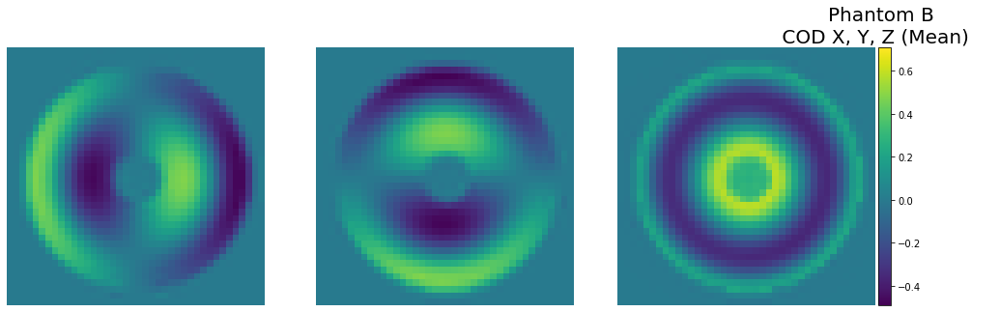

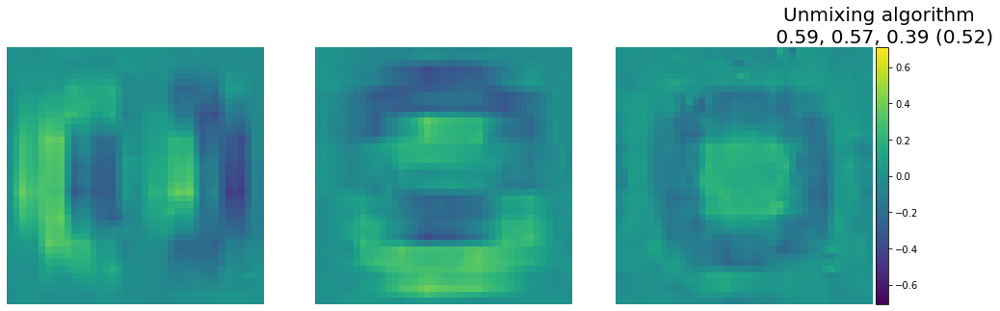

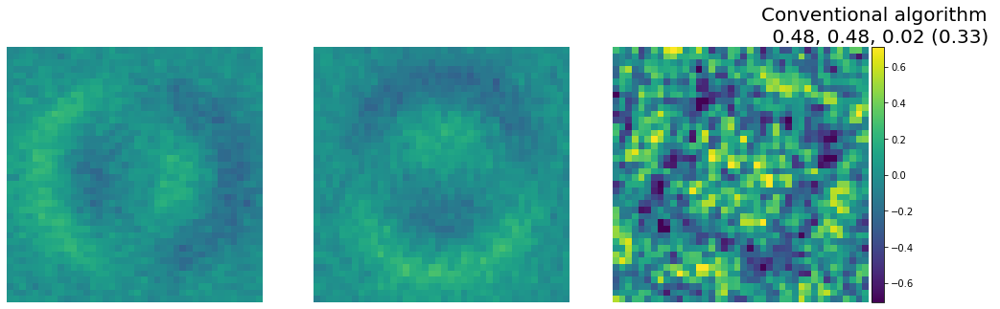

In [218]:
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44)

In [10]:
phis = phis_b
angles=angles_b
mesh_params = mesh_params_b

n_pad=44
nmaj=3
nmin=5
weight=.9e-2
th1,th2=.01,.8
BX,BY,BZ=BX_b,BY_b,BZ_b

b1m,b2m,b3m, b1d,b2d,b3d = test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,weight,th1,th2)


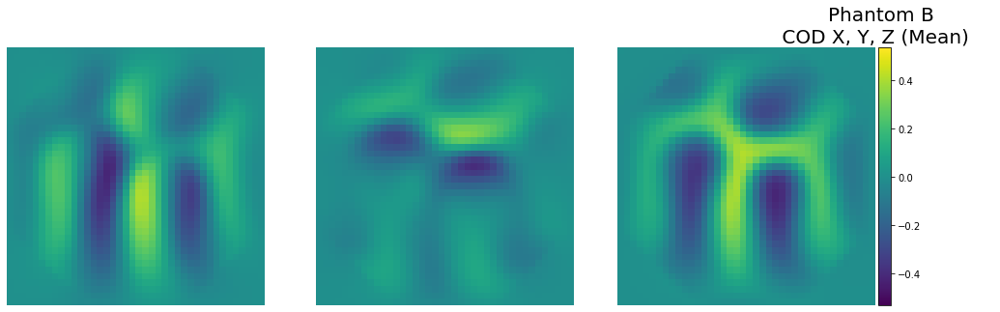

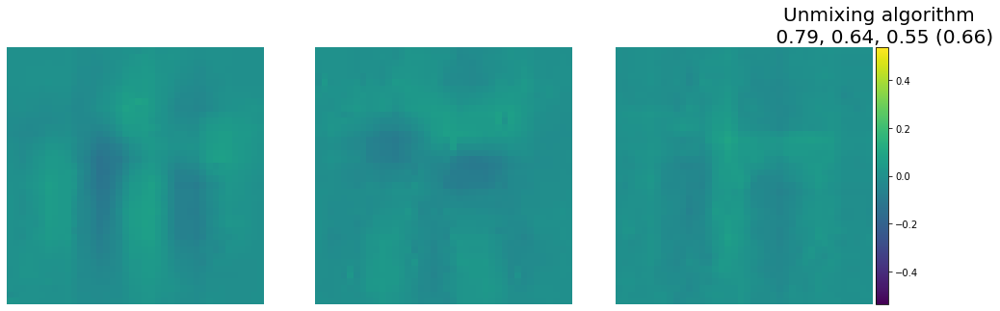

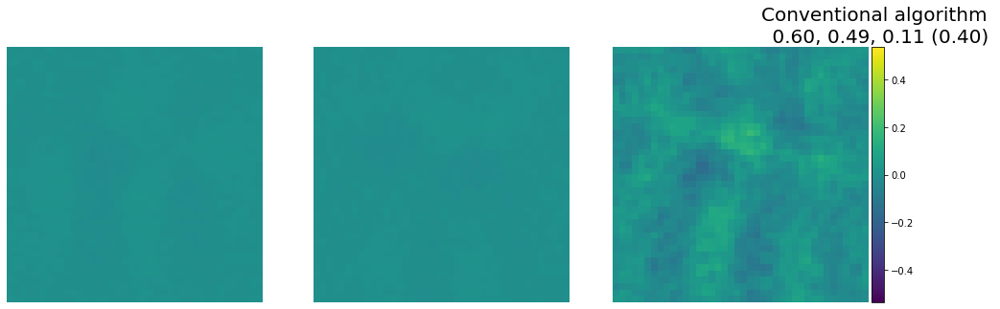

In [11]:
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44)

In [32]:
phis = phis_s
angles=angles_s
mesh_params = mesh_params_s

n_pad=44
nmaj=3
nmin=10
weight=3e-3
th1,th2=.2,.8
BX,BY,BZ=BX_s,BY_s,BZ_s

b1m,b2m,b3m, b1d,b2d,b3d = test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,weight,th1,th2)


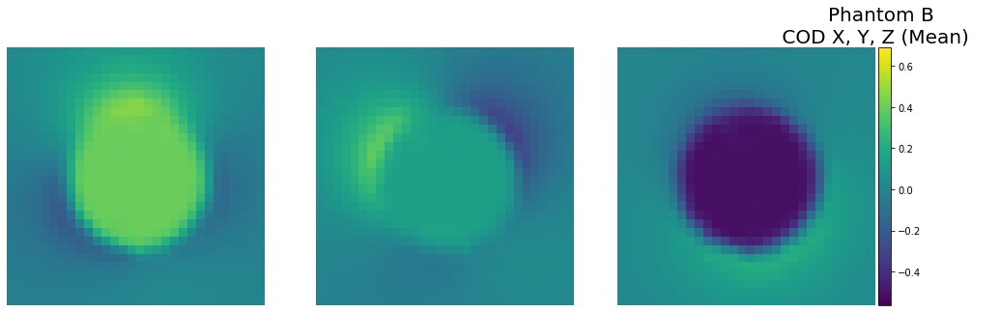

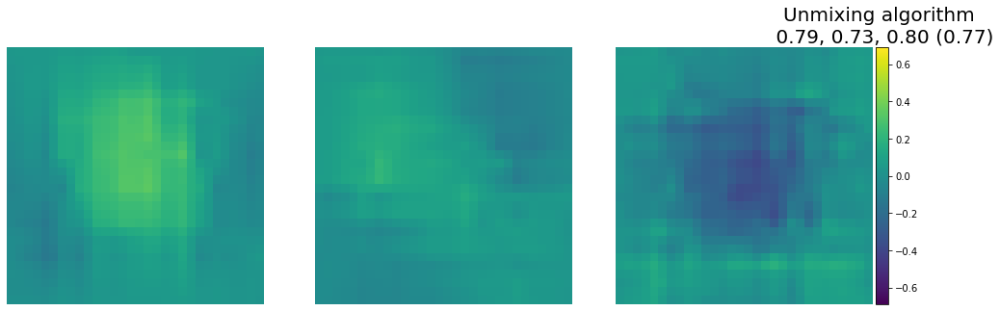

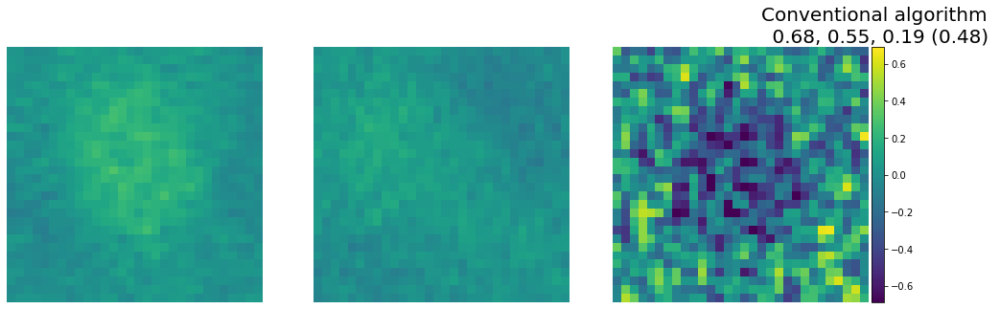

In [33]:
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=49)

# Iterations

In [ ]:
def test_iter(name,data,th1,th2,w,nmajs=[1,2,3,4,5,6,7,8,9,10],niters = [3,6,9,12,15,20,25,30,40,50,60,70],n=44):
    phis,angles,BX,BY,BZ,mesh_params = data
    n_pad=44
    res_m = []
    res_m2 = []
    all_m = []
    all_m2 = []
    all_m3 = []
    nmajs=[1,2,3,4,5,6,7,8,9,10]
    niters = [3,6,9,12,15,20,25,30,40,50,60,70]
    for nmaj in nmajs:
        res_m = []
        res_m2 = []
        res_m3 = []
        for ni in niters:
            t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=ni, 
                                           thresh_range=(th1,th2),algorithm='wavelet_sym2',weight=w)
            b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

            codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
            cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
            codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
            res_m.append([codx,cody,codz])

            ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                                     b1m[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])

            res_m2.append(ang_diff)
            
            magdif = mag_difference(BX,BY,BZ,b1m,b2m,b3m)

            print([codx,cody,codz])

        all_m.append(res_m)
        all_m2.append(res_m2)
        magdif = mag_difference(BX,BY,BZ,b1m,b2m,b3m)
        
        
        np.save('Data/iterations_'+name+'_cod_multi.npy',all_m)
        np.save('Data/iterations_'+name+'_ang_multi.npy',all_m2)
        
    res_d = []
    res_d2 = []
    
    cut=int(np.shape(phis)[1]/2)
    px = phis[:,:cut]
    py = phis[:,cut:]
    angx=angles[:cut]
    angy=angles[cut:]
    bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
    
    for ni in niters:
        b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=ni,algorithm='SIRT3D_CUDA',callback_freq=5)
        b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

        codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
        cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
        codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
        res_d.append([codx,cody,codz])

        ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                                 b1d[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])

        res_d2.append(ang_diff)
        print(mag_difference(BX,BY,BZ,b1d,b2d,b3d))
        np.save('Data/iterations_'+name+'_cod_dual.npy',res_d)
        np.save('Data/iterations_'+name+'_ang_dual.npy',res_d2)

In [509]:
# real tests
# data = phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h
# th1,th2,w = .2,.8,5e-3
# test_iter('hop_real',data,th1,th2,w)

# data = phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s
# th1,th2,w = .2,.8,3e-3
# test_iter('sph_real',data,th1,th2,w)

data = phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b
th1,th2,w = .01,.85,.9e-2
test_iter('bub_real',data,th1,th2,w)

# ideal tests
# data = phis_hi, angles_hi, BX_hi,BY_hi,BZ_hi, mesh_params_hi
# th1,th2,w = .05,.85,0
# test_iter('hop_ideal',data,th1,th2,w,n=48)

# data = phis_si, angles_si, BX_si,BY_si,BZ_si, mesh_params_si
# th1,th2,w = .05,.85,0
# test_iter('sph_ideal',data,th1,th2,w,n=50)

# data = phis_bi, angles_bi, BX_bi,BY_bi,BZ_bi, mesh_params_bi
# th1,th2,w = .05,.85,0
# test_iter('bub_ideal',data,th1,th2,w,n=52)

[0.7610362886795343, 0.5898348135261244, 0.46498057119567093]
[0.774082374342143, 0.5756005667877275, 0.45305951059137684]
[0.7638093430508128, 0.544520276236117, 0.43880409239187657]
[0.7474162898397516, 0.5108831435166081, 0.42503282043512414]
[0.7310601967994934, 0.4796402028941351, 0.4129518427214549]
[0.7052391126622446, 0.43490220323896267, 0.3948767066725658]
[0.6835531791900884, 0.39843069089351957, 0.3780043696383615]
[0.6644712111424589, 0.3692285767209711, 0.3619546791769359]
[0.6324759344193467, 0.32431826676565834, 0.33428668483844604]
[0.6094735481715965, 0.292485630457179, 0.30967833839924097]
[0.5926070094719762, 0.26898130985733815, 0.2885974526467159]
[0.5783766803678105, 0.24942984938778423, 0.27014303555019126]
[0.7945278293055367, 0.6371127911936583, 0.5641855091997883]
[0.7890250058633832, 0.6366220913123612, 0.5502383390881391]
[0.7809011680096809, 0.6296876650907315, 0.5365219579215506]
[0.7706323362415937, 0.6202231300026284, 0.5212834016477395]
[0.759699499530

In [34]:
res_d = np.load('Data/iterations_sph_real_cod_dual.npy')
all_m = np.load('Data/iterations_sph_real_cod_multi.npy')

# res_d = np.load('Data/iterations_hop_real_cod_dual.npy')
# all_m = np.load('Data/iterations_hop_real_cod_multi.npy')

# res_d = np.load('Data/iterations_bub_real_cod_dual.npy')
# all_m = np.load('Data/iterations_bub_real_cod_multi.npy')

niters = [3,6,9,12,15,20,25,30,40,50,60,70]
nmajs=[1,2,3,4,5,6,7,8,9,10]

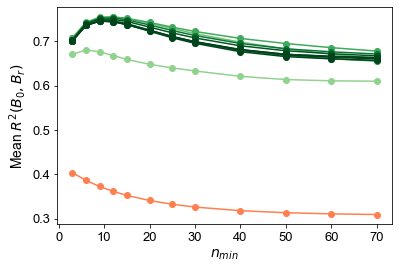

In [35]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)
    

# create figure and axis objects with subplots()
fig,ax = plt.subplots()
# twin object for two different y-axis on the sample plot
#ax2=ax.twinx()

# make a plot
ax.plot(niters,np.mean(res_d,axis=1),'o-',color='coral')
#ax2.plot(niters,res_d2,'o--',color='coral',markerfacecolor='w')

#cmap = matplotlib.cm.get_cmap('BuGn')
cmap = mpl.cm.Greens(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[8:,:-1])

for i in range(len(nmajs)):
    col = cmap(i/6)
    ax.plot(niters,np.mean(all_m[i],axis=1),'o-',color=col)
    # set x-axis label
    ax.set_xlabel("$n_{min}$",fontsize=14)
    # set y-axis label
    ax.set_ylabel("Mean $R^2(B_{0},B_{r})$",fontsize=14)

    # make a plot with different y-axis using second axis object
    #ax2.plot(niters,all_m2[i],'o--',color=col,markerfacecolor='w')
    
    #ax2.set_ylabel("Mean $\cos\\theta$ ",fontsize=14)


plt.show()

In [36]:
res_d = np.load('Data/iterations_sph_ideal_cod_dual.npy')
all_m = np.load('Data/iterations_sph_ideal_cod_multi.npy')

# res_d = np.load('Data/iterations_bub_ideal_cod_dual.npy')
# all_m = np.load('Data/iterations_bub_ideal_cod_multi.npy')

# res_d = np.load('Data/iterations_hop_ideal_cod_dual.npy')
# all_m = np.load('Data/iterations_hop_ideal_cod_multi.npy')

niters = [3,6,9,12,15,20,25,30,40,50,60,70]

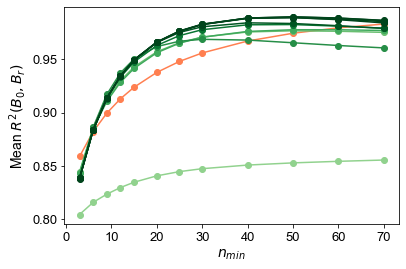

In [37]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)
    

# create figure and axis objects with subplots()
fig,ax = plt.subplots()
# twin object for two different y-axis on the sample plot
#ax2=ax.twinx()

# make a plot
ax.plot(niters,np.mean(res_d,axis=1),'o-',color='coral')
#ax2.plot(niters,res_d2,'o--',color='coral',markerfacecolor='w')

#cmap = matplotlib.cm.get_cmap('BuGn')
cmap = mpl.cm.Greens(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[8:,:-1])

for i in range(len(nmajs)):
    col = cmap(i/6)
    ax.plot(niters,np.mean(all_m[i],axis=1),'o-',color=col)
    # set x-axis label
    ax.set_xlabel("$n_{min}$",fontsize=14)
    # set y-axis label
    ax.set_ylabel("Mean $R^2(B_{0},B_{r})$",fontsize=14)

    # make a plot with different y-axis using second axis object
    #ax2.plot(niters,all_m2[i],'o--',color=col,markerfacecolor='w')
    
    #ax2.set_ylabel("Mean $\cos\\theta$ ",fontsize=14)


plt.show()

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\ipykernel_launcher.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  if sys.path[0] == '':


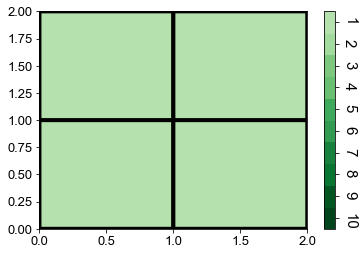

In [146]:
# Generate colorbar
cmap = mpl.cm.Greens_r(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[0:-5,:-1])
cols=[]
for i in range(len(nmajs)):
    col = cmap(i/10)
    cols.append(col)

cmap2=mpl.colors.ListedColormap(cols)
c = plt.pcolor([(1,2),(1,2)], edgecolors='k', linewidths=4, cmap=cmap2, vmin=0.0, vmax=1.0)
cbar = plt.colorbar(c)
cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), rotation=-90,fontsize=15)
cbar.set_ticks(np.arange(0,1,1/10)+0.05)
cbar.set_ticklabels([10,9,8,7,6,5,4,3,2,1])

plt.show()

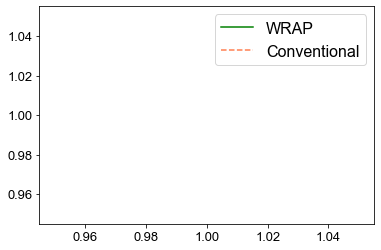

In [149]:
plt.plot(1,1,'g-',label='WRAP',color='g')
plt.plot(1,1,'--',label='Conventional',color='coral')
plt.legend(fontsize=16,fancybox=True)

In [41]:
res_ds = np.load('Data/iterations_sph_real_cod_dual.npy')
all_ms = np.load('Data/iterations_sph_real_cod_multi.npy')

res_dh = np.load('Data/iterations_hop_real_cod_dual.npy')
all_mh = np.load('Data/iterations_hop_real_cod_multi.npy')

res_db = np.load('Data/iterations_bub_real_cod_dual.npy')
all_mb = np.load('Data/iterations_bub_real_cod_multi.npy')

res_dsi = np.load('Data/iterations_sph_ideal_cod_dual.npy')
all_msi = np.load('Data/iterations_sph_ideal_cod_multi.npy')

res_dbi = np.load('Data/iterations_bub_ideal_cod_dual.npy')
all_mbi = np.load('Data/iterations_bub_ideal_cod_multi.npy')

res_dhi = np.load('Data/iterations_hop_ideal_cod_dual.npy')
all_mhi = np.load('Data/iterations_hop_ideal_cod_multi.npy')

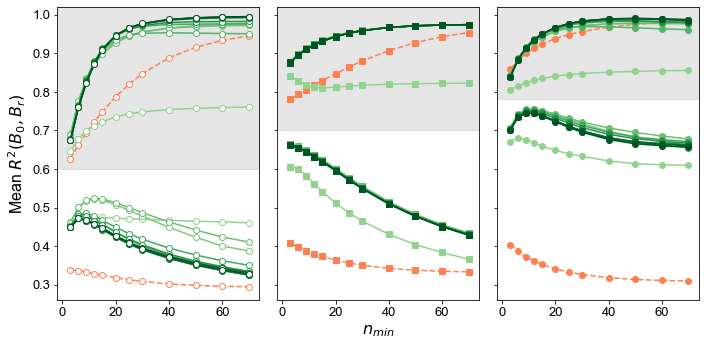

In [104]:
import matplotlib.font_manager
import matplotlib as mpl

# create figure and axis objects with subplots()
font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)
cmap = mpl.cm.Greens(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[8:,:-1])
fig,axs = plt.subplots(nrows=1,ncols=3,figsize=(10,5))


##### Hopfion ideal
axs[0].plot(niters,np.mean(res_dhi,axis=1),'o--',color='coral',markerfacecolor='w')

for i in range(len(nmajs)):
    col = cmap(i/10)
    axs[0].plot(niters,np.mean(all_mhi[i],axis=1),'o-',color=col,markerfacecolor='w')
#    axs[0].set_xlabel("$n_{min}$",fontsize=14)
#    axs[0].set_ylabel("Mean $R^2(B_{0},B_{r})$",fontsize=14)
    
# hopfion real
axs[0].plot(niters,np.mean(res_dh,axis=1),'o--',color='coral',markerfacecolor='w')

for i in range(len(nmajs)):
    col = cmap(i/10)
    axs[0].plot(niters,np.mean(all_mh[i],axis=1),'o-',color=col,markerfacecolor='w')
#    axs[0].set_xlabel("$n_{min}$",fontsize=14)
    axs[0].set_ylabel("Mean $R^2(B_{0},B_{r})$",fontsize=16)

axs[0].fill_between([-3,75],[.6,.6],[1.1,1.1],color='grey',alpha=.2)

##### bub ideal
axs[1].plot(niters,np.mean(res_dbi,axis=1),'s--',color='coral')

for i in range(len(nmajs)):
    col = cmap(i/10)
    axs[1].plot(niters,np.mean(all_mbi[i],axis=1),'s-',color=col)
#    axs[1].set_xlabel("$n_{min}$",fontsize=14)
    
# bub real
axs[1].plot(niters,np.mean(res_db,axis=1),'s--',color='coral')

for i in range(len(nmajs)):
    col = cmap(i/10)
    axs[1].plot(niters,np.mean(all_mb[i],axis=1),'s-',color=col)
    axs[1].set_xlabel("$n_{min}$",fontsize=16)

axs[1].fill_between([-3,75],[.7,.7],[1.1,1.1],color='grey',alpha=.2)

##### sph ideal
axs[2].plot(niters,np.mean(res_dsi,axis=1),'o--',color='coral')

for i in range(len(nmajs)):
    col = cmap(i/10)
    axs[2].plot(niters,np.mean(all_msi[i],axis=1),'o-',color=col)
#    axs[2].set_xlabel("$n_{min}$",fontsize=14)
    
# sph real
axs[2].plot(niters,np.mean(res_ds,axis=1),'o--',color='coral')

for i in range(len(nmajs)):
    col = cmap(i/10)
    axs[2].plot(niters,np.mean(all_ms[i],axis=1),'o-',color=col)
#    axs[2].set_xlabel("$n_{min}$",fontsize=14)

axs[2].fill_between([-3,75],[.78,.78],[1.1,1.1],color='grey',alpha=.2)
    
    
# Final formatting
for ax in axs:
    ax.set_ylim([.26,1.02])
    ax.set_xlim([-2,74])
    
for ax in axs[1:]:
    ax.set_yticklabels([])


plt.tight_layout()
plt.show()

# Thresholding

In [200]:
def test_threshold(name,data, nmin,weight):
    phis,angles,BX,BY,BZ,mesh_params = data
    n_pad=44
    n=44
    nmaj=3

    # Dual axis
    px = phis[:,:10]
    py = phis[:,10:]
    angx=angles[:10]
    angy=angles[10:]
    bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
    b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
    b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])

    cod = np.mean([codx,cody,codz])
    np.save('Data/thresh_'+name+'_dual.npy',cod)

    res = []
    ts = [0.01,.1,.2,.3,.4,.5,.6,.7,.8]
    for t in ts:
        # Multi axis
        t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                               thresh_range=(t,.8),algorithm='wavelet_sym2',weight=weight)
        b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

        n=n_pad
        codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
        cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
        codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])

        cod = np.mean([codx,cody,codz])
        res.append(cod)

    np.save('Data/thresh_'+name+'_multi.npy',res)

In [510]:
# real tests
# data = phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h
# nmin,w = 28,5e-3
# test_threshold('h',data,nmin,w)

# data = phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s
# nmin,w = 18,3e-3
# test_threshold('s',data,nmin,w)

data = phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b
nmin,w = 20,.9e-2
test_threshold('b',data,nmin,w)

In [38]:
ts = [0.01,.1,.2,.3,.4,.5,.6,.7,.8]

res_s = np.load(r'Data/thresh_s_multi.npy')
res_h = np.load(r'Data/thresh_h_multi.npy')
res_b = np.load(r'Data/thresh_b_multi.npy')
d_s = np.load(r'Data/thresh_s_dual.npy')
d_h=np.load(r'Data/thresh_h_dual.npy')
d_b = np.load(r'Data/thresh_b_dual.npy')

In [39]:
s_norm = res_s-d_s
h_norm = res_h-d_h
b_norm = res_b-d_b

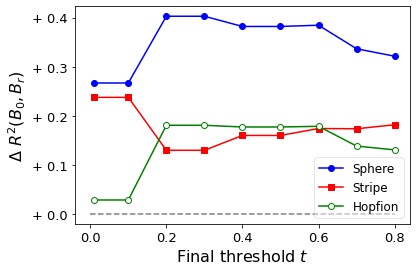

In [151]:
import matplotlib
# font = {'sans-serif' :'Ariel',
#         'size'   : 14}
# matplotlib.rc('font', **font)

import matplotlib
matplotlib.rcParams['font.family'] = "sans-serif"
matplotlib.rcParams['font.sans-serif'] = "Ariel"

plt.plot(ts,s_norm,'-o',color='b')
plt.plot(ts,b_norm,'-s',color='r')
plt.plot(ts,h_norm,'-o',c='g',markerfacecolor='w')




# res_m = np.mean([b_norm,h_norm,s_norm],axis=0)
# plt.plot(ts, res_m,'-',color=r'forestgreen',lw=2.5)

# e = np.std([b_norm,h_norm,s_norm],axis=0)
# plt.fill_between(ts,res_m-e,res_m+e,color=r'forestgreen',alpha=.2)

# d_m = np.mean([d_b,d_s,d_h])
# e = np.std([d_b,d_s,d_h])
# plt.plot((0.01,.9),(d_b,d_b),'--',color='orange')
# plt.fill_between((0.01,.9),(d_b-e,d_b-e),(d_b+e,d_b+e),color='orange',alpha=.2)

plt.xlabel('Final threshold $t$',fontsize=16)
plt.ylabel('$\Delta$ $R^2(B_{0},B_{r}$)',fontsize=16)

plt.plot((0,.8),(0,0),'--',color='grey')

labels = ['+ 0.0', '+ 0.1','+ 0.2','+ 0.3','+ 0.4']
y = [0,.1,.2,.3,.4]
plt.yticks(y, labels)

f = plt.gcf()
f.patch.set_facecolor('white')
plt.legend(['Sphere','Stripe','Hopfion'],fontsize=12,loc='lower right',framealpha=.5)

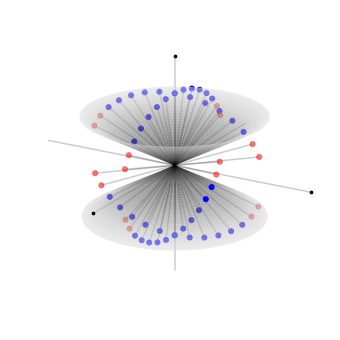

In [166]:
angles = ([0,0,90],[0,90,0],[90,0,0])
ws = ma.calculate_A_contributions(angles)

# plot a collection scheme
%matplotlib inline
fig = plt.figure(figsize=(6,6))
ax1 = fig.gca(projection='3d')

# AXES
bs = []
for i,a in enumerate(angles):
    mrot = ma.rotation_matrix(a[0],a[1],a[2])
    b = np.dot(mrot,[0,0,1.5])
    bs.append(b)
    cmap='winter_r'#'twilight_shifted'#'Wistia'#'autumn_r' #'winter_r'
    marker='o'#'x'#'|'#'_'
    t=0.6
    plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
    ax1.scatter([b[0]],[b[1]],[b[2]],c='k',s=30,alpha=1,marker='.')
    
    
# CONE
h=.7
t=.6
theta = np.arccos(t)*360/(2*np.pi)
x = 1/np.tan(np.deg2rad(theta))
rval=h/x
theta = np.linspace(0, 2*np.pi, 200)
r = np.linspace(0, rval, 200)
t,R =np.meshgrid(theta, r)

X = R*np.cos(t)
Y = R*np.sin(t)
Z = R*x

ax1.plot_surface(X, Y, Z,alpha=0.6, cmap='Greys_r',vmax=.9,zorder=1)
ax1.plot_surface(X, Y, -Z,alpha=.6, cmap='Greys',vmin=-.9,zorder=1)



# POINTS
angles = ma.generate_angles(mode='dual',n_tilt=30,alpha=70,beta=70,tilt2='beta')
ws = ma.calculate_A_contributions(angles)
bs = []
for i,a in enumerate(angles):
    mrot = ma.rotation_matrix(a[0],a[1],a[2])
    b = np.dot(mrot,[0,0,1])
    bs.append(b)
    #cmap='coolwarm'#'twilight_shifted'#'Wistia'#'autumn_r' #'winter_r'
    marker='o'#'x'#'|'#'_'
    t=0.6
    if abs(ws[i,2]) > t: #or abs(ws[i,1]) > t or abs(ws[i,2]) > t:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
        #ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap='twilight_shifted',alpha=1,marker=marker)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],s=25,c='blue',alpha=1,marker=marker,zorder=500)
    else:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
        #ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap='winter_r',alpha=1,marker=marker,vmax=.8)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],s=25,c='red',alpha=.5,marker=marker,zorder=500)




    
    
    
ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax1.set_zticklabels([])
plt.xlabel('x',fontsize='20')
plt.ylabel('y',fontsize='20')
ax1.set_zlabel('z',fontsize='20')
plt.xlim([-1,1])
plt.ylim([-1,1])
ax1.set_zlim([-1,1])
plt.axis('off')

ax1.azim = -60
ax1.dist = 10
ax1.elev = 20


f = plt.gcf()
f.patch.set_facecolor('white')

# Regularisation

In [65]:
def test_reg(name,data, nmin,th1,th2):
    phis,angles,BX,BY,BZ,mesh_params = data
    n_pad=44
    n=44
    nmaj=3

    # Dual axis
    px = phis[:,:10]
    py = phis[:,10:]
    angx=angles[:10]
    angy=angles[10:]
    bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
    b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
    b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])

    cod = np.mean([codx,cody,codz])
    np.save('Data/regco_'+name+'_dual.npy',cod)

    res = []
    weights  = np.logspace(-4,-1,30)
    for w in weights:
        # Multi axis
        t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                               thresh_range=(th1,th2),algorithm='wavelet_coif1',weight=w)
        b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

        n=n_pad
        codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
        cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
        codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])

        cod = np.mean([codx,cody,codz])
        res.append(cod)

    np.save('Data/regco_'+name+'_multi.npy',res)

In [67]:
# real tests
# data = phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h
# nmin = 15
# th1=.2
# test_reg('h',data,nmin,th1,.8)

# data = phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b
# nmin = 5
# th1=0.01
# test_reg('b',data,nmin,th1,.8)

# data = phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s
# nmin = 10
# th1=0.2
# test_reg('s',data,nmin,th1,.8)

In [107]:
res_h = np.load('Data/reg_h_multi.npy')
res_b = np.load('Data/reg_b_multi.npy')
res_s = np.load('Data/reg_s_multi.npy')

res_hd = np.load('Data/reg_h_dual.npy')
res_bd = np.load('Data/reg_b_dual.npy')
res_sd = np.load('Data/reg_s_dual.npy')

dif_h = res_h-res_hd
dif_b = res_b-res_bd
dif_s = res_s-res_sd

In [220]:
res_h = np.load('Data/regco_h_multi.npy')
res_b = np.load('Data/regco_b_multi.npy')
res_s = np.load('Data/regco_s_multi.npy')

res_hd = np.load('Data/regco_h_dual.npy')
res_bd = np.load('Data/regco_b_dual.npy')
res_sd = np.load('Data/regco_s_dual.npy')

dif_h = res_h-res_hd
dif_b = res_b-res_bd
dif_s = res_s-res_sd

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


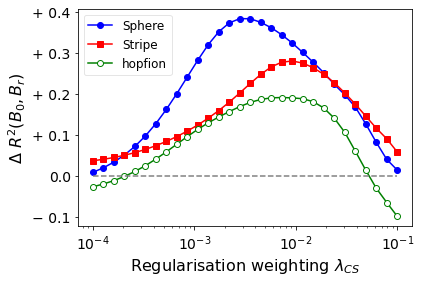

In [234]:
import matplotlib
font = {'sans-serif' :'Ariel',
        'size'   : 14}
matplotlib.rc('font', **font)

x = np.logspace(-4,-1,30)

plt.plot(x,dif_s,'bo-',label='Sphere')
plt.plot(x,dif_b ,'rs-',label='Stripe')
plt.plot(x,dif_h,'go-',markerfacecolor='white',label='hopfion')


ax = plt.gca()
ax.set_xscale('log')


plt.xlabel('Regularisation weighting $\lambda_{CS}$ ',fontsize=16)
plt.ylabel('$\Delta$ $R^2(B_{0},B_{r}$)',fontsize=16)

plt.plot((1e-4,.1),(0,0),'--',color='grey')

labels = ['− 0.1','0.0', '+ 0.1','+ 0.2','+ 0.3','+ 0.4']
y = [-.1,0,.1,.2,.3,.4]
plt.yticks(y, labels)

f = plt.gcf()
f.patch.set_facecolor('white')
plt.legend(fontsize=12,loc='upper left',framealpha=.5)

In [241]:
phis = phis_h
angles=angles_h
mesh_params = mesh_params_h

n_pad=44
nmaj=3
nmin=15
th1,th2=.2,.8
BX,BY,BZ=BX_h,BY_h,BZ_h

#cod .15
_,_,bz1, _,_,_ = test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,.1e-3,th1,th2)

#cod .38
_,_,bz2, _,_,_ = test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,9e-3,th1,th2)

#cod .32
_,_,bz3, _,_,_ = test_run(phis,angles,mesh_params,n_pad,nmaj,nmin,.05,th1,th2)

In [268]:
.1e-3,9e-3,.05

(0.0001, 0.009, 0.05)

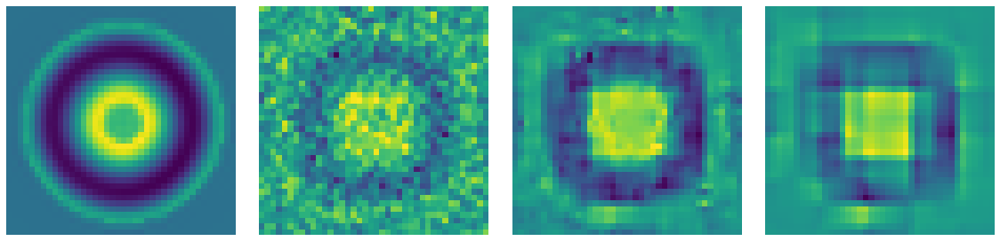

In [272]:
f,axs = plt.subplots(ncols=4,figsize=(16,4))
axs[0].imshow(BZ[n:-n,n:-n,20+n])
axs[1].imshow(bz1[n:-n,n:-n,20+n])
axs[2].imshow(bz2[n:-n,n:-n,20+n])
axs[3].imshow(bz3[n:-n,n:-n,20+n])

for ax in axs:
    ax.axis('off')
    
plt.tight_layout()

In [265]:
np.min(BZ[n:-n,n:-n,20+n]),np.max(BZ[n:-n,n:-n,20+n])

(-0.3592469, 0.5937266)

In [267]:
np.min(bz2[n:-n,n:-n,20+n]),np.max(bz2[n:-n,n:-n,20+n])

(-0.24310866, 0.25666222)

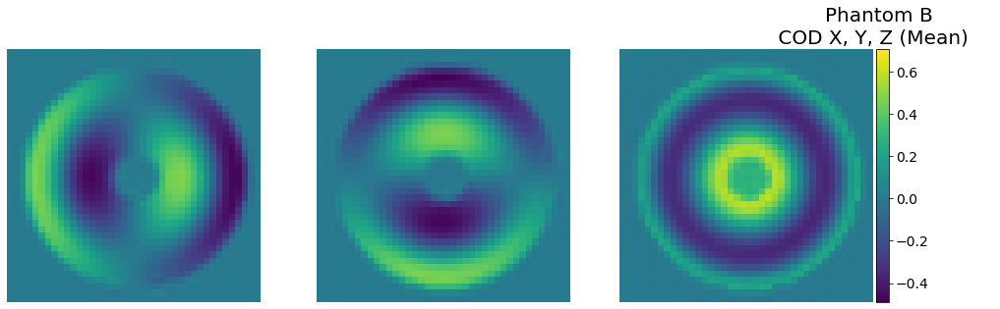

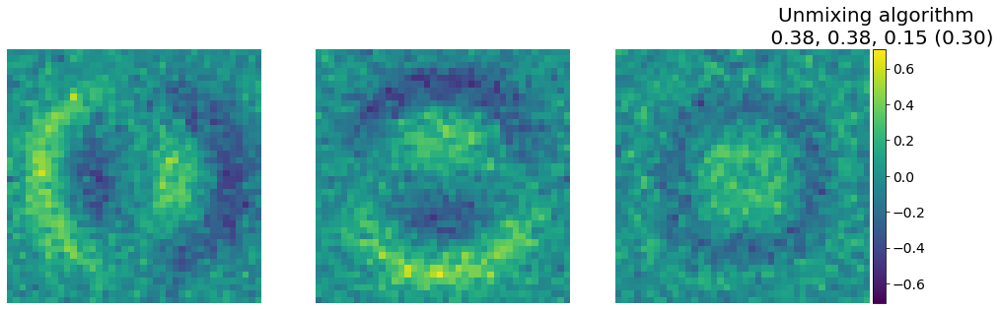

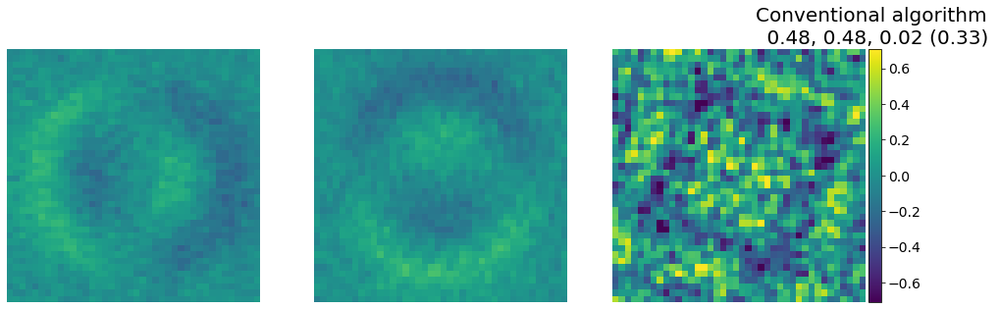

In [238]:
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44) #.1e-3

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


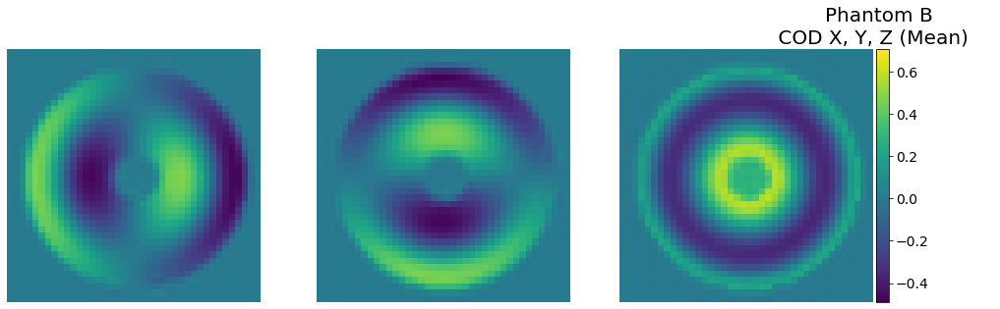

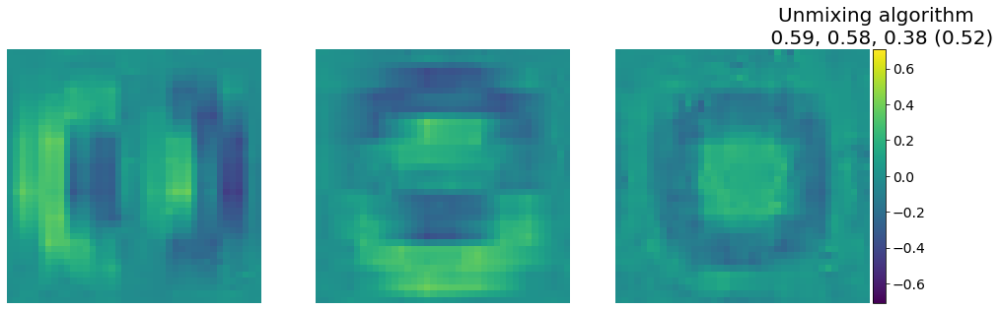

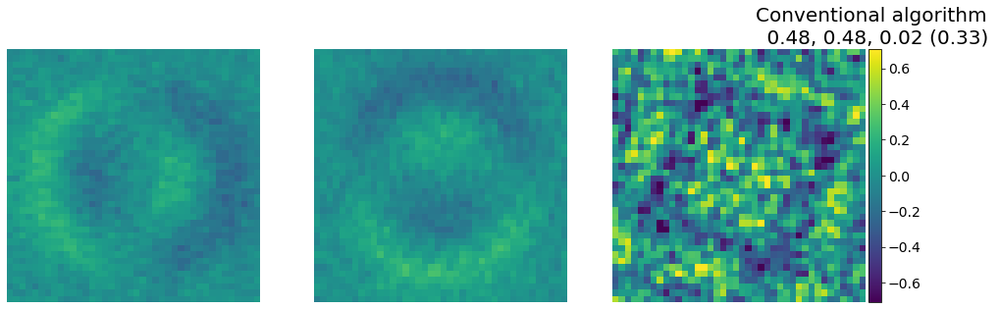

In [236]:
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44) #9e-3

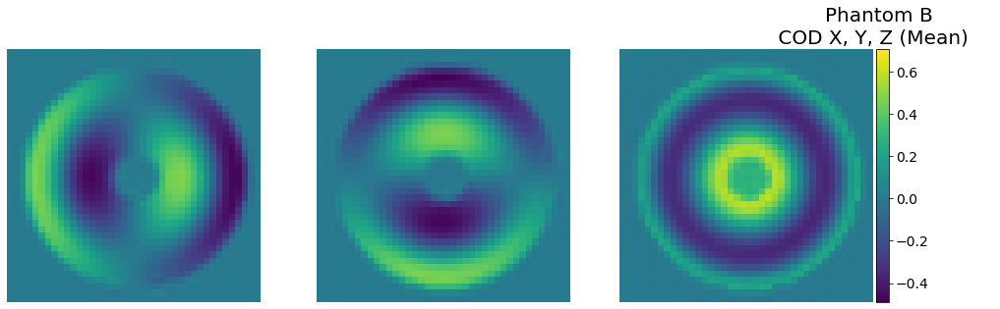

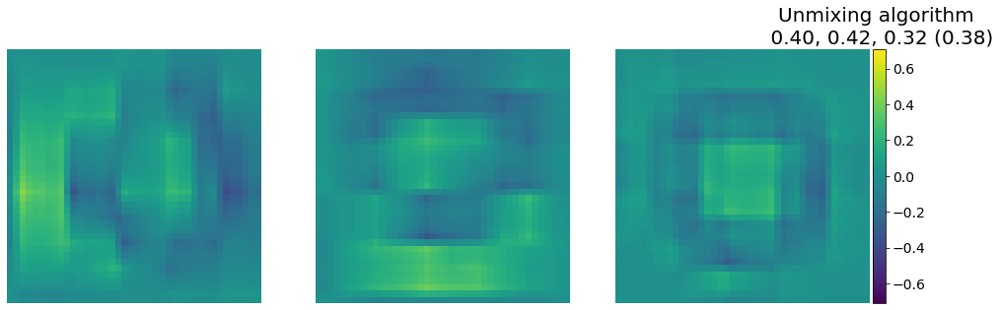

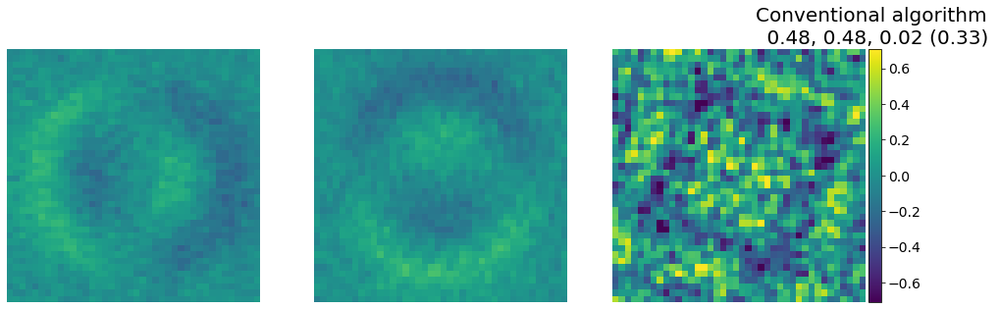

In [240]:
plot_test_run(BX,BY,BZ,b1m,b2m,b3m,b1d,b2d,b3d,i=20,n=44) #.04

# Compression efficiency

In [275]:
def test_comp(As):
    all_diffs = []
    best = ['coif1','haar','sym2','db2','fourier','TV','im']
    n=44
    
    # For each sample...
    for A in As:
        diffs = []
        n=44
        A = np.concatenate([A[0][n:-n,n:-n,n:-n],A[1][n:-n,n:-n,n:-n],A[2][n:-n,n:-n,n:-n]])
        
        # Calculate baseline
        res_plain = np.mean(abs(A.ravel())/np.max(abs(A)))
        
        # And each compression method...
        for w in best:
            if w == 'im':
                mean = res_plain

            elif w == 'fourier':
                f = np.fft.fft2(A)
                mean=np.mean(abs(f).ravel()/np.max(abs(f)))
            elif w == 'TV':
                f = (np.gradient(A)[0]**2+np.gradient(A)[1]**2)**.5
                mean=np.mean(abs(f).ravel()/np.max(abs(f)))

            
            # For all the wavelets...
            else:
                # calculate wavelet transform
                res = pywt.wavedecn(A,w) 
                arr = pywt.coeffs_to_array(res)
                # Find average absolute value, normalised by max
                mean = np.mean(abs(arr[0].ravel())/np.max(abs(arr[0])))
            
            # Define score as log of value as a fraction of
            diff = np.log10(mean/res_plain)
            diffs.append(diff)
        all_diffs.append(diffs)
        
    print(res_plain)
    return all_diffs

In [276]:
As_hop = [AX_h,AY_h,AZ_h]
As_bub = [AX_b,AY_b,AZ_b]
As_sph = [AX_s,AY_s,AZ_s]
As = [As_hop,As_bub,As_sph]

In [277]:
all_diffs = test_comp(As)

0.14304903


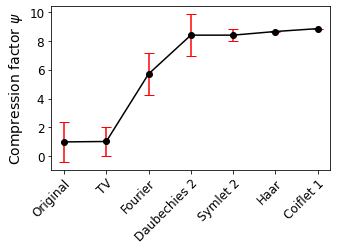

In [773]:
import matplotlib
font = {'sans-serif' :'Ariel',
        'size'   : 12}
matplotlib.rc('font', **font)

plt.figure(figsize=(5,3))

best = ['Coiflet 1','Haar','Symlet 2','Daubechies 2','Fourier','TV','Original'][::-1]
mean_diffs = np.mean(all_diffs,axis=0)
ys =1/np.exp(mean_diffs[::-1])
err = np.std(1/np.exp(all_diffs[::-1]),axis=0)#/np.sqrt(6)
mean_diffs = np.nan_to_num(mean_diffs)
err = np.nan_to_num(err)
plt.errorbar(np.arange(len(ys)),ys,yerr=err,color='k',ecolor='r',fmt='-ko',capsize=5)
plt.ylabel('Compression factor $\psi$',fontsize=14)
#plt.xlabel('Sparsifying transform',fontsize=14)
plt.xticks(ticks=np.arange(len(mean_diffs)),labels=best,rotation=45,fontsize=12,ha='right',rotation_mode='anchor')
plt.show()

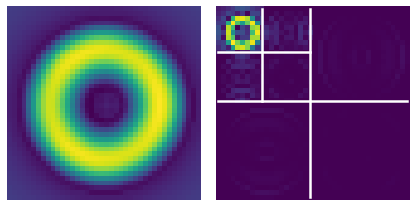

In [732]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis

x = AZ_h[n:-n,n:-n,n+20]
shape = x.shape

fig, axes = plt.subplots(ncols=2)
level=2

# compute the 2D DWT
c = pywt.wavedec2(x, 'coif1', mode='periodization', level=level)

# normalize each coefficient array independently for better visibility
# c[0] /= np.abs(c[0]).max()
# for detail_level in range(level):
#     print(detail_level)
#     c[detail_level + 1] = [d/np.abs(d).max()*.2 for d in c[detail_level + 1]]

    # show the normalized coefficients
arr, slices = pywt.coeffs_to_array(c)

axes[1].imshow(abs(arr), cmap='viridis')
axes[1].set_axis_off()

axes[1].plot([19,19],[0,39],color='w',linewidth=2.5)
axes[1].plot([9,9],[0,19],color='w',linewidth=2.5)
axes[1].plot([0,19],[9,9],color='w',linewidth=2.5)
axes[1].plot([0,39],[19,19],color='w',linewidth=2.5)

axes[0].imshow(AZ_h[n:-n,n:-n,n+20],cmap='viridis')
axes[0].axis('off')

plt.tight_layout()
plt.show()

C:\Users\Sauron\anaconda3\envs\grl31-1\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  # This is added back by InteractiveShellApp.init_path()


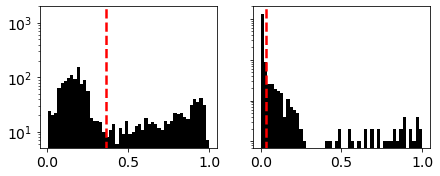

In [750]:
fig, axs = plt.subplots(ncols=2,figsize=(7,2.6))

#axs[0].set_ylabel('Count',fontsize=14)
axs[0].hist(abs(AZ_h[n:-n,n:-n,n+20].ravel())/np.max(AZ_h[n:-n,n:-n,n+20]),bins=50,log=True,color='k')
axs[1].hist(abs(arr.ravel())/np.max(arr),bins=50,log=True,color='k')

a = np.mean(abs(AZ_h[n:-n,n:-n,n+20].ravel())/np.max(AZ_h[n:-n,n:-n,n+20]))
b = np.mean(abs(arr.ravel())/np.max(arr))

for ax in axs:
    ax.set_ylim([0,2000])

    
for ax in axs[1:]:
    ax.set_yticklabels([])
    
axs[0].plot([a,a],[0,2000,],'r--',lw=2.5)
axs[1].plot([b,b],[0,2000,],'r--',lw=2.5)

#plt.tight_layout()
plt.show()

In [751]:
a/b

11.589048

# OLD

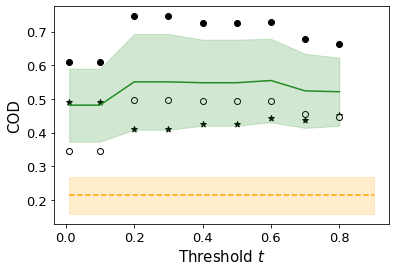

In [332]:
import matplotlib
font = {'sans-serif' :'Ariel',
        'size'   : 13}
matplotlib.rc('font', **font)

plt.scatter(ts,res_b,marker='*',color='k')
plt.scatter(ts,res_h,marker='o',c='white',edgecolor='k')
plt.scatter(ts,res_s,marker='o',color='k')

res_m = np.mean([res_b,res_h,res_s],axis=0)
plt.plot(ts, res_m,'-',color=r'forestgreen')

e = np.std([res_b,res_h,res_s],axis=0)
plt.fill_between(ts,res_m-e,res_m+e,color=r'forestgreen',alpha=.2)

d_m = np.mean([d_b,d_s,d_h])
e = np.std([d_b,d_s,d_h])
plt.plot((0.01,.9),(d_b,d_b),'--',color='orange')
plt.fill_between((0.01,.9),(d_b-e,d_b-e),(d_b+e,d_b+e),color='orange',alpha=.2)

plt.xlabel('Threshold $t$',fontsize=15)
plt.ylabel('COD',fontsize=15)

f = plt.gcf()
f.patch.set_facecolor('white')

### Without noise

In [3]:
# Generate hopfion
MX,MY,MZ = ma.Magnetic_Phantom.hopfion(bbox_length_px=100)
# Crop out the blank space
MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
# Reduce resolution to make the simulation smaller
x=.66
MXn=zoom(MX, (x,x,x))
MYn=zoom(MY, (x,x,x))
MZn=zoom(MZ, (x,x,x))
MX,MY,MZ=MXn,MYn,MZn
# Define mesh parameters
p1 = (0,0,0)
p2=(220*1e-9,220*1e-9,220*1e-9)
n = 40
n_pad=44
mesh_params = (p1,p2,(n,n,n))

# Calculate A and B
AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)

In [ ]:
tilt = 60
a_range = 90
n_pad=44
as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

# add noise if desired
# pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
# pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
# pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
# pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
# pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)
# pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)



# Dual axis data
bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

# Multi axis data
angles = np.concatenate([as_x,as_y])
phis = np.concatenate([pxs,pys],axis=1)

In [58]:
# Define parameters
nmaj = 3
nmin=100
tmin,tmax = 0.05,0.85
w=0.0002

# Multi-axis recon
t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                   thresh_range=(tmin,tmax),algorithm='wavelet_sym2',weight=w,)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

# Dual axis recon
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,as_x,as_y,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

In [7]:
def find_lim(X,Y,Z):
    """ Returns the biggest of abs(min) and max of magnitude of X,Y,Z """
    bmag = (X**2+Y**2+Z**2)**0.5
    bmax = np.max(bmag)
    bmin = np.min(bmag)
    blim = np.max([abs(bmax),abs(bmin)])
    
    bmag=np.max([X,Y,Z])
    bmin=np.min([X,Y,Z])
    
    return blim, bmax, bmin

Text(0.5, 1.0, 'Conventional algorithm \n 0.84, 0.84, 0.27 (0.65)')

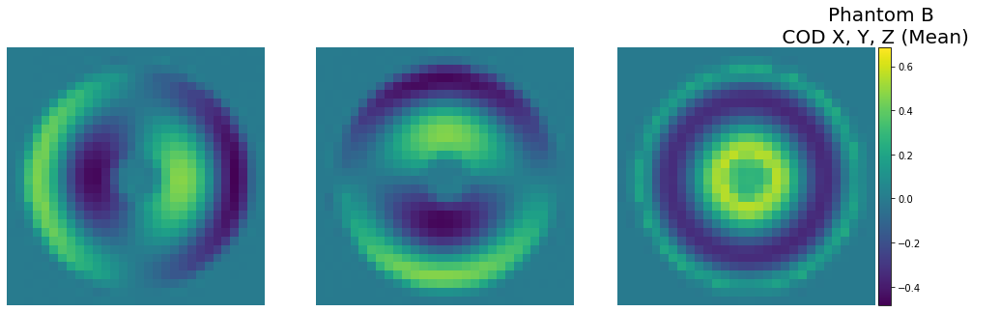

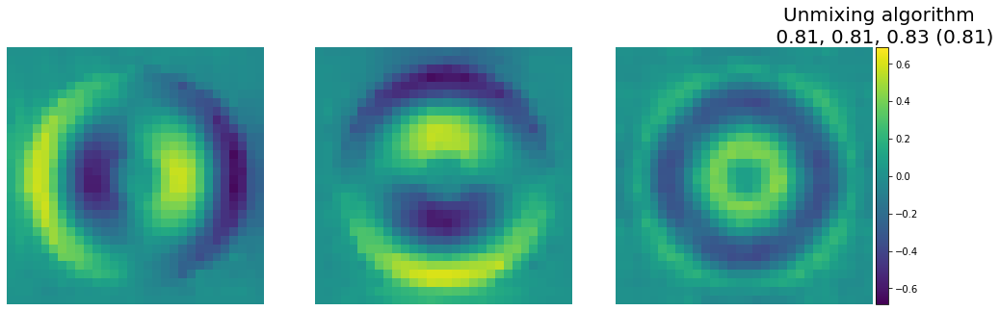

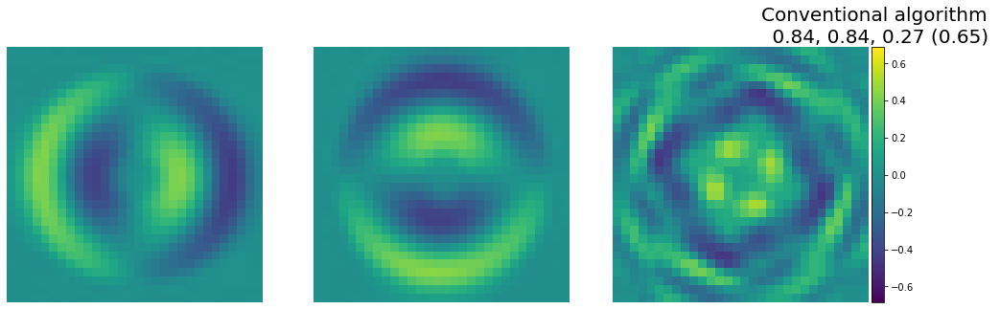

In [59]:
# Plot orthoslices of B with COD values
n=n_pad
i = 15
blim,bmax,bmin = find_lim(BX,BY,BZ)

ma.plot_component_orthoslices(BX,BY,BZ,npad=n,i=i,vmax=bmax,vmin=bmin)
plt.title('Phantom B \n COD X, Y, Z (Mean)    ',fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1m,b2m,b3m,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Unmixing algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1d,b2d,b3d,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Conventional algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

In [ ]:

n_pad=44
n=n_pad
res_m = []
res_m2 = []
all_m = []
all_m2 = []
nmajs=[1,2,3,4,5,6,7,8,9,10]
niters = [3,6,9,12,15,20,25,30,40,50,60,70]
for nmaj in nmajs:
    res_m = []
    res_m2 = []
    for ni in niters:
        t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=ni, 
                                       thresh_range=(0.05,0.8),algorithm='wavelet_sym2',weight=5e-3)
        b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

        codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
        cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
        codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
        res_m.append([codx,cody,codz])

        ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                                 b1m[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])

        res_m2.append(ang_diff)

        print([codx,cody,codz])
        
    all_m.append(res_m)
    all_m2.append(res_m2)
    np.save('Data/iterations_hop_cod_ideal.npy',all_m)
    np.save('Data/iterations1_hop_ang_ideal.npy',all_m2)

In [ ]:
res_d = []
res_d2 = []
for ni in niters:
    b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,as_x,as_y,mesh_params,niter=ni,algorithm='SIRT3D_CUDA',callback_freq=5)
    b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
    res_d.append([codx,cody,codz])
    
    ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                             b1d[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
    
    res_d2.append(ang_diff)
    np.save('Data/iterations_hop_cod_ideal_dual.npy',res_d)
    np.save('Data/iterations_hop_ang_ideal_dual.npy',res_d2)
    
    # plt.imshow(b1d[n:-n,n:-n,15])
    # plt.show()

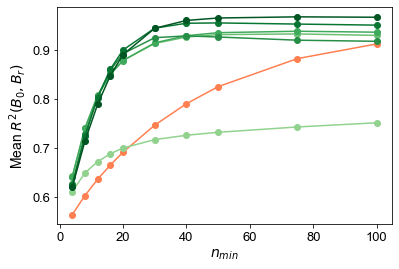

In [67]:
import matplotlib.font_manager
import matplotlib as mpl
# Set font and colormap for plotting
# font = {'family':'serif',
#         'size'   : 12}

font = {'family':'sans-serif','sans-serif':'Arial',
        'size'   : 13}
matplotlib.rc('font', **font)
    

# create figure and axis objects with subplots()
fig,ax = plt.subplots()
# twin object for two different y-axis on the sample plot
#ax2=ax.twinx()

# make a plot
ax.plot(niters,np.mean(res_d,axis=1),'o-',color='coral')
#ax2.plot(niters,res_d2,'o--',color='coral',markerfacecolor='w')

#cmap = matplotlib.cm.get_cmap('BuGn')
cmap = mpl.cm.Greens(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[8:,:-1])

for i in range(len(nmajs)):
    col = cmap(i/6)
    ax.plot(niters,np.mean(all_m[i],axis=1),'o-',color=col)
    # set x-axis label
    ax.set_xlabel("$n_{min}$",fontsize=14)
    # set y-axis label
    ax.set_ylabel("Mean $R^2(B_{0},B_{r})$",fontsize=14)

    # make a plot with different y-axis using second axis object
    #ax2.plot(niters,all_m2[i],'o--',color=col,markerfacecolor='w')
    
    #ax2.set_ylabel("Mean $\cos\\theta$ ",fontsize=14)


plt.show()

# Extra shapes

In [ ]:
phis = phis_s
angles=angles_s
mesh_params = mesh_params_s
BX,BY,BZ = BX_s,BY_s,BZ_s

res_m = []
res_m2 = []
all_m = []
all_m2 = []
for nmaj in nmajs:
    res_m = []
    res_m2 = []
    for ni in niters:
        t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=ni, 
                                       thresh_range=(0.6,0.8),algorithm='wavelet_sym2',weight=0.001)
        b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

        codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
        cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
        codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
        res_m.append([codx,cody,codz])

        ang_diff = angle_difference(BX[n:-n,n:-n,n:-n],BY[n:-n,n:-n,n:-n],BZ[n:-n,n:-n,n:-n],
                                                                 b1m[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])

        res_m2.append(ang_diff)

        print([codx,cody,codz])
        
    all_m.append(res_m)
    all_m2.append(res_m2)
    np.save('Data/iterations_bub_-m.npy',all_m)
    np.save('Data/iterations1_bub_-m2.npy',all_m2)

# Thresholding figure

### Diagrams

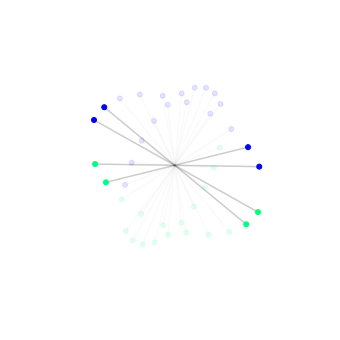

In [7]:
angles = ma.generate_angles(mode='dual',n_tilt=20,alpha=70,beta=70,tilt2='beta')
ws = ma.calculate_A_contributions(angles)

# plot a collection scheme
%matplotlib inline
fig = plt.figure(figsize=(6,6))
ax1 = fig.gca(projection='3d')

bs = []
for i,a in enumerate(angles):
    mrot = ma.rotation_matrix(a[0],a[1],a[2])
    b = np.dot(mrot,[0,0,1])
    bs.append(b)
    cmap='winter_r'#'twilight_shifted'#'Wistia'#'autumn_r' #'winter_r'
    marker='o'#'x'#'|'#'_'
    t=0.8
    if abs(ws[i,0]) > t: #or abs(ws[i,1]) > t or abs(ws[i,2]) > t:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap=cmap,alpha=1,marker=marker)
    else:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.02)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap=cmap,alpha=0.1,marker=marker)

ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax1.set_zticklabels([])
plt.xlabel('x',fontsize='20')
plt.ylabel('y',fontsize='20')
ax1.set_zlabel('z',fontsize='20')
plt.xlim([-1,1])
plt.ylim([-1,1])
ax1.set_zlim([-1,1])
plt.axis('off')

f = plt.gcf()
f.patch.set_facecolor('white')

### Results

In [153]:
def create_hopfion_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    # Generate hopfion
    MX,MY,MZ = ma.Magnetic_Phantom.hopfion(bbox_length_px=100)
    # Crop out the blank space
    MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
    # Reduce resolution to make the simulation smaller
    x=.66
    MXn=zoom(MX, (x,x,x))
    MYn=zoom(MY, (x,x,x))
    MZn=zoom(MZ, (x,x,x))
    MX,MY,MZ=MXn,MYn,MZn
    # Define mesh parameters
    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,220*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))

    # Calculate A and B
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)
    
    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)
    pys = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=548,fyc=482,fringe=10,rc=50,n=0.1,v=.4,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs,pys],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params

def create_bubble_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    name = r'FeGe_220x220x50nm_0B.npy'
    M = np.load(name)
    MX,MY,MZ = M[:,:,:,0],M[:,:,:,1],M[:,:,:,2]

    z=1#.38

    MX=zoom(MX, (z, z, 1))
    MY=zoom(MY, (z, z, 1))
    MZ=zoom(MZ, (z, z, 1))

    # h0= np.hanning(40)
    # hann2d = np.sqrt(np.outer(h0,h0))

    # for i in range(40):
    #     MX[:,:,i] = MX[:,:,i]*hann2d

    # for i in range(40):
    #     MY[:,:,i] = MY[:,:,i]*hann2d

    # for i in range(40):
    #     MZ[:,:,i] = MZ[:,:,i]*hann2d

    p1 = (0,0,0)
    p2=(220*1e-9,220*1e-9,50*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))
    
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)

    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.03,v=.95,c=2000)
    pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.03,v=.95,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs_n,pys_n],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params

def create_sphere_data(tilt=10,a_range=70):
    """" Defaults to create 30x30 images """
    # Generate sphere
    MX,MY,MZ,_ = ma.Magnetic_Phantom.sphere(bbox_length_px=100,rad_m=15e-9)
    # Crop out the blank space
    MX,MY,MZ = MX[20:-20,20:-20,20:-20],MY[20:-20,20:-20,20:-20],MZ[20:-20,20:-20,20:-20]
    # Reduce resolution to make the simulation smaller
    x=.66
    MX=zoom(MX, (x,x,x))
    MY=zoom(MY, (x,x,x))
    MZ=zoom(MZ, (x,x,x))

    MX,MY,MZ = ma.rotate_magnetisation(MX,MY,MZ,30,50,20)

    # Define mesh parameters
    p1 = (0,0,0)
    p2=(100*1e-9,100*1e-9,100*1e-9)
    n = 40
    n_pad=44
    mesh_params = (p1,p2,(n,n,n))

    # Calculate A and B
    AX,AY,AZ,mesh_params2 = ma.calculate_A_3D(MX,MY,MZ,mesh_params=mesh_params,n_pad=n_pad)
    BX,BY,BZ = ma.calculate_B_from_A(AX,AY,AZ,mesh_params=mesh_params2)
    
    #n_pad=n
    as_x,as_y,pxs,pys = ma.dual_axis_phase_generation(MX,MY,MZ,mesh_params,n_tilt= tilt,a_range=a_range,n_pad=n_pad)

    # add noise if desired
    # pxs = ma.noisy_phase(pxs,gaussian=True,noise_level=np.pi,lowpass=True)
    # pys = ma.noisy_phase(pys,gaussian=True,noise_level=np.pi,lowpass=True)

    angles_x = ma.generate_angles(mode='x',n_tilt=tilt,alpha=a_range)
    angles_y = ma.generate_angles(mode='y',n_tilt=tilt,beta=a_range,tilt2='beta')
    # pxs = ma.noisy_phase(pxs,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    # pys = ma.noisy_phase(pys,holo=True,n=2,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=n_pad,fringe=20,fxc=597,fyc=566,rc=50)
    pxs_n = ma.noisy_phase(pxs,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_x,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.7,c=2000)
    pys_n = ma.noisy_phase(pys,holo=True,MX=MX,MY=MY,MZ=MZ,angles=angles_y,mesh_params=mesh_params,n_pad=44,fxc=576,fyc=529,fringe=10,rc=30,n=0.02,v=.7,c=2000)



    # Dual axis data
    bx_p,by_p = ma.dual_axis_B_generation(pxs,pys,mesh_params)

    # Multi axis data
    angles = np.concatenate([as_x,as_y])
    phis = np.concatenate([pxs_n,pys_n],axis=1)
    
    return phis, angles, BX,BY,BZ, mesh_params


In [154]:
phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h = create_hopfion_data()

In [155]:
phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b = create_bubble_data()

In [55]:
phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s = create_sphere_data()

In [156]:
fpath = r'Phantoms/hopfion_phantom.npy'
data = np.array([phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h],dtype=object)
np.save(fpath,data)

In [157]:
fpath = r'Phantoms/bubble_phantom.npy'
data = np.array([phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b],dtype=object)
np.save(fpath,data)

In [58]:
fpath = r'Phantoms/sphere_phantom.npy'
data = np.array([phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s],dtype=object)
np.save(fpath,data)

In [59]:
[phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h] = np.load(r'Phantoms/hopfion_phantom.npy',allow_pickle=True)
[phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b] = np.load(r'Phantoms/bubble_phantom.npy',allow_pickle=True)
[phis_s, angles_s, BX_s,BY_s,BZ_s, mesh_params_s] = np.load(r'Phantoms/sphere_phantom.npy',allow_pickle=True)

In [60]:
ma.plot_phases_interactive(phis_h,angles_h)
ma.plot_phases_interactive(phis_b,angles_b)
ma.plot_phases_interactive(phis_s,angles_s)

interactive(children=(IntSlider(value=9, description='i', max=19), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=9, description='i', max=19), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=9, description='i', max=19), Output()), _dom_classes=('widget-interact',…

In [ ]:
noise = phi

In [ ]:
[3, 28, 0.1879949295030625, 0.842406473375256, 0.01403424461153915],
 0.4734122416382978)

In [199]:
phis = phis_h
angles=angles_h
mesh_params = mesh_params_h
n_pad=44
nmaj=3
nmin=28
weight=5e-3
th1,th2=.2,.8

# Multi axis
t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                       thresh_range=(th1,th2),algorithm='wavelet_sym2',weight=weight)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

# Dual axis
px = phis[:,:10]
py = phis[:,10:]
angx=angles[:10]
angy=angles[10:]
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

Text(0.5, 1.0, 'Conventional algorithm \n 0.46, 0.46, 0.03 (0.32)')

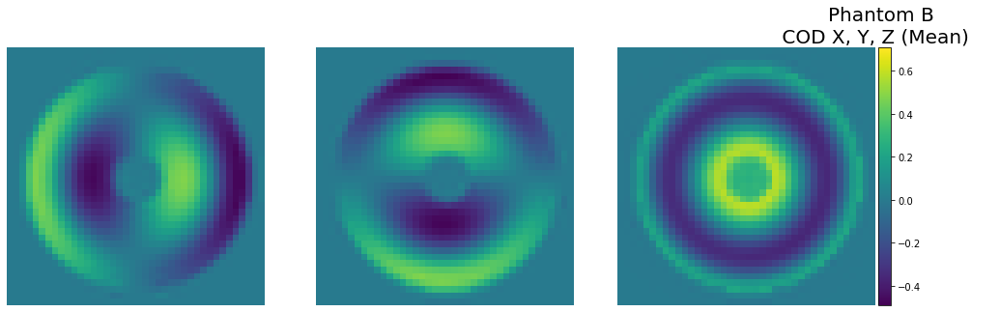

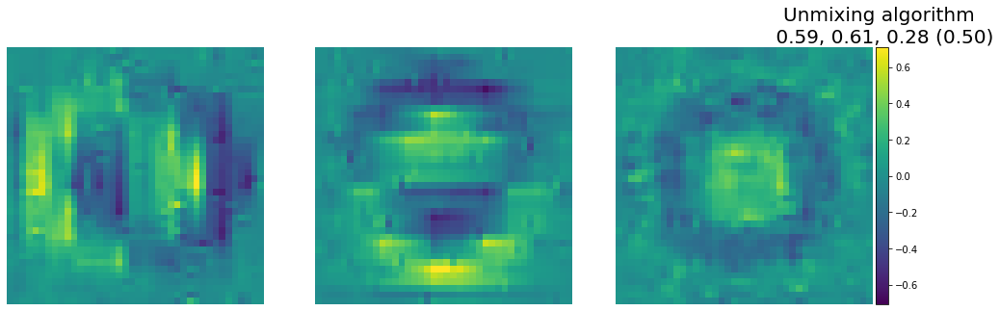

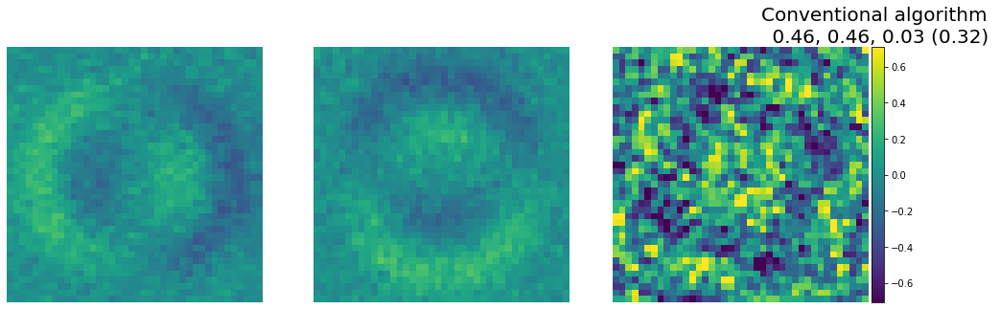

In [200]:
# Plot orthoslices of B with COD values
#BX,BY,BZ=BX_h,BY_h,BZ_h
BX,BY,BZ=BX_h,BY_h,BZ_h
n=n_pad
i = 20
blim,bmax,bmin = find_lim(BX,BY,BZ)

ma.plot_component_orthoslices(BX,BY,BZ,npad=44,i=i,vmax=bmax,vmin=bmin)
plt.title('Phantom B \n COD X, Y, Z (Mean)    ',fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1m,b2m,b3m,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Unmixing algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1d,b2d,b3d,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Conventional algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

In [ ]:
([8, 27, 0.2862887094669117, 0.6723007984415802, 0.002204325904575555],
 0.461990463095353)

In [189]:
phis = phis_b
angles=angles_b
mesh_params = mesh_params_b
n_pad=44
nmaj=3
nmin=10
weight=6e-3
th1,th2=.01,.8

# Multi axis
t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                       thresh_range=(th1,th2),algorithm='wavelet_sym2',weight=weight)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

# Dual axis
px = phis[:,:10]
py = phis[:,10:]
angx=angles[:10]
angy=angles[10:]
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

Text(0.5, 1.0, 'Conventional algorithm \n 0.71, 0.67, 0.15 (0.51)')

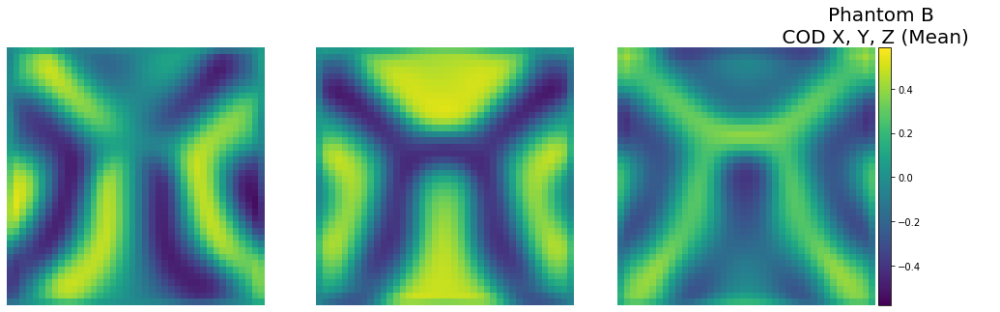

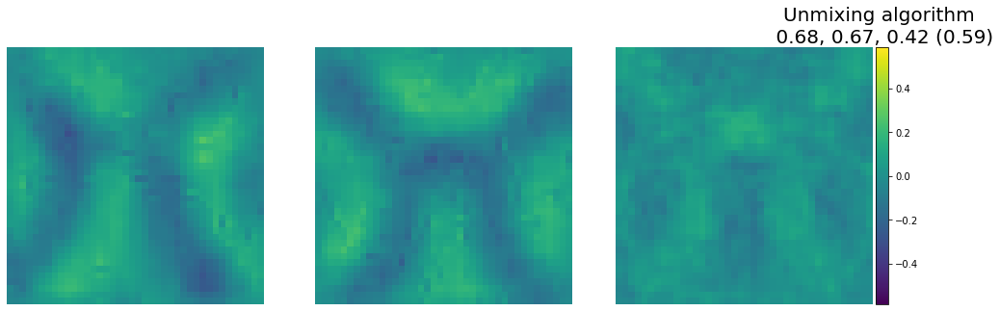

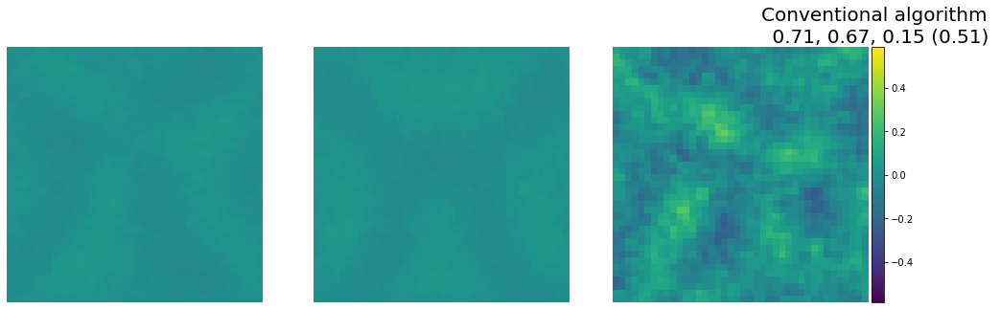

In [190]:
# Plot orthoslices of B with COD values
#BX,BY,BZ=BX_h,BY_h,BZ_h
BX,BY,BZ=BX_b,BY_b,BZ_b
n=n_pad
i = 20
blim,bmax,bmin = find_lim(BX,BY,BZ)

ma.plot_component_orthoslices(BX,BY,BZ,npad=44,i=i,vmax=bmax,vmin=bmin)
plt.title('Phantom B \n COD X, Y, Z (Mean)    ',fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1m,b2m,b3m,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Unmixing algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1d,b2d,b3d,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Conventional algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

In [ ]:
[3, 20, 0.4099250273949032, 0.657777930442959, 0.0029788770118258988] 0.7225816215362038

In [201]:
phis = phis_s
angles=angles_s
mesh_params = mesh_params_s
n_pad=44
nmaj=3
nmin=18
weight=3e-3
t1,t2=0.2,.8

# Multi axis
t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                       thresh_range=(t1,t2),algorithm='wavelet_sym2',weight=weight)
b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)

# Dual axis
px = phis[:,:10]
py = phis[:,10:]
angx=angles[:10]
angy=angles[10:]
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)

Text(0.5, 1.0, 'Conventional algorithm \n 0.55, 0.38, 0.10 (0.34)')

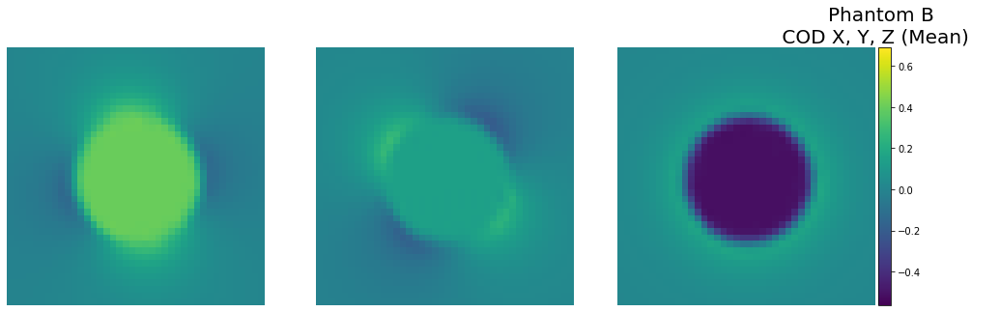

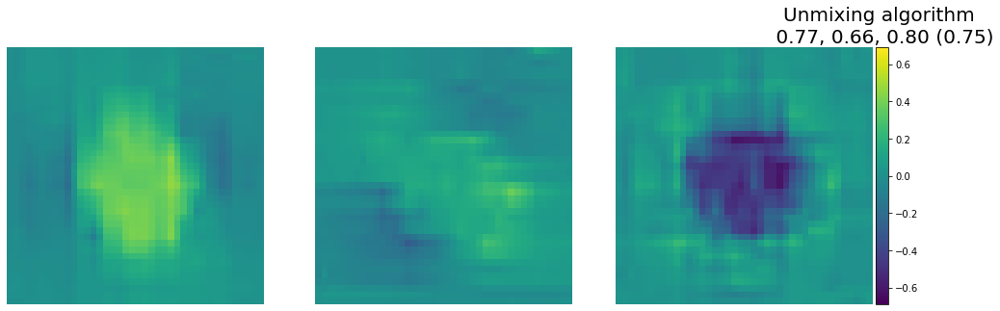

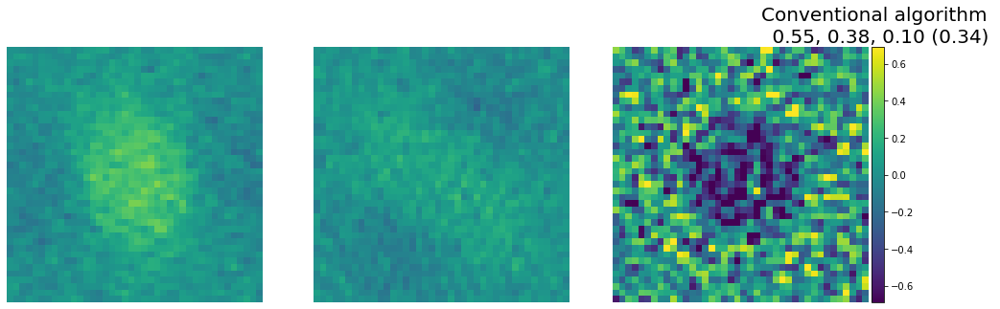

In [202]:
# Plot orthoslices of B with COD values
#BX,BY,BZ=BX_h,BY_h,BZ_h
BX,BY,BZ=BX_s,BY_s,BZ_s
n=n_pad
i = 20
blim,bmax,bmin = find_lim(BX,BY,BZ)

ma.plot_component_orthoslices(BX,BY,BZ,npad=44,i=i,vmax=bmax,vmin=bmin)
plt.title('Phantom B \n COD X, Y, Z (Mean)    ',fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1m,b2m,b3m,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Unmixing algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])
ma.plot_component_orthoslices(b1d,b2d,b3d,npad=n,i=i,vmax=blim,vmin=-blim)
plt.title('Conventional algorithm \n %.2f, %.2f, %.2f (%.2f)' % (codx,cody,codz,np.mean([codx,cody,codz])),fontsize=20)

In [145]:
np.mean([codx,cody,codz])

0.381180923754273

In [69]:
def fmax_polarpeak(params,phis):
    """ Function to be maximised
        First argument is variables to be optimised shifts = (xshift,yshift)
        Second argument is the image array """
    nmaj,nmin,t1,t2,weight=params
    t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                       thresh_range=(t1,t2),algorithm='wavelet_sym2',weight=weight)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)
    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
    cod = np.mean([codx,cody,codz])
    
    return cod

In [70]:
import random
def simAnneal(f, seed_x, phis,numsteps=20, sigma=60):
    """ 
    Input a function to be optimised, f(x,*args)
    Input an initial guess at x, in this case our assumed shift - (0,0) should be close-ish
    We also need to input the relevant image, will will go to *args in f,
    Then we control the number of iterations, and the s.d. of a gaussian distribution around the initial guess"""
    
    # Setup
    optimal_x = [i for i in seed_x]
    optimal_w = f(optimal_x,phis)
    cur_w = optimal_w#f(seed_x,phis)
    cur_x = optimal_x
    
    # Iterate for given number of steps
    for i in range(numsteps):
        new_x = np.array(cur_x)
        # New guess is previous guess + number randomly chosen from Gaussian distribution
        # The width of the distribution decreases with each iteration
        
        # make new guesses with constraints
        lower,upper=2,10
        mu,sigma=seed_x[0],10 * (numsteps-i*.9)/numsteps
        new_x[0] = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])

        lower,upper=5,100
        mu,sigma=seed_x[1],30* (numsteps-i*.9)/numsteps
        new_x[1] = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])

        lower,upper=0.01,0.7
        mu,sigma=seed_x[2],.4* (numsteps-i*.9)/numsteps
        new_x[2] = stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0]

        lower,upper=0.5,0.9
        mu,sigma=seed_x[3],.4* (numsteps-i*.9)/numsteps
        new_x[3] = stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0]

        lower,upper=1,9
        mu,sigma=seed_x[4],3* (numsteps-i*.9)/numsteps
        val = stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0]
        lower,upper=-6,-1
        mu,sigma=np.log10(seed_x[4]),3* (numsteps-i*.9)/numsteps
        exp = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])
        new_x[4]=val*10**exp
        
        try:
            new_x = new_x.tolist()
        except:
            pass
        new_x[0]=int(new_x[0])
        new_x[1]=int(new_x[1])
        
        # Evaluate function with new guess
        try:
            new_w = f(new_x,phis)
            print(new_x,new_w)
        except:
            print(new_x)
            print('bad guess')
            new_w=cur_w
        
        # Update current guess for two conditions:
            # New guess was better than current guess
            # Random number is bigger than (1-new/current)
        if (new_w > cur_w) or (random.random()  > (1 - new_w / cur_w)) :
            cur_x = new_x
            cur_w = new_w
            
            # Update optimal guess if current is better than previous optimal
            if cur_w > optimal_w:
                optimal_w = cur_w
                optimal_x = cur_x
                
    return optimal_x, optimal_w

In [73]:
import scipy.stats as stats
phis = phis_s
angles=angles_s
mesh_params = mesh_params_s
BX, BY, BZ = BX_s, BY_s, BZ_s
n_pad=44
nmaj=2
nmin=30
weight=1e-3
t=0.6

params_0 = 4,30,.6,.6,0.001
opt=simAnneal(fmax_polarpeak,params_0,phis,numsteps=60)

[3, 72, 0.06865409144885082, 0.6296751003452449, 0.027112127675005624] 0.5198745882227023
[9, 29, 0.6307245574416847, 0.5100376610445911, 0.00044477223368610493] 0.3785224552689132
[5, 26, 0.3162202318302175, 0.7603367867422297, 0.0010983223463234694] 0.5593116363438556
[5, 28, 0.544861034474495, 0.7405337685222544, 0.05283819140885354] 0.4660193830192476
[8, 88, 0.5618614175141597, 0.6856338190869046, 0.03283773364733165] 0.5162532509570378
[3, 30, 0.20743272918085304, 0.7826497454284569, 0.02299620327105778] 0.5671258123977362
[4, 32, 0.19353700028564857, 0.5871644646685925, 0.3204114528471549] 0.1522882525326814
[5, 62, 0.5224160004922586, 0.7893053348334871, 0.21041451316802068] 0.3322980560403496
[8, 72, 0.02688956274426968, 0.7729285072749993, 0.0010655352333771974] 0.12141727751176361
[8, 95, 0.25580962307230815, 0.797729741041182, 0.0711520533901694] 0.40150113581076735
[6, 7, 0.6356858896878035, 0.8708841264052334, 0.033928125421543304] 0.4926526441765719
[3, 27, 0.62919830307

In [509]:
opt

([3, 16, 0.5580235964598195, 0.8479852143729085, 0.0024075560386796293],
 0.7299006690086548)

In [74]:
phis = phis_b
angles=angles_b
mesh_params = mesh_params_b
BX, BY, BZ = BX_b, BY_b, BZ_b
n_pad=44
nmaj=2
nmin=30
weight=1e-3
t=0.6

params_0 = 4,30,.6,.6,0.001
opt=simAnneal(fmax_polarpeak,params_0,phis,numsteps=60)

[4, 48, 0.39819129197520586, 0.7737658986080717, 2.56428986443675e-05] 0.3042606351995912
[9, 27, 0.10919737487152686, 0.810833021567802, 0.02389850091116902] 0.43881071507751085
[9, 36, 0.26217331791609566, 0.8420311622378991, 3.778927053171306e-05] 0.35853586486728045
[7, 50, 0.6765444081628347, 0.5107521674145253, 0.24837888965463747] 0.11816033562470214
[5, 43, 0.21135164290836317, 0.542506798087843, 0.44362978624586547] 0.07614809976364316
[9, 62, 0.39365547874325324, 0.551659527183598, 0.00018309069970576337]
bad guess
[4, 60, 0.27509057788898394, 0.6041874649359972, 4.537828748208731e-05]
bad guess
[6, 83, 0.15697358698869307, 0.8303153455252458, 0.002447738589465971]
bad guess
[5, 32, 0.6156069603545126, 0.5531354006113812, 0.010606243586982225]
bad guess
[2, 41, 0.12268227086391531, 0.8393232553238217, 3.453060511415926e-05]
bad guess
[6, 36, 0.6426162398637715, 0.551824864583982, 0.003017749651248402]
bad guess
[2, 25, 0.28655088545535684, 0.6222814470804253, 0.13845498425110

In [75]:
phis = phis_h
angles=angles_h
mesh_params = mesh_params_h
BX, BY, BZ = BX_h, BY_h, BZ_h
n_pad=44
nmaj=2
nmin=30
weight=1e-3
t=0.6

params_0 = 4,30,.6,.6,0.001
opt=simAnneal(fmax_polarpeak,params_0,phis,numsteps=60)

KeyboardInterrupt: 

In [106]:
opt

([6, 24, 0.3316226172037819, 0.6759640329629188, 0.0032338853292194158],
 0.6710288901357941)

In [ ]:
[8, 31, 0.5985601993251738, 0.578200962140814, 0.0030708286102649873] 0.7095389596567602

In [336]:
i=1
j= 1
seed_x=params_0
sigma=50
numsteps=20
new_x = np.array([random.gauss(x, sigma* (numsteps-i*.75)/numsteps) for x in seed_x])
while j<100000:
    j+=1
    new_x = np.array([random.gauss(x, sigma* (numsteps-i*.75)/numsteps) for x in seed_x])
    new_x[0] = np.
    cond = new_x[0] <2 or new_x[0] >10 or new_x[1] <5 or new_x[1] >100 or new_x[2] <0.01 or new_x[2] >0.7 or new_x[3] <0.5 or new_x[3] > 0.9 or new_x[4] < 1e-6 or new_x[4] >0.1
    if cond == 0:
        #new_x = np.array([random.gauss(i, sigma* (numsteps-i*.75)/numsteps) for i in seed_x])
        
        new_x = int(new_x[0]),int(new_x[1]),new_x[2],new_x[3],new_x[4]
        print(i,new_x)
        break

In [493]:
import scipy.stats as stats

lower,upper=2,10
mu,sigma=seed_x[0],10
new_x[0] = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])

lower,upper=5,100
mu,sigma=seed_x[1],30
new_x[1] = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])

lower,upper=0.01,0.7
mu,sigma=seed_x[2],.4
new_x[2] = stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0]

lower,upper=0.5,0.9
mu,sigma=seed_x[3],.4
new_x[3] = stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0]

lower,upper=1,9
mu,sigma=seed_x[4],3
val = stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0]
lower,upper=-6,-1
mu,sigma=np.log10(seed_x[4]),3
exp = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])
new_x[4]=val*10**exp

# new_x = new_x.tolist()
new_x[0]=int(new_x[0])
new_x[1]=int(new_x[1])

new_x

[6, 42, 0.6897440042867949, 0.592433125074804, 0.00037010611457789376]

In [473]:
exp = int(stats.truncnorm((lower - mu) / sigma, (upper - mu) / sigma, loc=mu, scale=sigma).rvs(1)[0])
np.e**exp

-4

## Actual thresholding bit

In [542]:
phis = phis_s
angles=angles_s
mesh_params = mesh_params_s
BX,BY,BZ=BX_s,BY_s,BZ_s
n_pad=49
nmaj=3
nmin=16
weight=2e-3
t


# Dual axis
px = phis[:,:10]
py = phis[:,10:]
angx=angles[:10]
angy=angles[10:]
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])

cod = np.mean([codx,cody,codz])
print('dual',cod)

res = []
ts = [0.01,.1,.2,.3,.4,.5,.6,.7,.8,.9]
for t in ts:
    # Multi axis
    t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(t,t),algorithm='wavelet_sym2',weight=weight)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)
    
    n=n_pad
    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
    
    cod = np.mean([codx,cody,codz])
    res.append(cod)
    
np.save('Data/thresh_s.npy',res)

dual 0.4042965769731974


In [543]:
[phis_h, angles_h, BX_h,BY_h,BZ_h, mesh_params_h] = np.load(r'Phantoms/hopfion_phantom.npy',allow_pickle=True)
phis = phis_h
angles=angles_h
mesh_params = mesh_params_h
BX,BY,BZ=BX_h,BY_h,BZ_h
n_pad=49
nmaj=3
nmin=30
weight=1e-3
t


# Dual axis
px = phis[:,:10]
py = phis[:,10:]
angx=angles[:10]
angy=angles[10:]
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])

cod = np.mean([codx,cody,codz])
print('dual',cod)

res = []
ts = [0.01,.1,.2,.3,.4,.5,.6,.7,.8,.9]
for t in ts:
    # Multi axis
    t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(t,t),algorithm='wavelet_sym2',weight=weight)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)
    
    n=n_pad
    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
    
    cod = np.mean([codx,cody,codz])
    res.append(cod)
    
np.save('Data/thresh_h.npy',res)

dual 0.44334995339943956


In [537]:
np.shape(BX_h)

(128, 128, 128)

In [110]:
[phis_b, angles_b, BX_b,BY_b,BZ_b, mesh_params_b] = np.load(r'Phantoms/bubble_phantom2.npy',allow_pickle=True)
phis = phis_b
angles=angles_b
mesh_params = mesh_params_b
BX,BY,BZ=BX_b,BY_b,BZ_b
n_pad=49
nmaj=3
nmin=26
weight=3e-3
t


# Dual axis
px = phis[:,:10]
py = phis[:,10:]
angx=angles[:10]
angy=angles[10:]
bx_p,by_p = ma.dual_axis_B_generation(px,py,mesh_params)
b1d,b2d = ma.dual_axis_reconstruction(bx_p,by_p ,angx,angy,mesh_params,niter=nmin,algorithm='SIRT3D_CUDA',callback_freq=5)
b3d = ma.dual_axis_bz_from_bxby(b1d,b2d)
codx = ma.COD(BX[n:-n,n:-n,n:-n],b1d[n:-n,n:-n,n:-n])
cody = ma.COD(BY[n:-n,n:-n,n:-n],b2d[n:-n,n:-n,n:-n])
codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3d[n:-n,n:-n,n:-n])

cod = np.mean([codx,cody,codz])
print('dual',cod)

res = []
ts = [0.01,.1,.2,.3,.4,.5,.6,.7,.8,.9]
for t in ts:
    # Multi axis
    t1,t2,t3=ma.iterative_update_algorithm(phis,angles,mesh_params,n_pad,n_full_iter=nmaj,n_step_iter=nmin, 
                                           thresh_range=(t,t),algorithm='wavelet_sym2',weight=weight)
    b1m,b2m,b3m = ma.calculate_B_from_A(t1,t2,t3,mesh_params=mesh_params)
    
    n=n_pad
    codx = ma.COD(BX[n:-n,n:-n,n:-n],b1m[n:-n,n:-n,n:-n])
    cody = ma.COD(BY[n:-n,n:-n,n:-n],b2m[n:-n,n:-n,n:-n])
    codz = ma.COD(BZ[n:-n,n:-n,n:-n],b3m[n:-n,n:-n,n:-n])
    
    cod = np.mean([codx,cody,codz])
    res.append(cod)
    
np.save('Data/thresh_b2.npy',res)

dual 0.4864400909426818


In [111]:
ts = [0.01,.1,.2,.3,.4,.5,.6,.7,.8,.9]


res_s = np.load(r'Data/thresh_s.npy')
res_h = np.load(r'Data/thresh_h.npy')
res_b = np.load(r'Data/thresh_b2.npy')
d_s = 0.404
d_h=0.443
d_b = 0.486

Text(0, 0.5, 'COD')

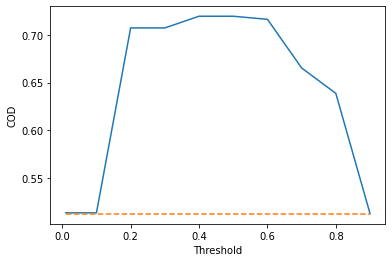

In [545]:
plt.plot(ts,res_s)
plt.plot((0.01,.9),(d_s,d_s),'--')

plt.xlabel('Threshold')
plt.ylabel('COD')

Text(0, 0.5, 'COD')

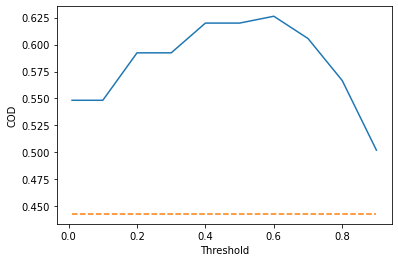

In [547]:
plt.plot(ts,res_h)
plt.plot((0.01,.9),(d_h,d_h),'--')

plt.xlabel('Threshold')
plt.ylabel('COD')

Text(0, 0.5, 'COD')

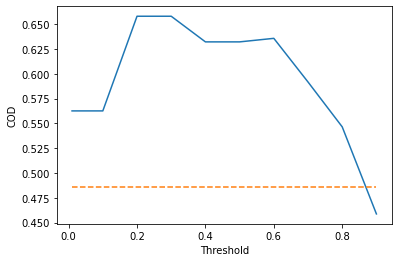

In [112]:
plt.plot(ts,res_b)
plt.plot((0.01,.9),(d_b,d_b),'--')

plt.xlabel('Threshold')
plt.ylabel('COD')

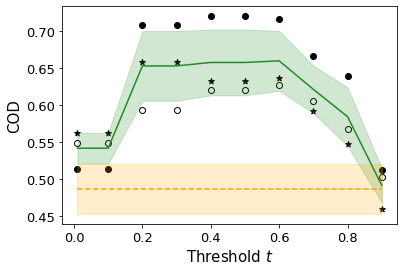

In [148]:
import matplotlib
font = {'sans-serif' :'Ariel',
        'size'   : 13}
matplotlib.rc('font', **font)

plt.scatter(ts,res_b,marker='*',color='k')
plt.scatter(ts,res_h,marker='o',c='white',edgecolor='k')
plt.scatter(ts,res_s,marker='o',color='k')

res_m = np.mean([res_b,res_h,res_s],axis=0)
plt.plot(ts, res_m,'-',color=r'forestgreen')

e = np.std([res_b,res_h,res_s],axis=0)
plt.fill_between(ts,res_m-e,res_m+e,color=r'forestgreen',alpha=.2)

d_m = np.mean([d_b,d_s,d_h])
e = np.std([d_b,d_s,d_h])
plt.plot((0.01,.9),(d_b,d_b),'--',color='orange')
plt.fill_between((0.01,.9),(d_b-e,d_b-e),(d_b+e,d_b+e),color='orange',alpha=.2)

plt.xlabel('Threshold $t$',fontsize=15)
plt.ylabel('COD',fontsize=15)

f = plt.gcf()
f.patch.set_facecolor('white')

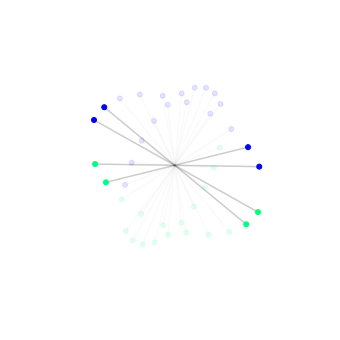

In [152]:
angles = ma.generate_angles(mode='dual',n_tilt=20,alpha=70,beta=70,tilt2='beta')
ws = ma.calculate_A_contributions(angles)

# plot a collection scheme
%matplotlib inline
fig = plt.figure(figsize=(6,6))
ax1 = fig.gca(projection='3d')

bs = []
for i,a in enumerate(angles):
    mrot = ma.rotation_matrix(a[0],a[1],a[2])
    b = np.dot(mrot,[0,0,1])
    bs.append(b)
    cmap='winter_r'#'twilight_shifted'#'Wistia'#'autumn_r' #'winter_r'
    marker='o'#'x'#'|'#'_'
    t=0.8
    if abs(ws[i,0]) > t: #or abs(ws[i,1]) > t or abs(ws[i,2]) > t:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap=cmap,alpha=1,marker=marker)
    else:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.02)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap=cmap,alpha=0.1,marker=marker)

ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax1.set_zticklabels([])
plt.xlabel('x',fontsize='20')
plt.ylabel('y',fontsize='20')
ax1.set_zlabel('z',fontsize='20')
plt.xlim([-1,1])
plt.ylim([-1,1])
ax1.set_zlim([-1,1])
plt.axis('off')

f = plt.gcf()
f.patch.set_facecolor('white')

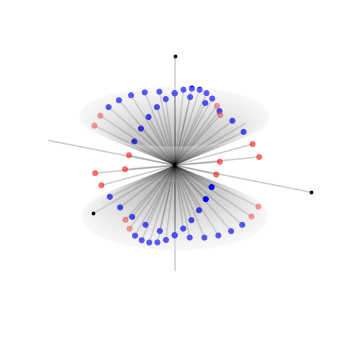

In [214]:
angles = ([0,0,90],[0,90,0],[90,0,0])
ws = ma.calculate_A_contributions(angles)

# plot a collection scheme
%matplotlib inline
fig = plt.figure(figsize=(6,6))
ax1 = fig.gca(projection='3d')

# AXES
bs = []
for i,a in enumerate(angles):
    mrot = ma.rotation_matrix(a[0],a[1],a[2])
    b = np.dot(mrot,[0,0,1.5])
    bs.append(b)
    cmap='winter_r'#'twilight_shifted'#'Wistia'#'autumn_r' #'winter_r'
    marker='o'#'x'#'|'#'_'
    t=0.6
    plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
    ax1.scatter([b[0]],[b[1]],[b[2]],c='k',s=30,alpha=1,marker='.')
    
    
# CONE
h=.7
t=.6
theta = np.arccos(t)*360/(2*np.pi)
x = 1/np.tan(np.deg2rad(theta))
rval=h/x
theta = np.linspace(0, 2*np.pi, 100)
r = np.linspace(0, rval, 100)
t,R =np.meshgrid(theta, r)

X = R*np.cos(t)
Y = R*np.sin(t)
Z = R*x

ax1.plot_surface(X, Y, Z,alpha=0.4, cmap='Greys_r',vmax=.8)
ax1.plot_surface(X, Y, -Z,alpha=0.4, cmap='Greys',vmin=-.8)



# POINTS
angles = ma.generate_angles(mode='dual',n_tilt=30,alpha=70,beta=70,tilt2='beta')
ws = ma.calculate_A_contributions(angles)
bs = []
for i,a in enumerate(angles):
    mrot = ma.rotation_matrix(a[0],a[1],a[2])
    b = np.dot(mrot,[0,0,1])
    bs.append(b)
    #cmap='coolwarm'#'twilight_shifted'#'Wistia'#'autumn_r' #'winter_r'
    marker='o'#'x'#'|'#'_'
    t=0.6
    if abs(ws[i,2]) > t: #or abs(ws[i,1]) > t or abs(ws[i,2]) > t:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
        #ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap='twilight_shifted',alpha=1,marker=marker)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],s=25,c='blue',alpha=1,marker=marker)
    else:
        plt.plot([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],'-',color='k',alpha=.2)
        #ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],c=[-b[2],b[2]],s=25,cmap='winter_r',alpha=1,marker=marker,vmax=.8)
        ax1.scatter([-b[0],b[0]],[-b[1],b[1]],[-b[2],b[2]],s=25,c='red',alpha=.5,marker=marker)




    
    
    
ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax1.set_zticklabels([])
plt.xlabel('x',fontsize='20')
plt.ylabel('y',fontsize='20')
ax1.set_zlabel('z',fontsize='20')
plt.xlim([-1,1])
plt.ylim([-1,1])
ax1.set_zlim([-1,1])
plt.axis('off')

ax1.azim = -60
ax1.dist = 10
ax1.elev = 20


f = plt.gcf()
f.patch.set_facecolor('white')

In [215]:
angles

[[-70.0, 0, 0],
 [-60.0, 0, 0],
 [-50.0, 0, 0],
 [-40.0, 0, 0],
 [-30.0, 0, 0],
 [-20.0, 0, 0],
 [-10.0, 0, 0],
 [0.0, 0, 0],
 [10.0, 0, 0],
 [20.0, 0, 0],
 [30.0, 0, 0],
 [40.0, 0, 0],
 [50.0, 0, 0],
 [60.0, 0, 0],
 [70.0, 0, 0],
 [0, -70.0, 0],
 [0, -60.0, 0],
 [0, -50.0, 0],
 [0, -40.0, 0],
 [0, -30.0, 0],
 [0, -20.0, 0],
 [0, -10.0, 0],
 [0, 0.0, 0],
 [0, 10.0, 0],
 [0, 20.0, 0],
 [0, 30.0, 0],
 [0, 40.0, 0],
 [0, 50.0, 0],
 [0, 60.0, 0],
 [0, 70.0, 0]]

In [216]:
ws

array([[ 0.        , -0.93969262,  0.34202014],
       [ 0.        , -0.8660254 ,  0.5       ],
       [ 0.        , -0.76604444,  0.64278761],
       [ 0.        , -0.64278761,  0.76604444],
       [ 0.        , -0.5       ,  0.8660254 ],
       [ 0.        , -0.34202014,  0.93969262],
       [ 0.        , -0.17364818,  0.98480775],
       [ 0.        ,  0.        ,  1.        ],
       [ 0.        ,  0.17364818,  0.98480775],
       [ 0.        ,  0.34202014,  0.93969262],
       [ 0.        ,  0.5       ,  0.8660254 ],
       [ 0.        ,  0.64278761,  0.76604444],
       [ 0.        ,  0.76604444,  0.64278761],
       [ 0.        ,  0.8660254 ,  0.5       ],
       [ 0.        ,  0.93969262,  0.34202014],
       [ 0.93969262,  0.        ,  0.34202014],
       [ 0.8660254 ,  0.        ,  0.5       ],
       [ 0.76604444,  0.        ,  0.64278761],
       [ 0.64278761,  0.        ,  0.76604444],
       [ 0.5       ,  0.        ,  0.8660254 ],
       [ 0.34202014,  0.        ,  0.939

In [3]:
f=.64
_,_,_,p = ma.generate_sphere(n=100*f,r=30*f)

In [4]:
angles= ma.generate_angles(n_tilt=10)
vectors = ma.generate_vectors(angles)
raw_data = ma.generate_proj_data(p,angles)
raw_data = ma.noisy(raw_data,noise_typ='poisson',val_pois=200)

In [5]:
raw_data*=100

In [5]:
r_tv0 = ma.generate_reconstruction(raw_data,vectors,algorithm='TV_unnorm_scaled',niter=5,weight=1)

In [ ]:
plt.imsho

In [7]:
ni = 50
w = 1
r_tv0 = ma.generate_reconstruction(raw_data,vectors,algorithm='TV1_unnorm',niter=ni,weight=0)
r_tv1 = ma.generate_reconstruction(raw_data,vectors,algorithm='TV1_unnorm',niter=ni,weight=1)
r_w = ma.generate_reconstruction(raw_data,vectors,algorithm='wavelet_coif1',niter=ni,weight=0)
r_s = ma.generate_reconstruction(raw_data,vectors,algorithm='SIRT3D_CUDA',niter=ni,weight=w)

Text(0.5, 1.0, 'Wavelet, $\\lambda = 0$')

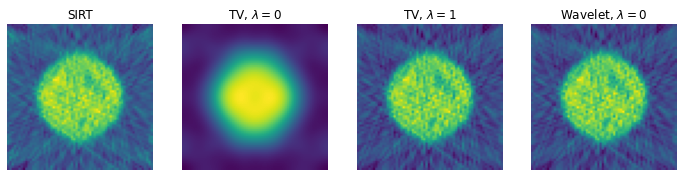

In [9]:
f,axs=plt.subplots(ncols=4,figsize=(12,9))
axs[0].imshow(r_s[:,:,30])
axs[1].imshow(r_tv0[:,:,30])
axs[2].imshow(r_tv1[:,:,30])
axs[3].imshow(r_w[:,:,30])

for ax in axs:
    ax.axis('off')
    
axs[0].set_title('SIRT')
axs[1].set_title('TV, $\lambda = 0$')
axs[2].set_title('TV, $\lambda = 1$')
axs[3].set_title('Wavelet, $\lambda = 0$')

In [13]:
ma.COD(r_tv0,r_tv1)

1.0

In [56]:
np.max(raw_data)

119.5